# 1 - How the evolution of the Yen is impacting the different japanese sector and the HouseHolds  

In this notebook, you will find the work of Thomas, Amaury, Luca and Alexandre.

This paper aimed to deeply analyze how the fluctuations in the Japanese yen affect household consumption, import and export, tourism, and production of goods in Japan. To investigate how the yen's exchange rates have fared against most of these major currencies—that is, the US Dollar (USD), the Chinese Yuan (CNY), and the JXY index—and to discover some of the direct and indirect influences of currency movements on economic performance and societal well-being, we continue below. The research scope is a detailed investigation regarding the relationship between Gross Domestic Product (GDP) and exchange rates, which affect household income and spending patterns, sectoral trade balances, and the overall economic productivity. This study applies a combination of OLS, VAR, and NARDL models to offer an all-round perspective on the yen as an influencer in shaping economic landscapes within Japan, and to allow policymakers and stakeholders who make critical decisions to do so from an informed point of view.

#### Overview of the Japanese Economy and the Significance of the Yen
Japan is the third largest economy in the world, having a high level of technological development and a strong manufacturing sector. Furthermore, Japan is one of the most significant contributors to global trade. Being a highly industrialized country, Japan has very few numbers of industries. Its major industries include motor vehicle production, electronics, robotics, and precision machinery. Japan also has a well-developed service sector where finance, real estate, and tourism play an important role.

Lately, Japan has been going through various economic challenges such as an aging population, deflationary pressures, and slow GDP growth. It is for this reason that the government of Japan and the Bank of Japan have been formulating various monetary and fiscal policies geared toward the stimulation of economic growth in achieving stable inflation. At the center of these efforts is managing the Japanese yen (JPY), the official currency of Japan. The importance of yen in the economy of Japan is varied:

International Trade Competitiveness: Japan relies so much on its trade balance since it is an export oriented economy. The value of the yen deep affects this competitiveness of Japanese goods in international markets. If the yen is weaker, Japanese exports become less expensive, quite attractive for foreign buyers, hence increases the country's trade surplus. A stronger yen, on the other hand, may turn out to be expensive for the exports and make them less competitive.

Monetary Policy: The Bank of Japan uses the exchange rate of the yen as an active instrument to affect conditions in the economy. This takes the form of its actions through quantitative easing and adjustments to interest rates. Thus, the value of the yen is often a reflection of these policy actions.

Investment Flows: Being a safe-haven currency, it is normally attractive to investors when global economic uncertainties rise. This will then generally affect the value of the yen. Fluctuations in the value of the yen are seen due to the sentiment shown by the investors and their appetite for risk. The inflow and outflow of capital into Japan impact domestic markets and the country's stability.

Consumer Purchasing Power: A strong yen raises import costs, putting upward pressures on domestic prices and thus affecting consumer purchasing power. A stronger yen can reduce the price of imported goods and services, which benefits consumers, but it can also add to deflationary pressures.

Debt and Interest Rates: Japan's public debt level is extremely high, so Japan must track the yen's value to keep interest rates low to service their debt at manageable levels to maintain fiscal health and a reasonable level of public indebtedness.

This is feasible in a globalized context in which uncertain times prevail and trade dynamics are changing continuously. The potential impact of the yen on every sector of the Japanese economy can best be appraised through research that seeks to deduce the effects of exchange rate fluctuations on Japan's economic performance, as well as ways to improve economic resilience and growth. 

In [98]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import statsmodels.api as sm
from sklearn.linear_model import LinearRegression
import datetime as dt
import requests
from bs4 import BeautifulSoup
from statsmodels.tsa.ar_model import AutoReg
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.arima_model import ARIMA
import statsmodels.formula.api as smf
from statsmodels.tsa.api import VAR
from arch.unitroot import ADF, PhillipsPerron
from statsmodels.tsa.ardl import ARDL
from arch.unitroot import PhillipsPerron, ZivotAndrews
from sklearn.impute import KNNImputer
from statsmodels.tools import add_constant
from sklearn.model_selection import train_test_split
from statsmodels.tsa.seasonal import seasonal_decompose
import statsmodels.tsa.api as tsa
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.seasonal import STL

# 2 - Table of Contents
* [Chapter - Exchange rates](#chapter1)
    * [USD/YEN](#section_1_1)
    * [JXY](#section_1_2)
    * [CNY/YEN](#section_1_3)
* [Chapter - GDP](#chapter2)
    * [GDP and exchange rates](#section_2_1)
        * [GDP and USD/YEN](#sub_section_2_1_1)
        * [GDP and JXY](#sub_section_2_1_2)
    * [GDP Analysis](#section_2_2)
        * [GDP and JXY with OLS model](#sub_section_2_2_1)
        * [GDP and JXY with VAR model](#sub_section_2_2_2)
    * [GDP, why those results](#section_2_3)
* [Chapter - Households Consumption](#chapter3)
    * [HC and JXY](#section_3_1)
    * [Research Paper comparison](#section_3_2)
        * [NARDL model](#sub_section_3_2_1)
        * [Result interpretation](#sub_section_3_2_2)
        * [Comparison with result from research paper](#sub_section_3_2_3)
    * [HC details](#section_3_3)
    * [HC and mean Salary](#section_3_4)
        * [Why the Mean salary was decreasing](#sub_section_3_4_1)
        * [Why those results](#sub_section_3_4_2)
    * [HC and House prices](#section_3_5)
* [Chapter - Imports and exports](#chapter4)
    * [Comparison with JXY](#section_4_1)
        * [My analysis](#sub_section_4_1_1)
    * [Results interpretation](#section_4_3)
        * [Comparing with Import Volume](#sub_section_4_3_1)
* [Chapter - Import and Export details](#chapter6)
    * [Exports](#section_6_1)
        * [Exports details](#sub_section_6_1_1)
    * [Imports](#section_6_2)
        * [Imports details](#sub_section_6_2_1)
* [Chapter - Tourism](#chapter7)
* [Chapter - Production of goods](#chapter5)
    * [For everysector](#section_5_1)

# 3 - Chapter - Exchange rates <a class="anchor" id="chapter1"></a>

### 3.01 - Dollar/Yen monthly  <a id="section_1_1"></a>
From https://www.investing.com/currencies/usd-jpy-historical-data

This is the data for the value of the yen in a monthly plan. This data represent how much Yen you can buy with 1 US dollar

In [2]:
usd_yen = pd.read_csv('datas/USD_JPY_monthly.csv')
usd_yen['Date'] = pd.to_datetime(usd_yen['Date'])
usd_yen = usd_yen.sort_values(by='Date')

In [3]:
usd_yen

,Date,Price,Open,High,Low,Vol.,Change %
639,1971-02-01,357.56,357.56,357.56,357.56,NaN,-0.04%
638,1971-03-01,357.42,357.42,357.42,357.42,NaN,-0.04%
637,1971-04-01,357.40,357.40,357.40,357.40,NaN,-0.01%
636,1971-05-01,357.40,357.40,357.40,357.40,NaN,0.00%
635,1971-06-01,357.40,357.40,357.40,357.40,NaN,0.00%
...,...,...,...,...,...,...,...
4,2024-01-01,146.88,140.84,148.82,140.81,NaN,4.13%
3,2024-02-01,149.98,146.90,150.90,145.89,NaN,2.11%
2,2024-03-01,151.31,149.98,151.98,146.48,NaN,0.89%
1,2024-04-01,157.80,151.32,160.04,150.81,NaN,4.29%


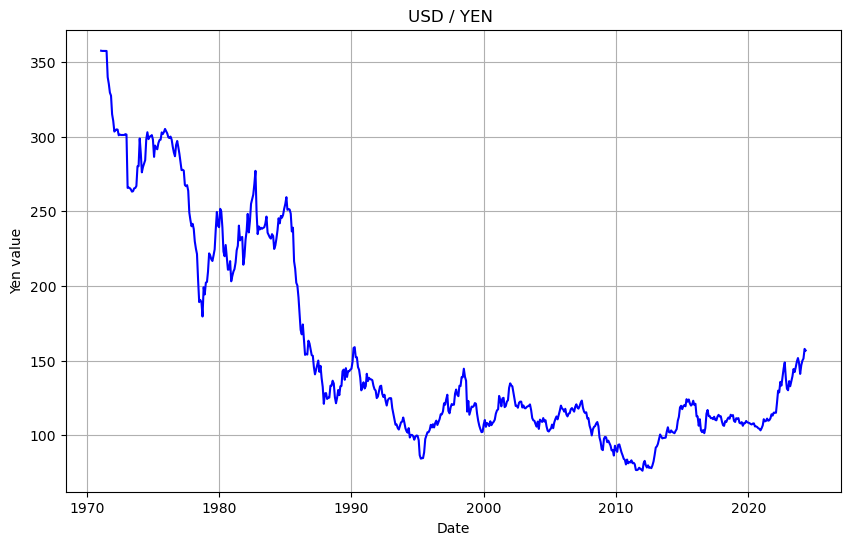

In [4]:
plt.figure(figsize=(10, 6))
plt.plot(usd_yen['Date'], usd_yen['Price'], color='blue', linestyle='-')
plt.title('USD / YEN ')
plt.xlabel('Date')
plt.ylabel('Yen value')
plt.grid(True)
plt.show()

This is the data from 1970 to now, we can clearly see the change of character here

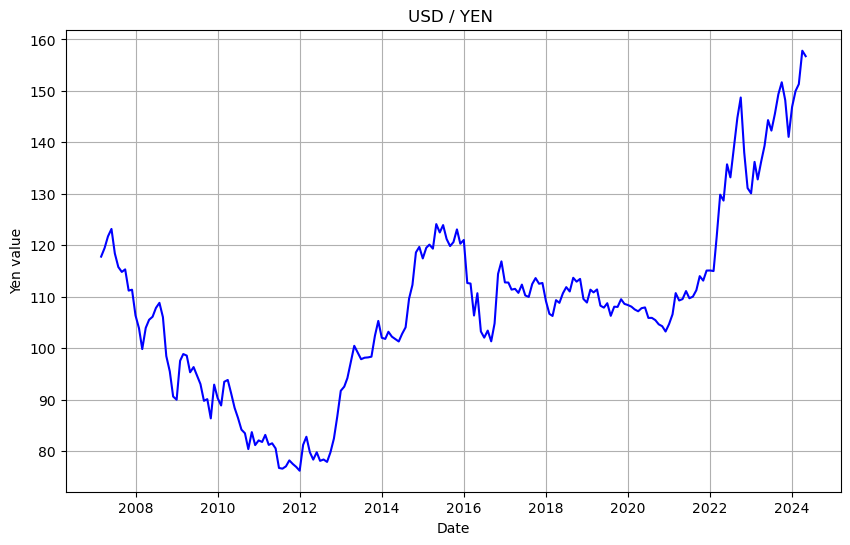

In [5]:
df_filtered = usd_yen[(usd_yen['Date'] >= '2007-03-01')]
plt.figure(figsize=(10, 6))
plt.plot(df_filtered['Date'], df_filtered['Price'], color='blue', linestyle='-')
plt.title('USD / YEN ')
plt.xlabel('Date')
plt.ylabel('Yen value')
plt.grid(True)
plt.show()

If we take a look on a smaller period we see that the Yen is loosing strength

### 3.0.2 - Yen index (JXY)  <a id="section_1_2"></a>
from https://www.investing.com/

The JXY is the index representing the Yen value, it is calculated based on the exchange rate of the yen between every currency.

In [6]:
jxy = pd.read_csv('datas/FXY_monthly_eur.csv')
jxy['Date'] = pd.to_datetime(jxy['Date'])
jxy = jxy.sort_values(by='Date')

In [7]:
jxy

,Date,Price,Open,High,Low,Vol.,Change %
206,2007-03-01,84.92,85.30,86.67,84.45,6.72M,0.35%
205,2007-04-01,83.72,84.94,85.10,81.85,2.27M,-1.41%
204,2007-05-01,82.17,83.87,83.93,82.03,2.45M,-1.85%
203,2007-06-01,81.24,81.99,82.79,80.61,2.66M,-1.13%
202,2007-07-01,84.34,81.69,84.44,81.03,7.20M,3.82%
...,...,...,...,...,...,...,...
4,2024-01-01,63.03,65.42,65.54,62.37,2.71M,-4.22%
3,2024-02-01,61.78,63.29,63.53,61.40,2.50M,-1.98%
2,2024-03-01,61.23,61.59,63.15,61.01,3.78M,-0.89%
1,2024-04-01,58.70,61.24,61.29,58.65,4.15M,-4.13%


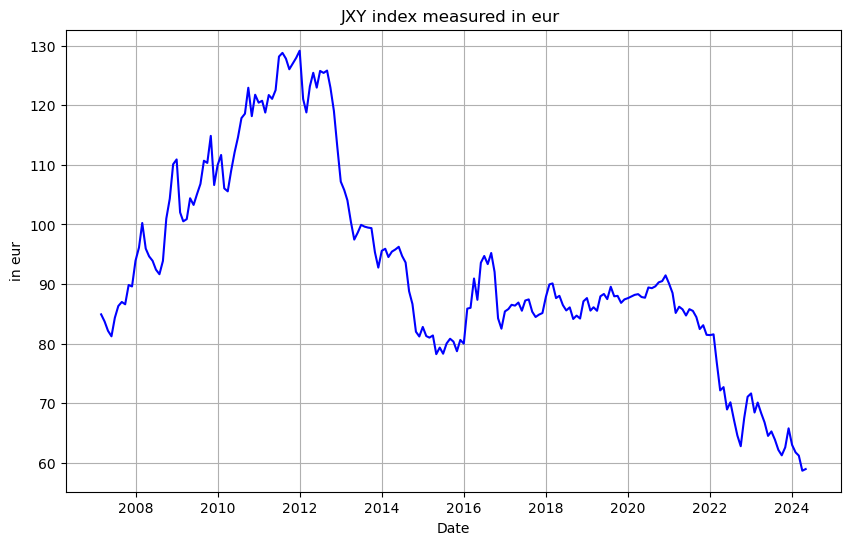

In [8]:
plt.figure(figsize=(10, 6))
plt.plot(jxy['Date'], jxy['Price'], color='blue', linestyle='-')
plt.title('JXY index measured in eur ')
plt.xlabel('Date')
plt.ylabel('in eur')
plt.grid(True)
plt.show()

 ### 3.0.3 - Chinese yen / Yen <a id="section_1_3"></a>
from https://www.investing.com/currencies/cny-jpy-historical-data

In [9]:
cny_jpy = pd.read_csv('datas/CNY_JPY_monthly.csv')
cny_jpy['Date'] = pd.to_datetime(cny_jpy['Date'])
cny_jpy = cny_jpy.sort_values(by='Date')

In [10]:
cny_jpy

,Date,Price,Open,High,Low,Vol.,Change %
386,1992-03-01,24.2891,24.2191,24.2891,24.2191,NaN,2.58%
385,1992-04-01,24.1739,24.1043,24.1739,24.1043,NaN,-0.47%
384,1992-05-01,23.2560,23.1889,23.2560,23.1889,NaN,-3.80%
383,1992-06-01,22.9904,22.9282,22.9904,22.9282,NaN,-1.14%
382,1992-07-01,23.4504,23.3827,23.4504,23.3827,NaN,2.00%
...,...,...,...,...,...,...,...
4,2024-01-01,20.4905,19.8363,20.7332,19.8127,NaN,3.16%
3,2024-02-01,20.8607,20.4939,20.9770,20.3183,NaN,1.81%
2,2024-03-01,20.9562,20.8634,21.0982,20.3748,NaN,0.46%
1,2024-04-01,21.7893,20.9541,22.0875,20.8482,NaN,3.98%


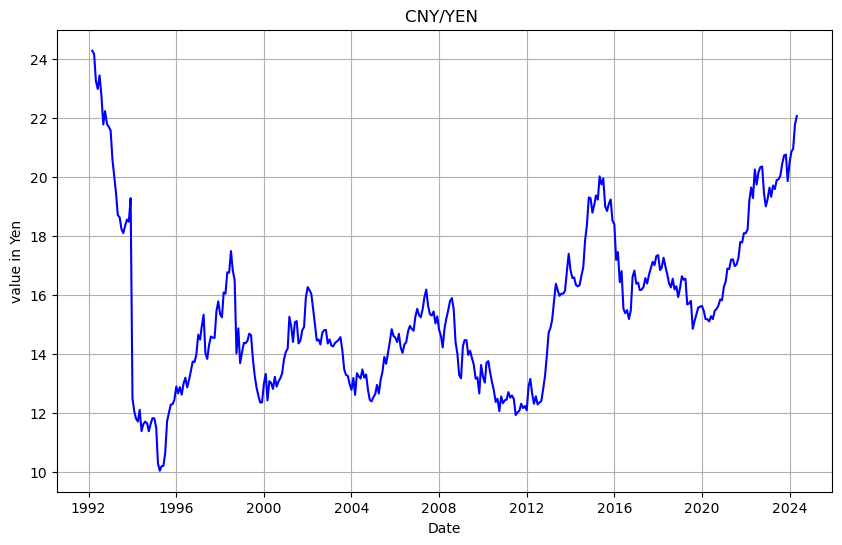

In [11]:
plt.figure(figsize=(10, 6))
plt.plot(cny_jpy['Date'], cny_jpy['Price'], color='blue', linestyle='-')
plt.title('CNY/YEN ')
plt.xlabel('Date')
plt.ylabel('value in Yen')
plt.grid(True)
plt.show()

In [12]:
usd_yen1 = usd_yen[['Date', 'Price']]
jxy1 = jxy[['Date', 'Price']]
cny_jpy1 = cny_jpy[['Date', 'Price']]

usd_yen1 = usd_yen1.rename(columns={'Price': 'USD_JPY'})
jxy1 = jxy1.rename(columns={'Price': 'JXY'})
cny_jpy1 = cny_jpy1.rename(columns={'Price': 'CNY_JPY'})

merged_forex = usd_yen1.merge(jxy1, on='Date', how='inner')
merged_forex = merged_forex.merge(cny_jpy1, on='Date', how='inner')

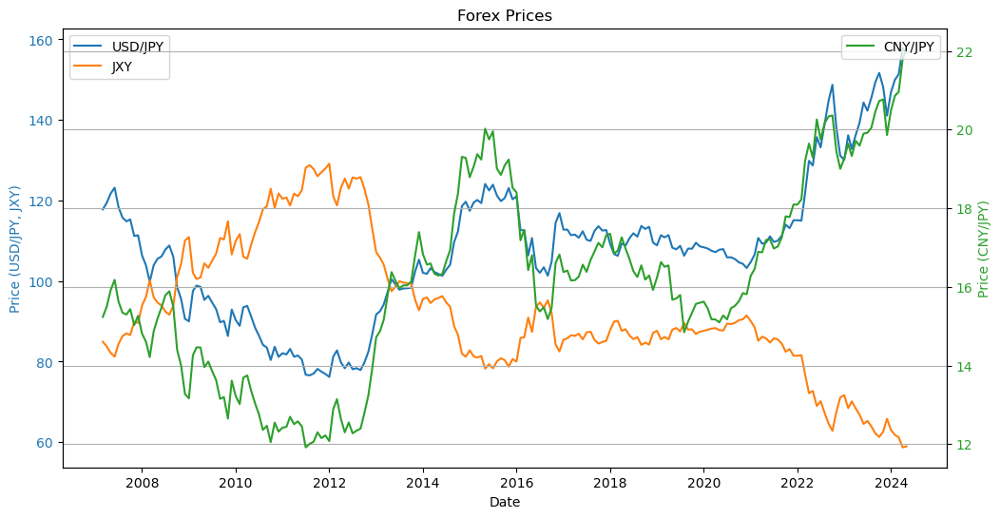

In [13]:
fig, ax1 = plt.subplots(figsize=(12, 6))

ax1.plot(merged_forex['Date'], merged_forex['USD_JPY'], label='USD/JPY', color='tab:blue')
ax1.plot(merged_forex['Date'], merged_forex['JXY'], label='JXY', color='tab:orange')
ax1.set_xlabel('Date')
ax1.set_ylabel('Price (USD/JPY, JXY)', color='tab:blue')
ax1.tick_params(axis='y', labelcolor='tab:blue')
ax1.legend(loc='upper left')

ax2 = ax1.twinx()
ax2.plot(merged_forex['Date'], merged_forex['CNY_JPY'], label='CNY/JPY', color='tab:green')
ax2.set_ylabel('Price (CNY/JPY)', color='tab:green')
ax2.tick_params(axis='y', labelcolor='tab:green')
ax2.legend(loc='upper right')

plt.title('Forex Prices')
plt.grid(True)
plt.show()

>>The comparative analysis of the USD/JPY, JXY, and CNY/JPY forex prices reveals intriguing insights into the economic relationships and currency dynamics. From the graph, it is evident that the USD/JPY and CNY/JPY exchange rates exhibit similar trends over time. This similarity can be attributed to the close economic ties and trade relationships between Japan, China, and the United States. The synchronization in movement suggests that external economic factors, such as changes in global market conditions, trade policies, and economic growth rates, similarly impact these currency pairs.

>>On the other hand, the JXY (which typically refers to the J.P. Morgan Yen Index, representing the value of the yen relative to a basket of major world currencies) shows an inverse relationship compared to the USD/JPY and CNY/JPY pairs. This inverse movement can be explained by the nature of the JXY index itself. When the value of the yen strengthens against other currencies in the basket, the JXY rises, and conversely, when the yen weakens, the JXY falls. Therefore, when the USD/JPY and CNY/JPY rates increase (indicating a weaker yen relative to the USD and CNY), the JXY tends to decrease, reflecting a stronger yen against the broader basket of currencies.


Building on the understanding of currency dynamics and their response to international market shifts, we now pivot to examining the relationship between Japan's GDP and the yen. This analysis will delve into how domestic economic performance influences currency strength and, in turn, interacts with global economic indicators.

# 4 - Chapter  - GDP  <a id="chapter2"></a>
from https://www.esri.cao.go.jp/en/sna/data/sokuhou/files/2024/qe241/gdemenuea.html  
The gdp is in quarterly real data seasonaly adjusted

In [14]:
gdp = pd.read_csv('datas/gdp_seasonely.csv')
gdp = gdp[['Date', 'GDP(Expenditure Approach)']]
gdp = gdp.iloc[1:].reset_index(drop=True)

In [15]:
gdp['Date'] = gdp['Date'].str.strip()
gdp['Year'] = gdp['Date'].apply(lambda x: x if '/' in x else None).ffill()

def convert_date(row):
    year = row['Year'].split('/')[0].strip()
    quarter = row['Date']
    if '1- 3' in quarter:
        return f'{year}-03-01'
    elif '4- 6' in quarter:
        return f'{year}-06-01'
    elif '7- 9' in quarter:
        return f'{year}-09-01'
    elif '10-12' in quarter:
        return f'{year}-12-01'
    return None

gdp['Date'] = gdp.apply(convert_date, axis=1)

gdp = gdp.drop(columns=['Year'])
gdp

,Date,GDP(Expenditure Approach)
0,1994-03-01,"446,250.7"
1,1994-06-01,"443,807.5"
2,1994-09-01,"448,907.4"
3,1994-12-01,"447,170.6"
4,1995-03-01,"452,053.3"
...,...,...
116,2023-03-01,"557,428.1"
117,2023-06-01,"563,122.6"
118,2023-09-01,"558,020.3"
119,2023-12-01,"558,040.5"


## 4.1 - GDP and exchange rates <a id="section_2_1"></a>

### 4.1.1 - GDP vs USD/JPY <a id="sub_section_2_1_1"></a>

In [16]:
merged_forex['Date'] = pd.to_datetime(merged_forex['Date'])
merged_forex['Quarter'] = merged_forex['Date'].dt.to_period('Q').apply(lambda x: x.start_time)
quarterly_forex = merged_forex.groupby('Quarter').mean().reset_index()
quarterly_forex.rename(columns={'Date': ';'}, inplace=True)
quarterly_forex.rename(columns={'Quarter': 'Date'}, inplace=True)
quarterly_forex['Date'] = quarterly_forex['Date'] + pd.DateOffset(months=2)
quarterly_forex = quarterly_forex.drop(';',axis = 1)

gdp['Date'] = pd.to_datetime(gdp['Date'])
gdp.rename(columns={'GDP(Expenditure Approach)': 'GDP'}, inplace=True)
quarterly_forex['Date'] = pd.to_datetime(quarterly_forex['Date'])
gdp = gdp.merge(quarterly_forex,on='Date', how ='inner')
gdp['GDP'] = gdp['GDP'].str.replace(',', '').astype(float)

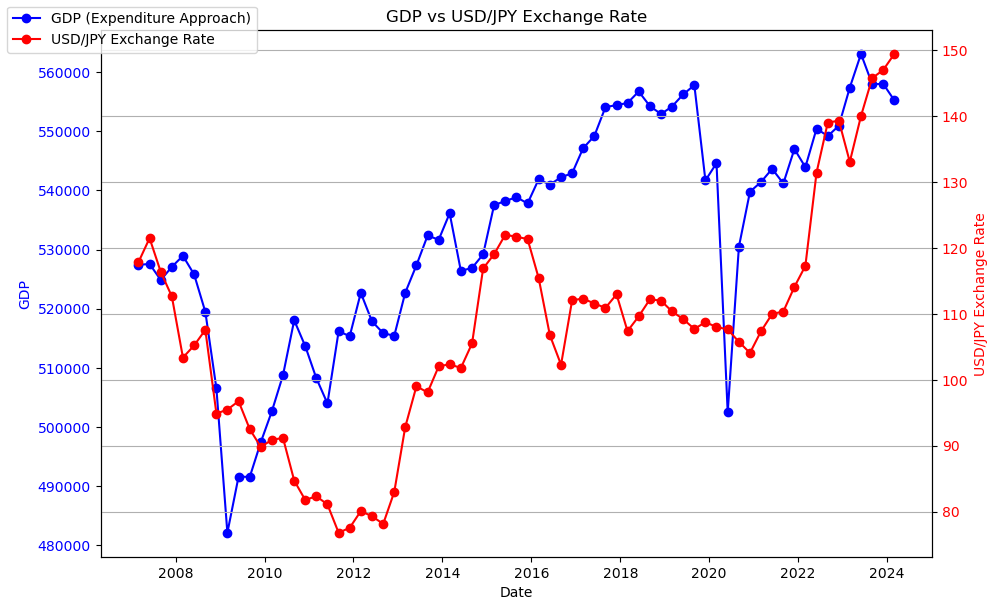

In [17]:
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.plot(gdp['Date'], gdp['GDP'], label='GDP (Expenditure Approach)', color='blue', marker='o')
ax1.set_xlabel('Date')
ax1.set_ylabel('GDP', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

ax2 = ax1.twinx()
ax2.plot(gdp['Date'], gdp['USD_JPY'], label='USD/JPY Exchange Rate', color='red', marker='o')
ax2.set_ylabel('USD/JPY Exchange Rate', color='red')
ax2.tick_params(axis='y', labelcolor='red')

fig.tight_layout()
fig.legend(loc='upper left')
plt.title('GDP vs USD/JPY Exchange Rate')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

### 4.1.2 - GDP vs JXY <a id="sub_section_2_1_2"></a>

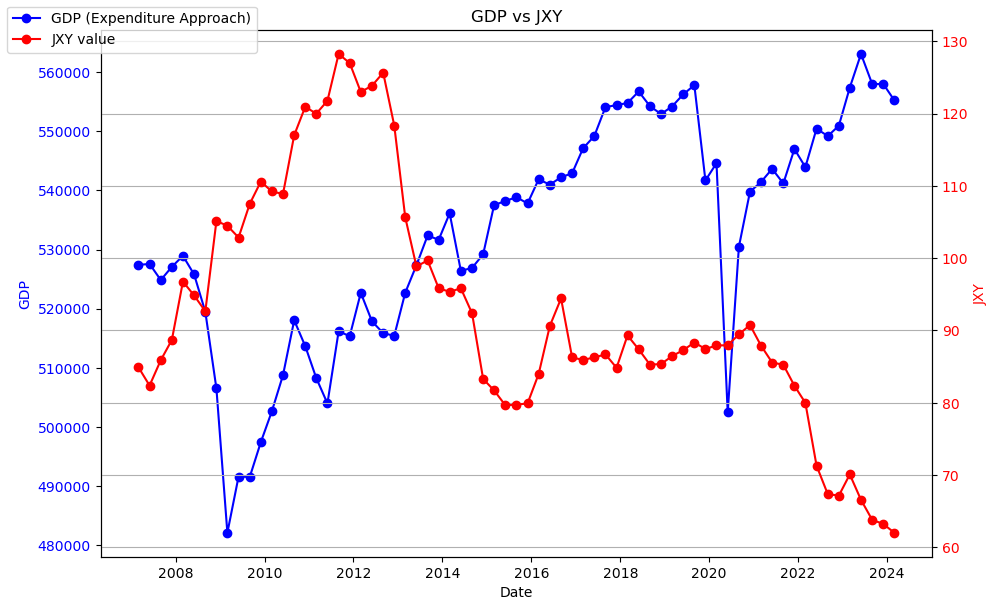

In [18]:
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.plot(gdp['Date'], gdp['GDP'], label='GDP (Expenditure Approach)', color='blue', marker='o')
ax1.set_xlabel('Date')
ax1.set_ylabel('GDP', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

ax2 = ax1.twinx()
ax2.plot(gdp['Date'], gdp['JXY'], label='JXY value', color='red', marker='o')
ax2.set_ylabel('JXY', color='red')
ax2.tick_params(axis='y', labelcolor='red')

fig.tight_layout()
fig.legend(loc='upper left')
plt.title('GDP vs JXY')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

The graph below depicts a comparative analysis between Japan's GDP in blue and the Japanese Yen Index (JXY) in red, for the period running from 2007 to 2024. The left vertical axis measures the GDP values, while the right vertical axis corresponds to JXY values. Both data series are plotted quarterly to show the relationship between Japan's economic output and the value of the yen relative to a basket of major currencies.

Observations and Interpretation

General Trend: From this scatter diagram, it is clear that there exists a direct relationship between GDP and JXY. On any increase in the yen index, which portrays the appreciation of the yen, the level of GDP decreases and vice versa. A stronger yen makes Japanese exports dearer, which renders them less competitive in international markets, thereby lowering export-driven income and, consequently causing a drop in GDP. In this respect, a weaker yen will, in fact, make them more competitive in exports and, thus, drive up GDP.

2008 Financial Crisis:
Impact: The 2008 global financial crisis saw a sudden drop in GDP. The Yen, therefore, surged throughout that time because of investors seeking safe-haven assets.
Reason: The safe-haven currency is a typical thing that happened with the yen, which through appreciation, affected Japan's export-oriented economy negatively.

Post-2012 Recovery:
Trend: Post-2012, the yen devalued steeply to a lower JXY value by 2014; GDP at this time was making a gradual recovery. This weak yen made Japanese goods less expensive abroad and thus helped to boost exports as a driver to increasing economic growth. The weakening of the yen was further favored by policies like Abenomics, which came into play in 2012 and targeted monetary easing, fiscal stimulus, and structural reforms.

Recent Patterns (2020-2024):
Fluctuations: The large hump in GDP and JXY in the graph must be something related to the hit of the COVID-19 pandemic on the economy. After the initial shock of the pandemic, there is a notable recovery in GDP with corresponding depreciation in yen.
Reason: There was a huge economic instability during the pandemic, and it provided sharp movements in the GDP and the value of the Yen. As the economy of Japan started recovering, the value of the Yen started depreciating, thereby supporting an increment in exports and getting a boost for GDP.

Long-Term Decline in JXY:
Observation: There is a long-term decline in the JXY index, indicating a gradual weakening of the yen over the past decade.
Reason: Persistent monetary easing by the Bank of Japan, intending to cope with deflation and to better growth prospects, has made yen weak. This policy stance helped to maintain the export competitiveness of Japan, but on the other hand, it resulted in prolonged depreciation of the yen.

## 4.2 GDP Analysis <a id="section_2_2"></a>

**Hypothesis:**   
The Japanese Yen's strength inversely affects Japan's GDP due to its export-driven economy. A stronger yen increases the price of Japanese goods abroad, potentially decreasing demand and negatively impacting GDP.  

**Methodology**  
Approach: Employing correlation analysis and Ordinary Least Squares (OLS) regression to explore the relationship between the yen (JXY) and GDP, supplemented by Vector Autoregression (VAR) to examine dynamic interactions over time.  

Strengths:  
Correlation Analysis: Establishes a basic understanding of the relationship between JXY and GDP.  
OLS Regression: Quantifies the impact of JXY changes on GDP, providing clear and direct results useful for economic interpretations.  
VAR Model: Captures complex interactions and the time-lagged effects of JXY on GDP, enhancing the analysis by addressing variable interdependencies.  

#### GDP correlation and OLS model <a id="sub_section_2_2_1"></a>

In [19]:
correlation = gdp[['GDP', 'JXY']].corr()
print("Correlation between Government Consumption Expenditure and Yen Closing Value:\n", correlation)

Correlation between Government Consumption Expenditure and Yen Closing Value:
           GDP       JXY
GDP  1.000000 -0.739726
JXY -0.739726  1.000000


In [20]:
import statsmodels.api as sm

X = gdp['JXY']
y = gdp['GDP']

X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                    GDP   R-squared:                       0.547
Model:                            OLS   Adj. R-squared:                  0.540
Method:                 Least Squares   F-statistic:                     80.97
Date:                Sat, 20 Jul 2024   Prob (F-statistic):           3.86e-13
Time:                        10:46:12   Log-Likelihood:                -750.48
No. Observations:                  69   AIC:                             1505.
Df Residuals:                      67   BIC:                             1509.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       6.128e+05   9016.610     67.967      0.0

>Correlation Analysis
The correlation matrix reveals a strong negative correlation between GDP and JXY, with a coefficient of -0.739726. This suggests that as the yen strengthens (higher JXY values), GDP tends to decrease, and vice versa.

>Regression Analysis
To further quantify this relationship, we conducted an Ordinary Least Squares (OLS) regression analysis, modeling GDP as a function of the JXY index. The regression equation is specified as:
GDP=β0+β1×JXY
Where:
𝛽0 is the intercept term. 𝛽1 is the coefficient for JXY.

>Interpretation of Regression Results
Intercept (
𝛽
0
β 
0
​
 ): The intercept term is approximately 612,800, indicating the GDP level when JXY is zero. This value, however, is not interpretable in a practical sense since JXY cannot be zero.
Coefficient (
𝛽
1
β 
1
​
 ): The coefficient of JXY is -862.4253, implying that a unit rise in the JXY index leads to a fall in GDP by about 862.43 units. The relation is significant because its p-value is 0.000. The R-squared value of 0.547 means that around 54.7% of the variability in GDP is explained by the JXY index. The F-statistic in the model is highly significant; it gives a p-value of 3.86e-13.  

Discussion  
The negative relation between GDP and JXY stems from the fact that Japan is an export-driven economy. When yen gains in strength or JXY rises, Japanese goods will become dearer for foreign purchasers. It will lower the export levels and thus proportional wounds on the GDP. A weaker yen will make exports cheap and more competitive, stimulating economic growth.  

The 2008 financial crisis and the COVID-19 pandemic periods are examples of this. The recurring trend that featured in both of these crises is that whenever the yen relatively appreciated as a safe-haven currency, it was amid large plunges in GDP. In this case, export growth and recovery of GDP have been through yen depreciation. In these lines, the monetary policy applied in Japan, and specifically the way the Bank of Japan fights with monetary tools against deflation, has kept the yen weak to boost economic growth. The same policies, beneficial for increasing exports, have been responsible for persistently letting the yen weaken.  

#### GDP and VAR model <a id="sub_section_2_2_2"></a>

We are now doing a Vector Autoregression (VAR) model to explore the dynamic interaction between JXY and GDP over time with a VAR model to capture the feedback loops between these variables.

In [21]:
df = gdp[['Date', 'GDP', 'JXY']].copy()
df['Date'] = pd.to_datetime(df['Date'])
df.set_index('Date', inplace=True)

def check_stationarity(series):
    result = adfuller(series)
    return result[1] <= 0.05

if not check_stationarity(df['GDP']):
    df['GDP'] = df['GDP'].diff().dropna()

if not check_stationarity(df['JXY']):
    df['JXY'] = df['JXY'].diff().dropna()

df = df.dropna()

model = VAR(df)
results = model.fit(maxlags=3)

print(results.summary())

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 20, Jul, 2024
Time:                     10:46:12
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    21.5009
Nobs:                     65.0000    HQIC:                   21.2173
Log likelihood:          -854.020    FPE:                1.36475e+09
AIC:                      21.0326    Det(Omega_mle):     1.11228e+09
--------------------------------------------------------------------
Results for equation GDP
            coefficient       std. error           t-stat            prob
-------------------------------------------------------------------------
const        357.743419      1052.780817            0.340           0.734
L1.GDP        -0.138479         0.126521           -1.095           0.274
L1.JXY      -616.002686       265.627417           -2.319           0.020
L2.GDP         0

C:\Users\bodin\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency QS-DEC will be used.
  self._init_dates(dates, freq)


Conclusion of Analysis and Forecast Integration - VAR
These new findings by the VAR model estimated in this paper confirm that there is a negative relationship between the JXY and Japan's GDP, as earlier seen in equation 4. It can be clearly observed from the VAR model that for GDP, significant variations of the JXY index have some influences on GDP.

Especially, the lag 1 negative coefficient for JXY (-616.00) firmly supports the regression analysis in the sense that a stronger yen (higher JXY) exerts a damping influence on GDP. It is quite in tune with the economic principle: An appreciating yen could make exports from Japan more expensive and less competitive in international markets, hence possibly damping economic growth.

That the JXY at lag 2 has a positive coefficient (238.41) would suggest delayed adjustment or any other market dynamics that may have ensued in an attempt to overturn the initial negative influence and regain confidence. On the other hand, the existence of yet another negative coefficient at lag 3 would help to substantiate the longer-term adverse effect of yen appreciation on economic output.

As shown by the correlation matrix given by the VAR model, the one between GDP and JXY residuals has a low value of 0.070, which means that the relationship is significant statistically but does not capture all the variance of GDP and other influential factors apart from just the yen's value.

These insights from the VAR model augment our understanding from the simple correlation and OLS regression analyses run in the beginning. They describe how the value of the yen affects GDP not only directly but also through the channel of lagged effects. The ability of the VAR model to account for such kinds of interactions over time gives a lot of depth in the analysis, unveiling the intricate dynamics between currency valuation and national economic performance.

Moreover, the interpretation of fluctuations within GDP and JXY can only be made meaningful with historical context. These large deviations are in line with such important economic events as the 2008 financial crisis and the COVID-19 pandemic, among others, so it becomes imperative to place them into the analysis.

**Summary**
This overall approach, which brings together OLS regression and VAR modeling, proves useful in explaining the pertinent but complex relationship between the yen's value and GDP in Japan. This sturdy analytical framework can then inform any further research or policy dealing with achieving leverage or stability of the economic indicators of Japan in relation to the dynamics of their currency.

#### Why those results :   <a id="section_2_3"></a>

In the research paper from 1998 written by Alan C. Stockman, he highlights his discovery of the exchange rate 'not having a life of his own anymore' by finding a relation between the Exchange rate and real GDP.   https://www.richmondfed.org/publications/research/economic_quarterly/1998/spring/stockman  


"Contrary to this widely held contention, this article presents new evidence that exchange rates are connected with fundamentals, in particular with the relative gross domestic product (GDP) of each of the two countries involved, as predicted by nearly all exchange-rate theories. Moreover, they are related in the direction predicted by standard models: a country’s currency tends to be depreciated in real terms when that country’s real GDP is relatively high, and vice versa." p73-74   

In our VAR analysis, it was posited that the careful balances between the yen and GDP can be further contextualized by Alan C. Stockman's thoughts on this issue in his 1998 study. Stockman's results likewise highlight the complex economic relationship between exchange rates and GDP, which our study identifies as well. From the currency crises resolved through intervention that we discussed at a macroeconomic level, our study will bring us  to consumer consumption in Japan—showing how broad-based economic trends might play out on an individual spend basis and impact savings rates or what people are buying across various categories of goods.

# 5 - Chapter  - HouseHold consumption  <a id="chapter3"></a>
from https://www.esri.cao.go.jp/en/sna/data/sokuhou/files/2024/qe241/gdemenuea.html  
The data are monthly real

In [22]:
house = pd.read_csv('datas/gdp_seasonely.csv')
house = house[['Date', 'Consumption ofHouseholds']]
house = house.iloc[1:].reset_index(drop=True)

In [23]:
house['Date'] = house['Date'].str.strip()
house['Year'] = house['Date'].apply(lambda x: x if '/' in x else None).ffill()
house['Date'] = house.apply(convert_date, axis=1)
house = house.drop(columns=['Year'])
house.rename(columns={'Consumption ofHouseholds': 'House'}, inplace=True)
house['Date'] = pd.to_datetime(house['Date'])

gdp = gdp.merge(house,on='Date', how ='inner')
gdp['House'] = gdp['House'].str.replace(',', '').astype(float)
gdp

,Date,GDP,USD_JPY,JXY,CNY_JPY,House
0,2007-03-01,527405.3,117.790000,84.920000,15.236400,285204.2
1,2007-06-01,527563.0,121.456667,82.376667,15.866400,286890.6
2,2007-09-01,524836.2,116.333333,85.886667,15.423767,284050.9
3,2007-12-01,527078.4,112.620000,88.686667,15.243233,284581.4
4,2008-03-01,528938.4,103.353333,96.760000,14.543133,285882.1
...,...,...,...,...,...,...
64,2023-03-01,557428.1,133.026667,70.083333,19.408933,292284.8
65,2023-06-01,563122.6,139.980000,66.566667,19.733767,290275.4
66,2023-09-01,558020.3,145.720000,63.800000,20.139633,289394.5
67,2023-12-01,558040.5,146.973333,63.236667,20.451767,288235.6


## 5.1 - Households and JXY <a id="section_3_1"></a>

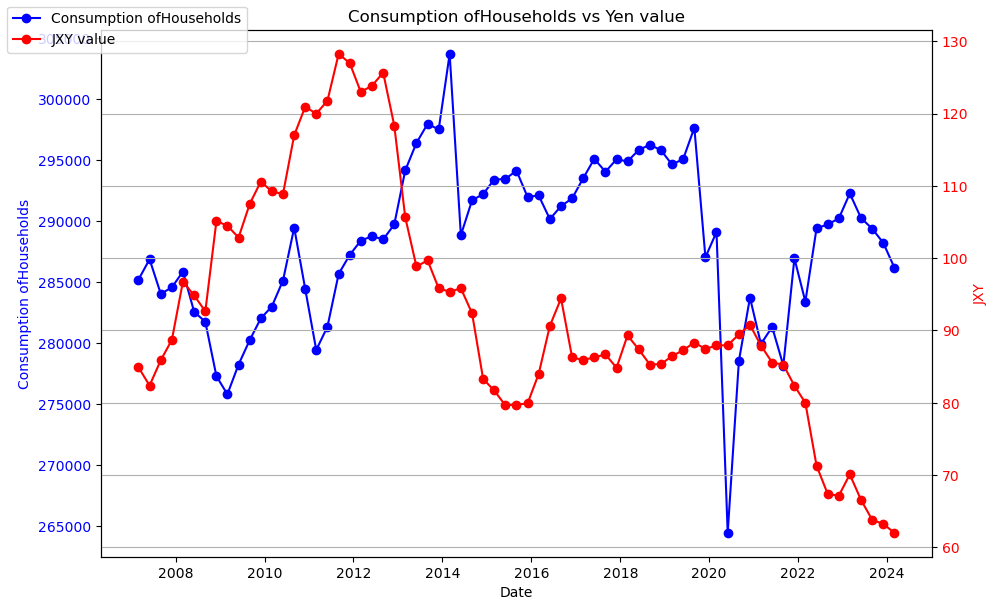

In [24]:
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.plot(gdp['Date'], gdp['House'], label='Consumption ofHouseholds', color='blue', marker='o')
ax1.set_xlabel('Date')
ax1.set_ylabel('Consumption ofHouseholds', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

ax2 = ax1.twinx()
ax2.plot(gdp['Date'], gdp['JXY'], label='JXY value', color='red', marker='o')
ax2.set_ylabel('JXY', color='red')
ax2.tick_params(axis='y', labelcolor='red')

fig.tight_layout()
fig.legend(loc='upper left')
plt.title('Consumption ofHouseholds vs Yen value')
plt.grid(True)
plt.xticks(rotation=45)
plt.show()

Observations
The graph demonstrates a relationship between Japan's household consumption, illustrated by the blue line, and the Japanese Yen Index, or JXY, shown by the red line, from 2007 to 2024. The household consumption and value of yen are in a negative relationship.

Key Points
Inverse Relationship: Like GDP, household consumption generally tends to fall as the yen appreciates (higher JXY values) and increase as the yen depreciates.

Crisis Periods: Remarkable declines in household consumption had been found during both the 2008 financial crisis and the current 2020 COVID-19 pandemic, which happened along with yen appreciation.

Monetary Policy Effects: After 2012, the gradual recovery of household consumption reflects monetary easing policy to weaken the yen by the Bank of Japan.

Explanations
Export Dependency: A stronger yen reduces export competitiveness, causing less economic growth and household incomes and therefore less consumption.

Import Prices: A stronger yen makes imports cheaper, which may have mixed effects on household consumption. While cheaper imports may facilitate consumption of imported goods, the overall economic slowdown due to reduced exports will still be big enough to overshadow it.

Monetary Easing: Policies of depreciation of the yen (after 2012) boost economic growth, increase employment and income, and increase household consumption.

Impact on Crisis: Economic uncertainty during crises makes people save more and consume less, in addition to a strong yen during these times as a safe-haven currency.

## 5.2 - Research paper comparison <a id="section_3_2"></a>

**We are now using two research paper about the impact of the national currency on the households consumption. It will permit us to compare the situation of Japan with other country where the study has already been done.** 


These studies collectively present a comprehensive picture of how exchange rate fluctuations impact household spending across different economic contexts—in African emerging economies generally and specifically in BRICST countries. Uche et al. apply further by utilizing a modified non-linear ARDL and multiple threshold non-linear ARDL model in explaining the effects of small and large exchange rate variations on household consumption within an African context. By this result, a significant high asymmetry is revealed in the response of household consumption to exchange rate movements. Notably in Algeria, Egypt, and Morocco, household consumption increases significantly with currency appreciation but decreases with depreciation. This implies that the households in those countries would be more responsive to favorable exchange rate shocks. On the other hand, in Kenya, Nigeria, and South Africa, household consumption is hardly affected by exchange rate, hence suggesting some degree of inelasticity in such countries.

Similarly, Derindag et al. (2022) implement this further on the BRICST countries, but at the same time use the multiple asymmetric threshold non-linear ARDL model in order to distinguish between minor and major currency appreciations and depreciations. They find that, although the traditional NARDL model shows no asymmetries in long runs other than India and China, the MATNARDL model shows long run asymmetries for all BRICST excluding India, and short run everywhere except Turkey. It suggests the reality that both small and big changes in the exchange rate can be highly impactful on household consumption in Brazil, Russia, and China, hence reflecting a more sensitive pattern of consumption than observed in Turkey.

Conclusion Drawn from Both the Studies
The effects of exchange rate movements on household consumption are context-specific and range significantly across different regions and economic structures. The sensitivity of household consumption to exchange rate appreciation in North African countries is much higher than that in Sub-Saharan African countries or even in BRICST countries. In other words, it remains low in BRICST countries, whereas for both small and large currency changes, the sensitivity seems to be significant, with a strong element of asymmetries. The findings showed the serious nature of tailor-made monetary and fiscal policies that can manage the impact of exchange rate volatility on household consumption to sustain economic stability and consumer confidence across different regions.
For detailed insights, refer to:  

##### Household consumption and exchange rate extreme dynamics: Multiple asymmetric threshold non-linear autoregressive distributed lag model perspective (Uche et al., 2022).  
https://onlinelibrary.wiley.com/doi/abs/10.1002/ijfe.2601

##### Exchange Rate Effect on the Household Consumption in BRICST Countries: Evidence from MATNARDL Model (Derindag et al., 2022).  
https://www.worldscientific.com/doi/10.1142/S1793993322500107 


### 5.2.1 - NARDL model <a id="sub_section_3_2_1"></a>

**Further dive in the impact of the yen value on the Households consumption**  
(from https://onlinelibrary.wiley.com/doi/full/10.1002/ijfe.2601)    
The **Multiple Asymmetric AutoRegressive Distributed Lag (NARDL)** model is an advanced econometric model used to examine the dynamic relationship between variables over time, capturing both short-term and long-term effects. It extends the traditional ARDL model to account for potential asymmetries in the relationships between variables, meaning it can capture situations where positive and negative changes in an independent variable may have different impacts on the dependent variable.  
When applied to analyze the impact of exchange rates on household consumption, the NARDL model can provide insights into how changes in exchange rates (both appreciations and depreciations) affect household consumption patterns differently over time.


In [25]:
gdp['log_House'] = np.log(gdp['House'])
gdp['log_GDP'] = np.log(gdp['GDP'])
gdp['log_JXY'] = np.log(gdp['JXY'])

gdp['d_log_House'] = gdp['log_House'].diff().dropna()
gdp['d_log_GDP'] = gdp['log_GDP'].diff().dropna()
gdp['d_log_JXY'] = gdp['log_JXY'].diff().dropna()

gdp.dropna(inplace=True)

In [26]:
def unit_root_tests(series):
    print(f'Augmented Dickey-Fuller test for {series.name}:')
    adf_result = adfuller(series)
    #print(f'ADF Statistic: {adf_result[0]}')
    #print(f'p-value: {adf_result[1]}')

    print(f'Phillips-Perron test for {series.name}:')
    pp_result = PhillipsPerron(series)
    #print(pp_result.summary())

    print(f'Zivot-Andrews test for {series.name}:')
    za_result = ZivotAndrews(series)
    #print(za_result.summary())

In [27]:
unit_root_tests(gdp['d_log_House'])
unit_root_tests(gdp['d_log_GDP'])
unit_root_tests(gdp['d_log_JXY'])

gdp['pos_d_log_JXY'] = gdp['d_log_JXY'].clip(lower=0).cumsum()
gdp['neg_d_log_JXY'] = gdp['d_log_JXY'].clip(upper=0).cumsum()

formula = 'd_log_House ~ d_log_GDP + pos_d_log_JXY + neg_d_log_JXY + d_log_House.shift(1) + pos_d_log_JXY.shift(1) + neg_d_log_JXY.shift(1) + d_log_GDP.shift(1)'

model1 = smf.ols(formula=formula, data=gdp).fit()

wald_test_pos = model1.wald_test('pos_d_log_JXY = pos_d_log_JXY.shift(1)')
wald_test_neg = model1.wald_test('neg_d_log_JXY = neg_d_log_JXY.shift(1)')

Augmented Dickey-Fuller test for d_log_House:
Phillips-Perron test for d_log_House:
Zivot-Andrews test for d_log_House:
Augmented Dickey-Fuller test for d_log_GDP:
Phillips-Perron test for d_log_GDP:
Zivot-Andrews test for d_log_GDP:
Augmented Dickey-Fuller test for d_log_JXY:
Phillips-Perron test for d_log_JXY:
Zivot-Andrews test for d_log_JXY:


C:\Users\bodin\anaconda3\Lib\site-packages\statsmodels\base\model.py:1906: FutureWarning: The behavior of wald_test will change after 0.14 to returning scalar test statistic values. To get the future behavior now, set scalar to True. To silence this message while retaining the legacy behavior, set scalar to False.
  warnings.warn(


In [28]:
print("NARDL Model Summary:")
print(model1.summary())

print("Wald Test for Positive Shocks:")
print(wald_test_pos)

print("Wald Test for Negative Shocks:")
print(wald_test_neg)

coefficients = model1.params
print("Coefficients:")
print(coefficients)

NARDL Model Summary:
                            OLS Regression Results                            
Dep. Variable:            d_log_House   R-squared:                       0.756
Model:                            OLS   Adj. R-squared:                  0.727
Method:                 Least Squares   F-statistic:                     26.13
Date:                Sat, 20 Jul 2024   Prob (F-statistic):           7.00e-16
Time:                        10:46:13   Log-Likelihood:                 223.92
No. Observations:                  67   AIC:                            -431.8
Df Residuals:                      59   BIC:                            -414.2
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Interce

### 5.2.2 - Interpretation of NARDL Model Results <a id="sub_section_3_2_2"></a>

#### Long-Run Impact
In the long run, the model suggests that:

- **Positive Exchange Rate Changes (Appreciation):**
  - The coefficient (β₁ = 0.0184) is positive but statistically insignificant, indicating that appreciation of the JXY has a negligible long-run impact on household consumption.

- **Negative Exchange Rate Changes (Depreciation):**
  - The coefficient (β₂ = -0.0597) is negative but statistically insignificant, suggesting that depreciation of the JXY also has a negligible long-run impact on household consumption.

- **National Income (GDP):**
  - The coefficient (β₃ = 0.8255) is positive and statistically significant, indicating that changes in GDP have a substantial long-run impact on household consumption.

#### Short-Run Dynamics
In the short run, the model indicates:

- **Lagged Household Consumption:**
  - The coefficient (α₁ = -0.3397) is significant and negative, suggesting that previous periods' household consumption negatively impacts current consumption. This reflects a mean-reverting behavior where deviations from past consumption levels are corrected in the short run.

- **Positive Exchange Rate Changes (Appreciation):**
  - The coefficient (α₂ = -0.0143) is insignificant, indicating that short-term appreciations of the JXY have a negligible impact on household consumption.

- **Negative Exchange Rate Changes (Depreciation):**
  - The coefficient (α₃ = 0.0663) is insignificant, suggesting that short-term depreciations of the JXY also have a negligible impact on household consumption.

- **GDP:**
  - The coefficient (α₄ = 0.1733) is insignificant, indicating that short-term changes in GDP have a negligible impact on household consumption.

#### Wald Test Results
- **Positive Shocks:**
  - The Wald test for positive shocks shows an F-value of 0.1007 (p=0.752), indicating that positive exchange rate shocks do not significantly impact household consumption.

- **Negative Shocks:**
  - The Wald test for negative shocks shows an F-value of 2.1008 (p=0.153), suggesting that negative exchange rate shocks also do not significantly impact household consumption.


### 5.2.3 - Summary

The results derived from the NARDL model show that household consumption in Japan is not significantly affected by a long-run perspective in appreciations and depreciations of Japanese Yen Index (JXY) effects. Household consumption appears rather unresponsive to changes in the exchange rate but may be more affected by the past consumption structure as well as possibly other macroeconomic influences not considered in this model, which include inflation, interest rates, and fiscal policies. The strongly significant negative short-run coefficient on lagged household consumption indicates mean-reverting behavior, showing that deviations from past levels of consumption are corrected over time.

### 5.2.4 - Comparing the results <a id="sub_section_3_2_3"></a>


| Variable                        | Japan                                | Algeria                       | Egypt                        | Kenya                        | Morocco                      | Nigeria                      | South Africa                 | Comment and Interpretation                                                                                   |
|---------------------------------|--------------------------------------|-------------------------------|------------------------------|------------------------------|------------------------------|------------------------------|------------------------------|-------------------------------------------------------------------------------------------------------------|
| **Long-Run Coefficients**       |                                      |                               |                              |                              |                              |                              |                              |                                                                                                             |
| ER⁺ (Positive Exchange Rate)    | 0.0184 (not significant)             | -0.017** (significant)        | 0.008 (not significant)      | 0.005 (not significant)      | -0.010** (significant)       | 0.003 (not significant)      | 0.015 (not significant)      | Positive exchange rate changes have a negligible impact in Japan. Negative effects observed in Algeria and Morocco indicate sensitivity to appreciation. |
| ER⁻ (Negative Exchange Rate)    | -0.0597 (not significant)            | -0.157** (significant)        | 0.002 (not significant)      | -0.067*** (significant)      | 0.001 (not significant)      | 0.031 (not significant)      | 0.040 (not significant)      | Negative exchange rate changes have a negligible impact in Japan. Significant negative effects observed in Algeria and Kenya indicate sensitivity to depreciation. |
| NI (National Income, GDP)       | 0.8255 (significant)                 | 0.010 (not significant)       | 0.022*** (significant)       | 0.096*** (significant)       | 0.067*** (significant)       | 0.106*** (significant)       | 0.226*** (significant)       | GDP has a significant positive impact on household consumption in Japan and most African economies. |
| **Short-Run Coefficients**      |                                      |                               |                              |                              |                              |                              |                              |                                                                                                             |
| ΔER⁺ (Positive Exchange Rate)   | -0.0143 (not significant)            | -0.803*** (significant)       | Not available                | -0.251*** (significant)      | -0.102** (significant)       | 0.040 (not significant)      | -0.546*** (significant)      | Positive exchange rate changes have a negligible impact in Japan. Significant negative effects observed in multiple African economies indicate sensitivity to appreciation. |
| ΔER⁻ (Negative Exchange Rate)   | 0.0663 (not significant)             | -0.497*** (significant)       | Not available                | -0.081* (significant)        | Not available                | 0.039 (not significant)      | -0.430** (significant)       | Negative exchange rate changes have a negligible impact in Japan. Significant negative effects observed in multiple African economies indicate sensitivity to depreciation. |
| ΔNI (GDP)                       | 0.1733 (not significant)             | 0.036 (not significant)       | 0.602*** (significant)       | 0.811*** (significant)       | 0.911*** (significant)       | 0.603*** (significant)       | 0.457*** (significant)       | Short-term changes in GDP significantly impact household consumption in most African economies, while it is not significant in Japan. |
| **Wald Test for Asymmetry**     |                                      |                               |                              |                              |                              |                              |                              |                                                                                                             |
| Positive Shocks                 | F-value = 0.1007 (not significant)   | Significant                    | Not available                | Significant                    | Not available                | Not significant              | Not significant              | Positive exchange rate shocks do not significantly impact household consumption in Japan. Asymmetry observed in some African economies indicates varied responses to shocks. |
| Negative Shocks                 | F-value = 2.1008 (not significant)   | Significant                    | Not available                | Significant                    | Not available                | Not significant              | Significant                    | Negative exchange rate shocks do not significantly impact household consumption in Japan. Asymmetry observed in some African economies indicates varied responses to shocks. |

### 5.2.5 - Summary
The comparative analysis draws attention to the significant difference in the effect that either exchange rate changes or changes in GDP will have on household consumption of Japan compared to the selected African economies. For Japan, exchange rate changes have insignificant impacts on the household consumption of households, either in the long run or in the short run. In contrast, a number of African economies show large sensitivity toward both positive and negative changes in the exchange rate, and this will result in big long-run and short-run effects. The impact in Japan is inconsequential, whereas GDP significantly impacts household consumption across most African economies. The asymmetry tests further present different responses to exchange rate shocks in the African economies; hence, more evidence for context-specific economic policies.


The observed insensitivity of Japanese household consumption to exchange rate fluctuations, compared to the pronounced sensitivity in several African economies, can be hypothesized based on economic development and structural differences. Japan, as a developed economy with a diversified industrial base and substantial financial reserves, has a more robust economic infrastructure that can buffer the immediate impacts of exchange rate volatility on everyday consumption. This stability is contrasted by many African economies, which are often more reliant on imports for basic goods and may have less diversified economic structures, making them more vulnerable to exchange rate shifts. Additionally, the monetary and fiscal policies in place in Japan are designed to maintain stability in consumer prices and consumption, unlike in some African countries where such mechanisms may not be as effective or established.

### 5.2.6 - Explanation with another source 

The findings of this study are in sync with the evidential data provided in the article by Muellbauer and Murata, **"Consumption, Land Prices, and the Monetary Transmission Mechanism in Japan"** (Muellbauer & Murata, 2009). Interest rate changes have little to do with consumption in Japan, according to the results of their findings. In essence, land prices, fiscal policies, and non-liberal household credit markets play more significant roles when it comes to household final consumption. This paper documents these economic conditions en route to providing a scenario in which **household consumption is less responsive to the monetary transmission mechanisms of exchange rate changes**. On the other hand, during economic downturns and periods of foreign exchange devaluation or appreciation, Japanese household consumption positively persists in being **less susceptible to exchange rate movement**, spurred, of course, by historical consumption patterns and other macroeconomic variables not captured in the NARDL model. Taken together, these results help explain why changes in exchange rates in Japan have not resulted in any sensitivity of household consumption to that effect.

https://www.researchgate.net/publication/228181397_Consumption_Land_Prices_and_the_Monetary_Transmission_Mechanism_in_Japan

Drawing on the insights from Muellbauer and Murata that highlight Japan's unique economic context, we understand why exchange rate fluctuations have minimal impact on household consumption which is similar to our finding. As we delve deeper into the specifics of household spending, our next section will explore how Japanese households spend their money across different categories such as food and services, providing a detailed look at consumption patterns beyond the macroeconomic framework.

# 6 Households consumption details <a id="section_3_3"></a>

### 6.0.1 - Conclusion from Research Paper

After comparing our findings with the research paper, we conclude that the exchange rate of JPY does not significantly impact overall household consumption. However, it is possible that the JPY exchange rate may influence specific components of household consumption rather than the aggregate expenditure.

### 6.0.2 - Further Analysis

To explore this hypothesis, we will investigate whether particular categories of household expenditure are affected by changes in the JPY exchange rate. This section will focus on examining individual expenditure categories to determine if any are significantly influenced by fluctuations in the exchange rate.

### 6.0.3 - Analysis of Household Expenditure Categories

We'll analyze the following categories of household spending:

- **Food Expenses**:  
- **Gas fee**:
- **Services**:

Here, we aim to determine if the JPY exchange rate has a different impact on various aspects of household spending. This detailed analysis will help us understand whether the exchange rate influences only certain components of household expenditure, providing a clearer picture of its overall economic impact.

### 6.0.4 - Data Collection and Time Range

The data used in this analysis is sourced from the **Household Expenditure Survey** provided by **e-Stat**, the government statistics portal site of Japan.  This survey is conducted monthly and involves a sample of approximately 9,000 households across Japan. The survey collects detailed information on household income, expenditure, savings, and debt based on statistical theory and methods.

#### Data Details

- **Survey Frequency**: Monthly
- **Sample Size**: Approximately 9,000 households nationwide
- **Survey Scope**: Household income, expenditure, savings, and debt
- **Data Range**: Quarterly data from the year 2000 to 2023

The dataset includes quarterly observations spanning from 2000 to 2023, which allows for an in-depth analysis of trends and changes in household expenditure over more than two decades. This extensive time range provides a robust basis for examining the impact of various economic factors, including exchange rates, on household consumption patterns.

- **Link to the dataset**: https://www.e-stat.go.jp/dbview?sid=0003000800

For further details or to explore additional data, visit the [e-Stat website](https://www.e-stat.go.jp/).

In [145]:
wages = pd.read_csv('thoma_notebook/wage_real.csv')

In [146]:
df = pd.read_excel('thoma_notebook/householdmonthlycons.xlsx',header=8)
df = df.drop(index=0)

#cleaning the dataframe
df = df.reset_index(drop=True)
df.columns = df.columns.str.replace('"', '')

df = df.drop(df.columns[0], axis=1)
df = df.drop(df.columns[1], axis=1)
df = df.replace('***', np.nan)
df= df.replace('-', np.nan)
df.rename(columns={'Time axis (quarter)': 'Quarter'}, inplace=True)
df= df.iloc[0:96]

df['Quarter'] = df['Quarter'].astype(str)
df['Quarter'] = df['Quarter'].str.replace('年', ' ')
df['Quarter'] = df['Quarter'].str.replace('月', ' ')
df['Quarter'] = df['Quarter'].str.replace('期', '')

df = df.replace(',', '', regex=True)
def convert_to_numeric(val):
    if pd.isna(val):  
        return val
    try:
        if '.' in str(val):
            return float(val)
        else:
            return int(val)
    except ValueError:
        return val


df = df.applymap(convert_to_numeric)
df


,Quarter,"Household number distribution (sampling rate adjustment) [10,000 percent ratio]",Number of households [households],Household members [people],Employed personnel [person],Age of household head [years],Home ownership rate [%],Percentage of households paying rent/ground rent [%],Consumption expenditure [yen],Food [yen],...,Furniture/household supplies (in kind) [yen],Clothing and footwear (in kind) [yen],Health care (in kind) [yen],Transportation/Communication (in kind) [yen],Education (in kind) [yen],Educational entertainment (in kind) [yen],Other consumption expenditures (in kind) [yen],Engel coefficient [%],"Annual income [10,000 yen]",Adjusted number of households [households]
0,2000 1～3,10000,8633,2.71,1.28,51.9,66.3,31.1,276437,62112,...,497.0,495.0,106.0,425.0,0.0,829.0,416.0,22.5,NaN,NaN
1,2000 4～6,10000,8644,2.70,1.29,52.0,65.8,30.8,279239,64645,...,499.0,572.0,65.0,390.0,0.0,660.0,357.0,23.2,NaN,NaN
2,2000 7～9,10000,8629,2.69,1.28,52.4,66.2,30.6,275503,65595,...,491.0,414.0,90.0,292.0,0.0,507.0,360.0,23.8,NaN,NaN
3,2000 10～12,10000,8648,2.68,1.28,52.7,67.9,29.9,292227,69070,...,509.0,631.0,79.0,313.0,0.0,700.0,414.0,23.6,NaN,NaN
4,2001 1～3,10000,8611,2.68,1.28,52.7,67.1,29.8,274458,60349,...,383.0,371.0,71.0,294.0,0.0,591.0,318.0,22.0,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91,2022 10～12,10000,7987,2.21,1.04,59.4,74.4,23.1,255388,68520,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,26.8,530.0,999925.0
92,2023 1～3,10000,7863,2.20,1.05,59.4,74.5,22.5,245524,62550,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,25.5,520.0,1000048.0
93,2023 4～6,10000,7905,2.20,1.06,59.4,74.7,22.1,238444,64773,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,27.2,510.0,999899.0
94,2023 7～9,10000,7903,2.19,1.06,59.4,74.0,22.8,241159,67853,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,28.1,524.0,1000145.0


In [147]:
fxy = pd.read_csv("thoma_notebook/FXYW.csv")

# Convert the 'Date' column to datetime
fxy['Date'] = pd.to_datetime(fxy['Date'])

fxy['Year'] = fxy['Date'].dt.year
fxy['Quarter'] = fxy['Date'].dt.to_period('Q')

# Calculate the mean price for each quarter
quarterly_data2 = fxy.groupby(['Quarter']).agg({'Price': 'mean'}).reset_index()


In [148]:
cnyjpy = pd.read_csv("thoma_notebook/CNY_JPY0023W.csv")

cnyjpy['Date'] = pd.to_datetime(cnyjpy['Date'])
cnyjpy['Year'] = cnyjpy['Date'].dt.year
cnyjpy['Quarter'] = cnyjpy['Date'].dt.to_period('Q')

quarterly_data = cnyjpy.groupby(['Quarter']).agg({'Price': 'mean'}).reset_index()


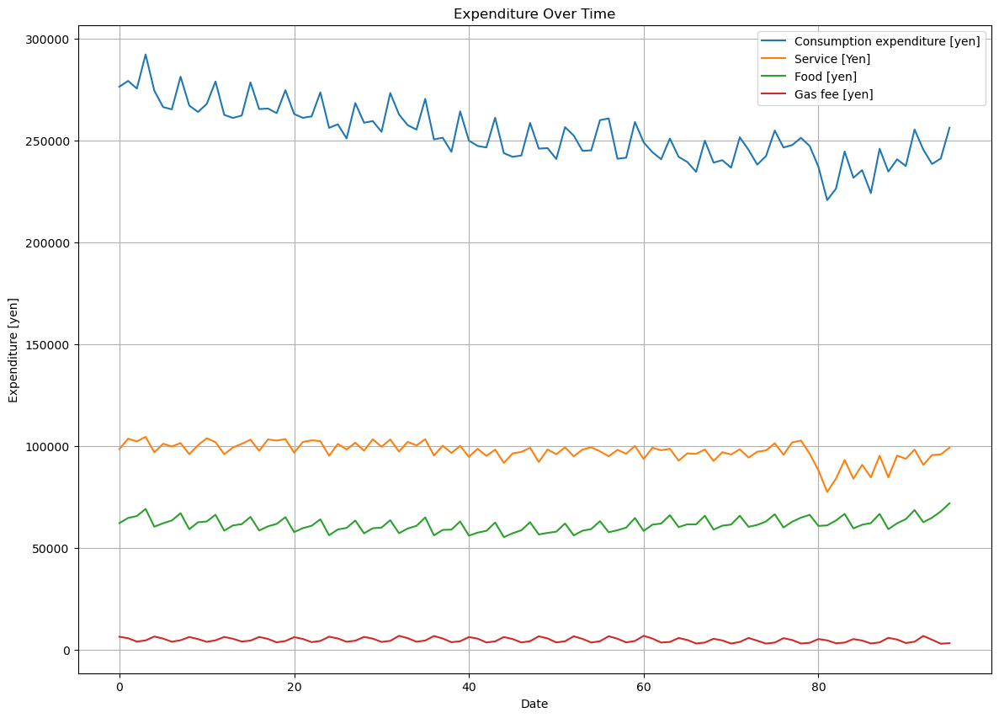

In [149]:
# List of the columns to display
columns_to_display = [
    'Consumption expenditure [yen]',
    'Service [Yen]',
    'Food [yen]',
    'Gas fee [yen]',
]

df[columns_to_display]

#making the plot
plt.figure(figsize=(14, 10))

for column in columns_to_display:
    plt.plot(df.index, df[column], label=column)

plt.title('Expenditure Over Time')
plt.xlabel('Date')
plt.ylabel('Expenditure [yen]')
plt.legend(loc='best')
plt.grid(True)
plt.show()

#### Observations and Next Steps

As we can observe, these columns are non-seasonal. We will then perform a seasonal adjustment on them using the seasonal_decompose method from statsmodel.


In [150]:
period = 4

# function to sesonally adjust each column in the list 
for column in columns_to_display:
    try:
        # Perform seasonal decomposition using seasonal_decompose()
        result = seasonal_decompose(df[column].dropna(), model='multiplicative', period=period)
        
        seasonally_adjusted = df[column] / result.seasonal
        
        df[column] = seasonally_adjusted
        
    except Exception as e:
        print(f"Could not process column {column}: {e}")

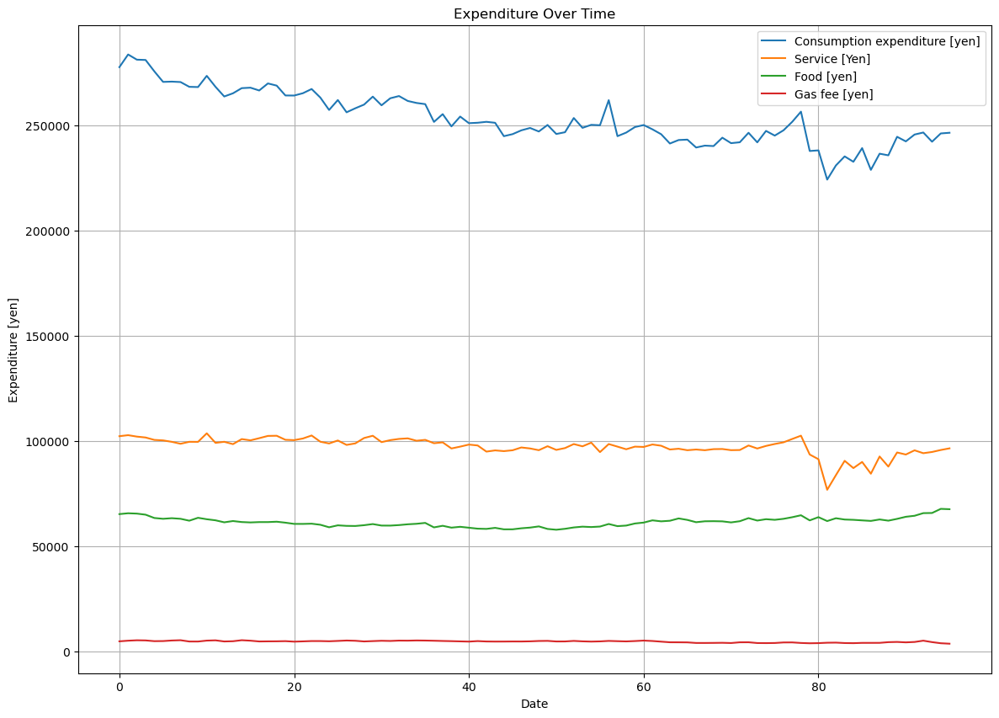

In [151]:
df[columns_to_display]

plt.figure(figsize=(14, 10))

for column in columns_to_display:
    plt.plot(df.index, df[column], label=column)

plt.title('Expenditure Over Time')
plt.xlabel('Date')
plt.ylabel('Expenditure [yen]')
plt.legend(loc='best')
plt.grid(True)
plt.show()

In [152]:
# Parse the 'Quarter' column
def parse_quarter(quarter_str):
    parts = quarter_str.split()
    year = int(parts[0])
    q_map = {"1～3": "Q1", "4～6": "Q2", "7～9": "Q3", "10～12": "Q4"}
    quarter = q_map[parts[1]]
    return pd.Period(f"{year}{quarter}")

df['Quarter'] = df['Quarter'].apply(parse_quarter)

# Merge the dataframes
merged_df = pd.merge(df, quarterly_data, on='Quarter', how='inner')

In [153]:
# Merge the wages DataFrame with the merged_df
merged_df = merged_df.merge(wages, left_index=True, right_index=True, how='inner')
#same process here but for jxy datas
merged_df2 = pd.merge(df, quarterly_data2, on='Quarter', how='inner')
merged_df2 = merged_df2.merge(wages, left_index=True, right_index=True, how='inner')

Correlation between original Consumption expenditure [yen] and Price: -0.4644


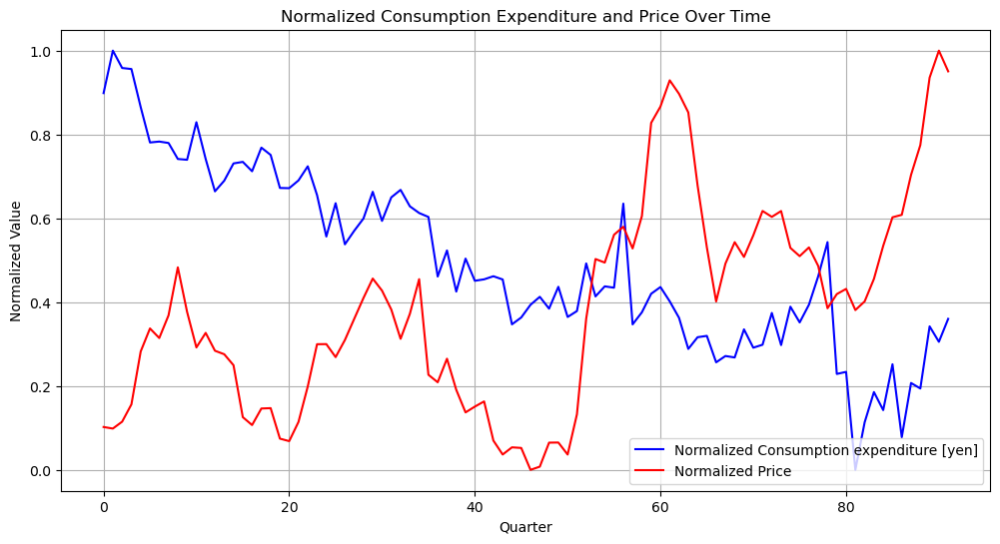

In [154]:
# Calculate the correlation
correlation_original = merged_df['Consumption expenditure [yen]'].corr(merged_df['Price'])

print(f"Correlation between original Consumption expenditure [yen] and Price: {correlation_original:.4f}")


scaler = MinMaxScaler()
#normalize datas
normalized_data = merged_df[['Consumption expenditure [yen]', 'Price']].copy()
normalized_data[['Consumption expenditure [yen]', 'Price']] = scaler.fit_transform(normalized_data[['Consumption expenditure [yen]', 'Price']])

#create the graph
plt.figure(figsize=(12, 6))
plt.plot(normalized_data.index, normalized_data['Consumption expenditure [yen]'], label='Normalized Consumption expenditure [yen]', color='blue')
plt.plot(normalized_data.index, normalized_data['Price'], label='Normalized Price', color='red')
plt.title('Normalized Consumption Expenditure and Price Over Time')
plt.xlabel('Quarter')
plt.ylabel('Normalized Value')
plt.legend()
plt.grid(True)

plt.show()

In [155]:
# Ensure stationarity
def make_stationary(series):
    p_value = adfuller(series)[1]
    while p_value > 0.05:
        series = series.diff().dropna()
        p_value = adfuller(series)[1]
    return series


## 6.1 - Analysis of the Impact of CNY/JPY Exchange Rate on Household Food Expenses in Japan

### 6.1.1 - Introduction

In this analysis, we have examined the relationship between the `Price` variable (representing the CNY/JPY exchange rate) and `Food [yen]` (household expenses on food in Japan) using two time series models: the ARDL model and the VAR model.The ARDL use as an explenatory variables in case 1 only the exchange rate and then the exchange rate and salaries in case number 2.
 
This section provides insights into whether and how the `Price` variable impacts `Food [yen]`, and discusses potential improvements to the model.

### 6.1.2 - Model Results

#### ARDL Model Results

- **Model Summary**:
  - **Dependent Variable**: Food [yen]
  - **Explenatory Variable**: Price 
  - **Model**: ARDL(6, 6)
  - **Significant Effects**:
    - `Food [yen].L1` (p-value: 0.000) - Significant negative impact
    - `Price.L1` (p-value: 0.003) - Significant positive impact
  
- **Model Summary**:
  - **Dependent Variable**: Food [yen]
  - **Explenatory Variable**: Price, Salary 
  - **Model**: ARDL(6, 6)
  - **Significant Effects**:
    - `Food [yen].L1` (p-value: 0.000) - Significant negative impact
    - `Price.L1` (p-value: 0.023) - Significant positive impact

- **Interpretation**:
  The ARDL model results indicate that the `Price` variable, particularly its lagged value (`Price.L1`), has a significant positive impact on `Food [yen]` no matter if Salary is used or not as an explenatory variables. This suggests that past values of the CNY/JPY exchange rate have a notable effect on current household food expenses in Japan.

#### VAR Model Results

- **Model Summary**:
  - **No. of Equations**: 2
  - **Significant Effects**:
    - `L1.Food [yen]` (p-value: 0.000) - Significant negative impact
    - `L1.Price` (p-value: 0.004) - Significant positive impact
  - **IRF Graph**
    - IRF suggests that a positive price shock leads to a significant, but temporary, increase in food expenditure. The impact is strongest immediately after the shock, and fades over time. The strong initial reaction indicates a short-term sensitivity of food expenditure to price variations.

- **Interpretation**:
  The VAR model results show that the lagged value of `Price` also has a significant positive effect on `Food [yen]`. This further supports the finding that changes in the CNY/JPY exchange rate influence household food expenses in Japan.

### 6.1.3 - Conclusion

Based on the results from both the ARDL and VAR models, we can conclude that the `Price` variable (CNY/JPY exchange rate) significantly impacts `Food [yen]` (household food expenses in Japan). Specifically, an increase in the CNY/JPY exchange rate is associated with an increase in household food expenses. This relationship is significant and consistent across both models.

#### Price Elasticity of Food and Impact of Imports

The positive impact of the `Price` variable on `Food [yen]` can be better understood by considering the concept of price elasticity of food and the reliance of Japan on imported food products:

1. **Price Elasticity of Food**:
   - **Elasticity of Food**: Food generally has a price elasticity of less than 1, meaning it is inelastic. This implies that changes in food prices have a relatively smaller effect on the quantity of food consumed. Consequently, even if food prices increase due to changes in the exchange rate, the expenditure on food may increase because households are less responsive to price changes in terms of reducing their consumption. This paper: [Analysis of the food consumption of Japanese'](https://openknowledge.fao.org/server/api/core/bitstreams/edd003c9-b1a8-42be-8e68-d364c393ba9d/content). shows that out of 11 types of food studied Only Non-glutinous rice and FAFH (Food Away From Home) have an elasticity with an absolute value greater than 1, indicating elastic demand, the 9 others are inelastic. (TABLE 4.3
Whole sample elasticities for 11 major food products (OLS), page 38)

1. **Impact of Food Imports**:
   - **Imported Food Dependence**: A significant portion of food consumed in Japan is imported

    In 2022, Japan imported $24.9B in Foodstuffs, mainly from:

    - China: $5.56B (22.3%)
    - Thailand: $3.24B (13.0%)
    - United States: $2.36B (9.5%)
    - South Korea: $1.48B (5.9%)
    - Italy: $1.44B (5.8%)
    The data are from [OEC World](https://oec.world/en/profile/bilateral-product/foodstuffs/reporter/jpn).
    
   . When the CNY/JPY exchange rate rises, the Japanese yen depreciates relative to the Chinese yuan. This depreciation makes imports more expensive.
   - **Explanation of Results**: As the exchange rate rises and the yen weakens, the cost of imported food items increases. Since food consumption is relatively inelastic, households continue to purchase food despite higher prices. This results in an increase in overall food expenditure.

   The positive relationship observed between the CNY/JPY exchange rate and household food expenditure can therefore be explained by the increased cost of imports leading to higher food prices. Given the inelastic nature of food demand, these price increases are not fully offset by reductions in food consumption, resulting in higher food expenditure.

#### How `Price` Impacts `Food [yen]`

The positive impact of `Price` on `Food [yen]` suggests that fluctuations in the CNY/JPY exchange rate affect the cost of food. As the exchange rate changes, it may influence the prices of imported food items or the overall cost structure of food expenses in Japan.

### 6.1.4 - Potential Improvements

To enhance the analysis and model accuracy, the following improvements could be considered:

1. **Introduce Additional Variables**:
   - **Inflation Rate**: Including inflation data could help capture how general price level changes impact household expenses.
   - **GDP**: Adding GDP could provide insights into how the macro economic tendency of the country in conjunction with exchange rate changes affect household consumption expenditure.


By implementing these improvements, the analysis could offer a more comprehensive understanding of the factors influencing household food expenses in Japan and the role of the CNY/JPY exchange rate.


-------------------------------------------------------------------------------------------------------------------------------------------------
### 6.1.5 - Analyzing the Impact of CNY/JPY Exchange Rate on Gas Fee Spending

#### Objective
The aim is to investigate whether household spending on gas fees increase due to the changes in the Yen exchange rate.

#### Hypothesis & Methodology
1. **Price Increase Hypothesis:** 
   - The hypothesis for Gas fee expenditure is the same as for Food since both goods are mainly imported in Japan. 
   - The methodolgy here is also smiliar except we will use the FXY (a Yen index) as an explanaotry variables in our model. This exvhange rate seems more relevant here because most of the Gas import in Japan does not come from China but from other countries.
   "Japan imports Natural gas, liquefied primarily from: Australia ($24B), Malaysia ($8.06B), Russia ($4.48B), Papua New Guinea ($3.25B), and United States ($3B)" [1].

   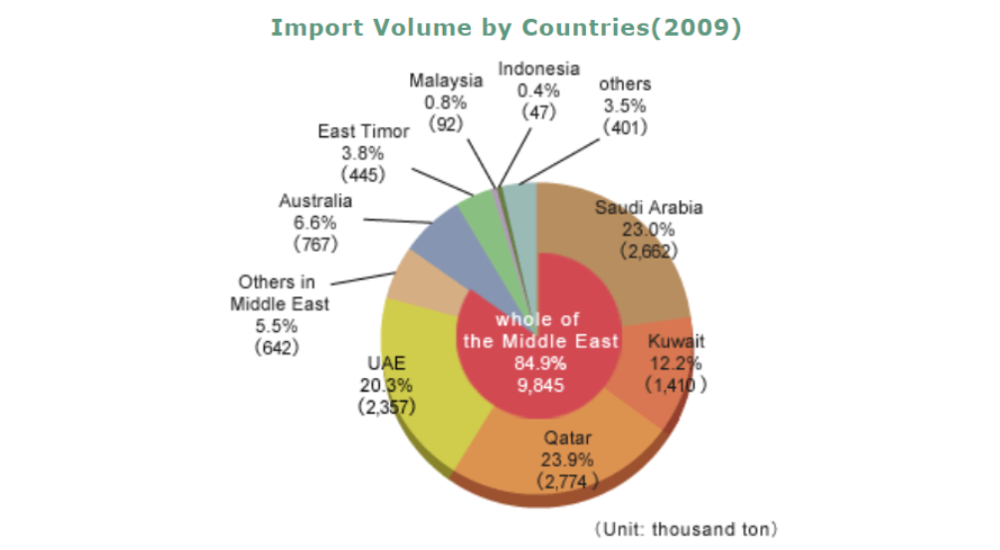


#### Expected Outcomes
1. **Consumer Expenditure:**
   - Gas fee is also considered as inelastic, we can expect that the changes on CNY/JPY impact gas fees spendings. 



[1] "Natural gas, liquefied in Japan," The Observatory of Economic Complexity, [Online]. Available: https://oec.world/en/profile/bilateral-product/natural-gas-liquefied/reporter/jpn. [Accessed: 20-Jul-2024].

[2] "The LP Gas Industry in Japan," The Japan LP Gas Association, [Online]. Available: https://www.j-lpgas.gr.jp/en/industry/index.html. [Accessed: 20-Jul-2024].

In [156]:

analysis_df = merged_df2[['Quarter', 'Gas fee [yen]', 'Price']]
analysis_df.set_index('Quarter', inplace=True)

analysis_df['Gas fee [yen]'] = make_stationary(analysis_df['Gas fee [yen]'])
analysis_df['Price'] = make_stationary(analysis_df['Price'])


analysis_df.dropna(inplace=True)

# Fit the ARDL model
endog = analysis_df['Gas fee [yen]']
exog = analysis_df[['Price']]  


lags = 6
order = 6
model = tsa.ARDL(endog, lags=lags, exog=exog, order=order)
results = model.fit()

print(results.summary())


                              ARDL Model Results                              
Dep. Variable:          Gas fee [yen]   No. Observations:                   66
Model:                     ARDL(6, 6)   Log Likelihood                -392.298
Method:               Conditional MLE   S.D. of innovations            167.228
Date:                Sat, 20 Jul 2024   AIC                            814.596
Time:                        13:12:33   BIC                            846.011
Sample:                    03-31-2009   HQIC                           826.884
                         - 12-31-2023                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const              -31.4580     25.667     -1.226      0.227     -83.123      20.207
Gas fee [yen].L1     0.0339      0.151      0.225      0.823      -0.270       0.338
Gas fee [yen].L2    -0.3916 

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\2711668243.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\2711668243.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\2711668243.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-v

In [157]:
#Same process here but adding the Salary variable

analysis_df = merged_df2[['Quarter', 'Gas fee [yen]', 'Price', 'Salary']]
analysis_df.set_index('Quarter', inplace=True)

analysis_df['Gas fee [yen]'] = make_stationary(analysis_df['Gas fee [yen]'])
analysis_df['Price'] = make_stationary(analysis_df['Price'])
analysis_df['Salary'] = make_stationary(analysis_df['Salary'])

analysis_df.dropna(inplace=True)

endog = analysis_df['Gas fee [yen]']
exog = analysis_df[['Price', 'Salary']]  

lags = 6
order = 6
model = tsa.ARDL(endog, lags=lags, exog=exog, order=order)
results = model.fit()

print(results.summary())


                              ARDL Model Results                              
Dep. Variable:          Gas fee [yen]   No. Observations:                   66
Model:                  ARDL(6, 6, 6)   Log Likelihood                -388.234
Method:               Conditional MLE   S.D. of innovations            156.276
Date:                Sat, 20 Jul 2024   AIC                            820.468
Time:                        13:12:40   BIC                            866.543
Sample:                    03-31-2009   HQIC                           838.490
                         - 12-31-2023                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const              -14.6252     28.777     -0.508      0.614     -72.832      43.582
Gas fee [yen].L1     0.0756      0.191      0.397      0.693      -0.310       0.461
Gas fee [yen].L2    -0.3879 

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\2276018414.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\2276018414.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\2276018414.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

In [158]:
corr_matrix = analysis_df.corr()
print(corr_matrix)

# Fit the VAR model
model = VAR(analysis_df)
results = model.fit(maxlags=4, ic='aic')

print(results.summary())



               Gas fee [yen]     Price    Salary
Gas fee [yen]       1.000000  0.056064  0.000437
Price               0.056064  1.000000  0.040074
Salary              0.000437  0.040074  1.000000
  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 20, Jul, 2024
Time:                     13:12:50
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                    35.8026
Nobs:                     62.0000    HQIC:                   34.9899
Log likelihood:          -1293.32    FPE:                9.46194e+14
AIC:                      34.4645    Det(Omega_mle):     5.34529e+14
--------------------------------------------------------------------
Results for equation Gas fee [yen]
                      coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------------
const       

### 6.1.6 - Conclusion Based on ARDL Model Results for Gas Fee [Yen]

The ARDL model results reveal important insights into the relationship between gas fees and prices:


### 6.1.7 - ARDL Model Results

#### Model Summary

- **Dependent Variable**: Gas fee [yen]
- **Explanatory Variable**: Price 
- **Model**: ARDL(6, 6)
- **Significant Effects**:
  - `Gas fee [yen].L2` (p-value: 0.011) - Significant negative impact
  - `Price.L3` (p-value: 0.045) - Significant negative impact
  
#### Model Summary

- **Dependent Variable**: Gas fee [yen]
- **Explanatory Variable**: Price, Salary 
- **Model**: ARDL(6, 6, 6)
- **Significant Effects**:
  - `Gas fee [yen].L2` (p-value: 0.030) - Significant negative impact
  - `Price.L6` (p-value: 0.091) - Marginally significant positive impact

#### Interpretation

The second model using both Price and Salary as an explenatory model does not seem to improve the model regarding AIC and BIC model selection criteria. For this reason, we will consider here only the result of the first model. ARDL model indicate that the second lag of gas fees has a significant negative impact on current gas fees. Additionally, the third lag of price has a significant negative effect

### 6.1.8 VAR Model Results

#### Model Summary

- **No. of Equations**: 3
- **Significant Effects**:
  - `L2.Gas fee [yen]` (p-value: 0.006) - Significant negative impact
  - `L3.Price` (p-value: 0.026) - Significant negative impact
  - `L4.Price` (p-value: 0.047) - Significant negative impact

#### Interpretation

The VAR model results show that the second lag of gas fees has a significant negative effect on current gas fees. Additionally, the third and fourth lags of price have significant negative impacts on gas fees. This suggests that past gas fees and prices have a notable influence on current gas fees.

### 6.1.9 - Conclusion

The results from both the ARDL and VAR models contradicts our hypothesis. Indeed, here, when the CNY/JPY values 9 months earlier(L3.lag) seem to have a negative impact on household gas fee spending. This contradicts the hypothesis that an inelastic imported good should see its consumption increase if exchange rates become less favorable for imports. Here, the opposite seems to be true.


#### Factors Influencing Gas Fees
Beyond price, gas fees are influenced by:

1. **Seasonal Variations**: Increased consumption in colder months for heating and decreased in warmer months.
2. **Government Policies and Subsidies**: Policies, subsidies, and taxes significantly impact gas prices and consumption patterns.

These factors, along with price changes, interact to influence household spending on gas over time and might explain these contradictory results.

-------------------------------------------------------------------------------------------------------------------------------------------------

## 6.2 - Analysis of the Impact of Exchange Rates on Service Expenditure

### 6.2.1 - Context

In this analysis, we focus on the `Service [Yen]` category to examine if fluctuations in the CNY/JPY exchange rate impact this aspect of household consumption expenditure. Services represent a significant portion of household spending, making them an important component of our analysis.

### 6.2.2 - Expectations

- **Exchange Rate Impact:** Given that services are generally less sensitive to exchange rate changes compared to goods, we exepct no impact of the CNY/JPY exchange rate on service expenditure. The theoretical framework suggests that the prices of services are primarily determined by domestic factors rather than international exchange rates.
  
- **Model Setup:** We use the ARDL (AutoRegressive Distributed Lag) model to analyze the relationship between service expenditure and the exchange rate. The ARDL model allows us to investigate both short-term and long-term dynamics between the variables.

In [159]:
analysis_df = merged_df[['Quarter', 'Service [Yen]', 'Price']]
analysis_df.set_index('Quarter', inplace=True)

analysis_df['Service [Yen]'] = make_stationary(analysis_df['Service [Yen]'])

analysis_df.dropna(inplace=True)

# Fit the ARDL model
endog = analysis_df['Service [Yen]']
exog = analysis_df[['Price']]  


lags = 6
order = 6
model = tsa.ARDL(endog, lags=lags, exog=exog, order=order)
results = model.fit()

print(results.summary())

                              ARDL Model Results                              
Dep. Variable:          Service [Yen]   No. Observations:                   91
Model:                     ARDL(6, 6)   Log Likelihood                -789.626
Method:               Conditional MLE   S.D. of innovations           2619.619
Date:                Sat, 20 Jul 2024   AIC                           1609.253
Time:                        13:13:49   BIC                           1645.893
Sample:                    12-31-2001   HQIC                          1623.990
                         - 12-31-2022                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const            -1235.4248   2953.172     -0.418      0.677   -7123.883    4653.033
Service [Yen].L1    -0.3371      0.117     -2.871      0.005      -0.571      -0.103
Service [Yen].L2    -0.0193 

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\4023714529.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\4023714529.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [160]:
#Same process here but adding the Salary variable

analysis_df = merged_df2[['Quarter', 'Service [Yen]', 'Price', 'Salary']]
analysis_df.set_index('Quarter', inplace=True)

analysis_df['Service [Yen]'] = make_stationary(analysis_df['Service [Yen]'])
analysis_df['Price'] = make_stationary(analysis_df['Price'])
analysis_df['Salary'] = make_stationary(analysis_df['Salary'])

analysis_df.dropna(inplace=True)

endog = analysis_df['Service [Yen]']
exog = analysis_df[['Price', 'Salary']]  

lags = 6
order = 6
model = tsa.ARDL(endog, lags=lags, exog=exog, order=order)
results = model.fit()

print(results.summary())


                              ARDL Model Results                              
Dep. Variable:          Service [Yen]   No. Observations:                   66
Model:                  ARDL(6, 6, 6)   Log Likelihood                -559.287
Method:               Conditional MLE   S.D. of innovations           2704.047
Date:                Sat, 20 Jul 2024   AIC                           1162.573
Time:                        13:13:54   BIC                           1208.649
Sample:                    03-31-2009   HQIC                          1180.596
                         - 12-31-2023                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const              214.2557    491.942      0.436      0.666    -780.792    1209.303
Service [Yen].L1    -0.3685      0.157     -2.353      0.024      -0.685      -0.052
Service [Yen].L2     0.0191 

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\1178802302.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\1178802302.py:7: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\1178802302.py:8: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/panda

In [161]:

corr_matrix = analysis_df.corr()
print(corr_matrix)

# Fit the VAR model
model = VAR(analysis_df)
results = model.fit(maxlags=4, ic='aic')

print(results.summary())


               Service [Yen]     Price    Salary
Service [Yen]       1.000000 -0.065121 -0.030039
Price              -0.065121  1.000000  0.040074
Salary             -0.030039  0.040074  1.000000
  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 20, Jul, 2024
Time:                     13:14:02
--------------------------------------------------------------------
No. of Equations:         3.00000    BIC:                    40.9943
Nobs:                     64.0000    HQIC:                   40.5649
Log likelihood:          -1540.58    FPE:                3.14107e+17
AIC:                      40.2859    Det(Omega_mle):     2.30061e+17
--------------------------------------------------------------------
Results for equation Service [Yen]
                      coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------------
const       

### 6.2.3 - Analysis of the Impact of Exchange Rates on Service Expenditure

#### Model Summary

- **Dependent Variable**: Service [Yen]
- **Explanatory Variable**: Price 
- **Model**: ARDL(6, 6)
- **Significant Effects**:
  - `Service [Yen].L1` (p-value: 0.005) - Significant negative impact
  - `Service [Yen].L3` (p-value: 0.013) - Significant negative impact
  
#### Model Summary

- **Dependent Variable**: Service [Yen]
- **Explanatory Variable**: Price, Salary 
- **Model**: ARDL(6, 6, 6)
- **Significant Effects**:
  - `Service [Yen].L1` (p-value: 0.024) - Significant negative impact
  - `Service [Yen].L3` (p-value: 0.041) - Significant negative impact
  - `Salary.L5` (p-value: 0.051) - Marginally significant positive impact

#### Interpretation

ARDL model indicates that the first and third lags of service fees have significant negative impacts on current service fees. The CNY/JPY exchange rate lags does not impact Household spending on services.

### 6.2.4 - VAR Model Results

#### Model Summary

- **No. of Equations**: 3
- **Significant Effects**:
  - `L1.Service [Yen]` (p-value: 0.021) - Significant negative impact

#### Interpretation

The VAR model results show that the first lag of service fees has a significant negative effect on current service fees.

###  6.2.5 - Conclusion

The results of the ARDL and VAR models confirm our hypothesis. Here, prices of lagged values appear to have no impact on household spending on services. This is in line with the theoretical expectation that services, being less directly linked to international markets, are less influenced by exchange rate variations.

# 7 - Mean Salary in Japan vs HC <a id="section_3_4"></a>

We are now trying to find what really is influencing the consumption of Houseold, for that we are looking at the average salary in japan in the past 20 years and we will be trying to see if the correlation is better :  
the datas are from : https://stats.oecd.org/Index.aspx?DataSetCode=AV_AN_WAGE#  in NCU  
In this case the data are nominal when the data for the households consumption is real

In [43]:
df_salary = pd.read_csv('datas/wage_japan.csv')
df_salary = df_salary[['Time', 'Value']]

In [44]:
quarters = pd.date_range(start='2000-01-01', end='2022-12-31', freq='Q')
df_quarters = pd.DataFrame({'Time': quarters.year, 'Quarter': quarters})
df_merged = pd.merge(df_quarters, df_salary, on='Time', how='left')
df_merged['Value'] = df_merged['Value'].interpolate()
df_merged['Quarter'] = df_merged['Quarter'].apply(lambda x: x.replace(day=1))
df_merged.rename(columns={'Quarter': 'Date'}, inplace=True)
df_merged.rename(columns={'Value': 'Salary'}, inplace=True)
df_merged.drop(columns=['Time'], inplace=True)

In [45]:
house = pd.read_csv('datas/gdp_seasonely.csv')
house = house[['Date', 'Consumption ofHouseholds']]
house = house.iloc[1:].reset_index(drop=True)

house['Date'] = house['Date'].str.strip()
house['Year'] = house['Date'].apply(lambda x: x if '/' in x else None).ffill()
house['Date'] = house.apply(convert_date, axis=1)
house = house.drop(columns=['Year'])
house.rename(columns={'Consumption ofHouseholds': 'House'}, inplace=True)
house['Date'] = pd.to_datetime(house['Date'])
house['House'] = house['House'].str.replace(',', '').astype(float)

In [46]:
house_salary = house.merge(df_merged,on='Date', how ='inner')

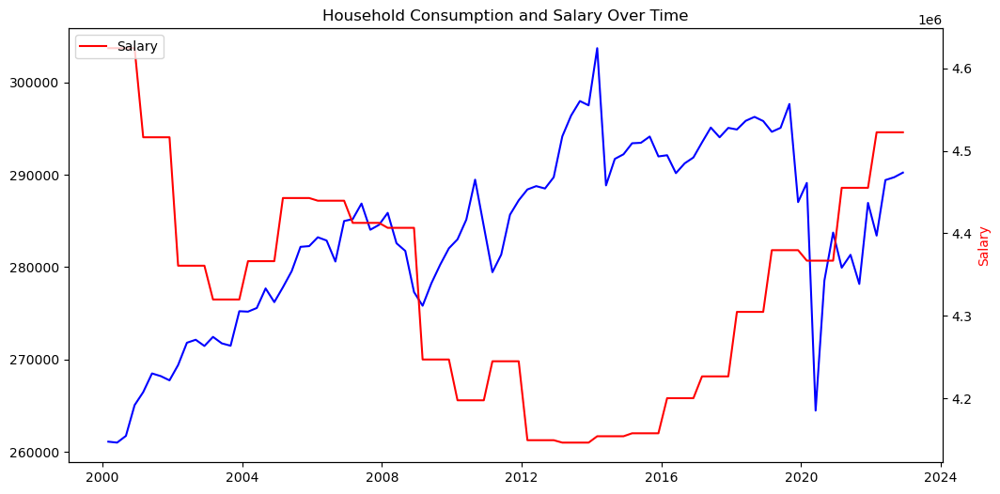

In [47]:
plt.figure(figsize=(12, 6))
plt.plot(house_salary['Date'], house_salary['House'], color='b', label='House Consumption')

plt.twinx()
plt.plot(house_salary['Date'], house_salary['Salary'], color='r', label='Salary')

plt.title('Household Consumption and Salary Over Time')
plt.xlabel('Date')
plt.ylabel('House Consumption', color='b')
plt.ylabel('Salary', color='r')

plt.legend(loc='upper left')
plt.show()

In [48]:
correlation = house_salary[['House', 'Salary']].corr()
print("Correlation between House Consumption and Wage value:\n", correlation)

Correlation between House Consumption and Wage value:
            House    Salary
House   1.000000 -0.624681
Salary -0.624681  1.000000


### 7.0.1 - Real mean salary

Here we are going to use the same data but trying to transform them in **Real** terms so that it will match better  
In the data 2015 is the reference so it's 100 and the rest depends on 2015

https://stats.oecd.org/Index.aspx?DataSetCode=PRICES_CPI

In [49]:
consumer = pd.read_csv('datas/consumer_index.csv')
consumer = consumer[['Time', 'Value']]

quarters = pd.date_range(start='2000-01-01', end='2022-12-31', freq='Q')
df_quarters = pd.DataFrame({'Time': quarters.year, 'Quarter': quarters})
df_merged = pd.merge(df_quarters, consumer, on='Time', how='left')
df_merged['Value'] = df_merged['Value'].interpolate()
df_merged['Quarter'] = df_merged['Quarter'].apply(lambda x: x.replace(day=1))
df_merged.rename(columns={'Quarter': 'Date'}, inplace=True)
df_merged.rename(columns={'Value': 'Cons_index'}, inplace=True)
df_merged.drop(columns=['Time'], inplace=True)

In [50]:
house_salary_cons = house_salary.merge(df_merged,on='Date', how ='inner')
house_salary_cons['Salary_real'] = house_salary_cons['Salary'] / (house_salary_cons['Cons_index'] / 100)

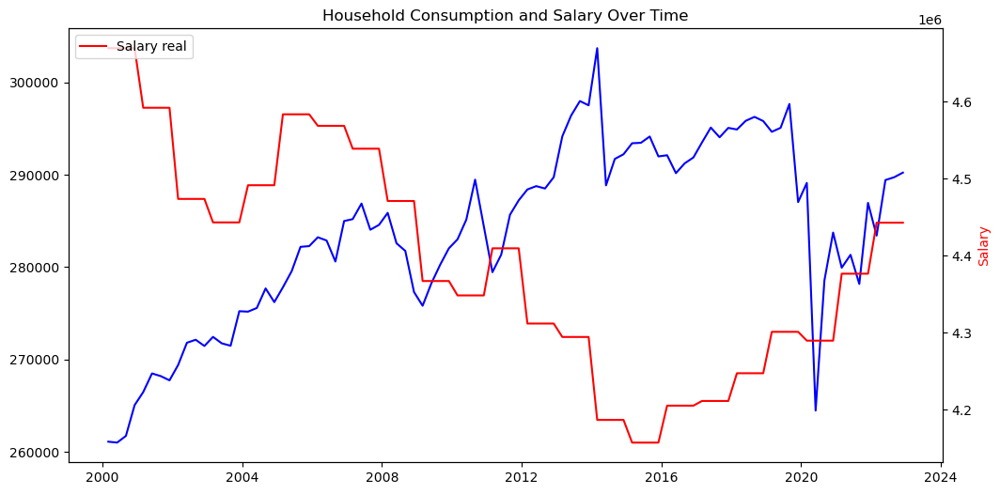

In [51]:
plt.figure(figsize=(12, 6))
plt.plot(house_salary_cons['Date'], house_salary_cons['House'], color='b', label='House Consumption')

plt.twinx()
plt.plot(house_salary_cons['Date'], house_salary_cons['Salary_real'], color='r', label='Salary real')

plt.title('Household Consumption and Salary Over Time')
plt.xlabel('Date')
plt.ylabel('House Consumption', color='b')
plt.ylabel('Salary', color='r')

plt.legend(loc='upper left')
plt.show()

**Hypothesis Justification**  
Hypothesis: There is a positive correlation between mean salary and household consumption in Japan, indicating that higher incomes lead to increased consumption.

**Methodology Justification**  
Approach: Employing correlation analysis and Ordinary Least Squares (OLS) regression to investigate the direct relationship between salary and consumption, complemented by contextual demographic analysis.

**Strengths:**
Correlation Analysis: Provides a straightforward statistical measure to initially explore the relationship between salary and consumption.
OLS Regression: Quantifies how changes in salary impact consumption, with statistical rigor to ascertain the significance of this relationship.
VAR Model: Captures complex interactions and the time-lagged effects of mean salary on Households consumption, enhancing the analysis by addressing variable interdependencies.

In [52]:
correlation = house_salary_cons[['House', 'Salary_real']].corr()
print("Correlation between House Consumption and Wage value:\n", correlation)

Correlation between House Consumption and Wage value:
                 House  Salary_real
House        1.000000    -0.748145
Salary_real -0.748145     1.000000


In [53]:
import statsmodels.api as sm

X = house_salary_cons['Salary_real']
y = house_salary_cons['House']

X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:                  House   R-squared:                       0.560
Model:                            OLS   Adj. R-squared:                  0.555
Method:                 Least Squares   F-statistic:                     114.4
Date:                Sat, 20 Jul 2024   Prob (F-statistic):           1.03e-17
Time:                        10:46:21   Log-Likelihood:                -937.01
No. Observations:                  92   AIC:                             1878.
Df Residuals:                      90   BIC:                             1883.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
const         5.09e+05   2.11e+04     24.154      

In [54]:
df = house_salary_cons[['Salary_real', 'House']].copy()

if not check_stationarity(df['Salary_real']):
    df['Salary_real'] = df['Salary_real'].diff().dropna()

if not check_stationarity(df['House']):
    df['House'] = df['House'].diff().dropna()

df = df.dropna()
model = VAR(df)
results = model.fit(maxlags=3)

print(results.summary())

  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 20, Jul, 2024
Time:                     10:46:21
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    38.0117
Nobs:                     88.0000    HQIC:                   37.7764
Log likelihood:          -1890.91    FPE:                2.17472e+16
AIC:                      37.6176    Det(Omega_mle):     1.86604e+16
--------------------------------------------------------------------
Results for equation Salary_real
                    coefficient       std. error           t-stat            prob
---------------------------------------------------------------------------------
const              -2835.136383      3611.989806           -0.785           0.432
L1.Salary_real         0.019152         0.111161            0.172           0.863
L1.House               0.865134         0.882051  

C:\Users\bodin\anaconda3\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: An unsupported index was provided and will be ignored when e.g. forecasting.
  self._init_dates(dates, freq)


### 7.0.2 - Correlation and Regression Analysis Summary

The analysis of the relationship between mean salary and household consumption in Japan yields insightful results. Initially, the correlation between nominal salary and real household consumption shows a moderate inverse relationship with a coefficient of **-0.62**, implying that increases in nominal salaries tend to be accompanied by decreases in real household consumption. When adjusted for real terms, the correlation coefficient drops to **-0.74**, indicating a stronger negative relationship due to the adjustments for inflation effects.

#### Regression Model Details

An Ordinary Least Squares (OLS) regression model further explores this relationship, defined by the equation:

$$\text{Household Consumption} = 5.09 \times 10^5 - 0.0513 \times \text{Real Salary}$$

The model’s R-squared value of **0.560** explains approximately 56% of the variability in household consumption based on changes in real salary. The regression coefficient for real salary is **-0.0513**, which is statistically significant with a **t-value of -10.697** and a **p-value less than 0.0001**. This suggests that for every unit increase in real salary, there is a corresponding decrease of 0.0513 units in household consumption.

#### VAR Model Analysis  
A Vector Autoregression (VAR) model was also applied to further understand the dynamic relationship between mean salary and household consumption over time. The VAR model included three lags based on the optimal lag selection criteria.

Equation for Salary_real:  
The coefficients for lags of real salary and household consumption were **not statistically significant**, indicating that past values of real salary and household consumption do not significantly predict current values of real salary.
The constant term was also not significant.  

Equation for House:  
The coefficient for the first lag of household consumption (L1.House) was **significant with a value of -0.3304** and a p-value of 0.003, indicating that past household consumption negatively affects current household consumption.
The coefficients for lags of real salary were not statistically significant, suggesting that past values of real salary do not significantly predict current household consumption.  
The VAR model’s results reinforce the findings from the OLS regression, emphasizing the negative relationship between real salary and household consumption.  

#### Economic Implications

The negative coefficient for real salary indicates that higher real salaries lead to decreased household consumption, potentially due to increased savings or shifts in consumption patterns. This relationship highlights the critical role of real income adjustments in understanding household consumption dynamics and suggests significant behavioral changes in savings and investments as incomes rise in real terms.

-----------------------------------------------------------------------------------------------------------------------

###  7.0.3 - Why we obtain those results - Impact of Mean Salary on Households Consumption <a id="sub_section_3_4_2"></a>

#### Excess Savings and Consumption Patterns

The **Annual Report on the Japanese Economy and Public Finance 2022** highlights an accumulation of excess household savings, particularly noted during the pandemic in 2020. It suggests:

"As consumer spending in the immediate future is supported by **excess household savings**, which increased substantially in 2020, a consumer spending recovery is expected to grow more robust under pay hikes." **(p4)**

This observation aligns with the regression findings where increased real salaries may not translate into proportional increases in consumption because households are leveraging these excess savings. This might be impacting the typical spending behaviors, possibly shifting from regular consumption to saving due to economic uncertainty or future financial planning.

#### Demographic Consumption Trends

The report also notes differences in spending habits among age groups:

"However, middle-aged and older people (aged between 40 and 59 and between 60 and 74) **are more cautious of spending money on services** than younger people aged between 25 and 39." **(p2)**

This cautious spending behavior among older demographics can contribute significantly to the observed negative correlation between salary and consumption, as these groups might be more inclined to save due to retirement concerns, as indicated in the **2017 report**:

"Among the middle aged and elderly, amid an extension of the life expectancy, the **necessity to prepare for a retirement may increase budget-minded households**." **(p6)**

#### Labor Market and Income Dynamics

The **Annual Report on the Japanese Economy and Public Finance 2016 and 2017** provides insights into labor market dynamics and their impact on consumption:

"Main factors include a fizzling out of demand for durable goods due to different policies and **budget saving by households with householders under 39 years of age** (young child-rearing households) and early 60's unemployed households." **(p5, 2016)**

"The weak growth in consumption reflects the followings: (1) Among young generation, the confidence for the future employment and income **remains subdued**." **(p6, 2017)**

These statements support the regression model's findings, suggesting that despite increases in nominal wages and employment, consumption growth has been sluggish. This could be due to a lack of confidence in long-term economic stability, leading to increased saving instead of spending.

#### Improvement in Employment/Income Environment

Conversely, improvements in the employment and income environment noted in the **2017 report** have not fully translated into increased consumption:

"**Improvement in employment/income environment** (decline in unemployment rate, increase in employed persons, **increase in nominal wages**)... Private consumption has been picking up moderately. However, its growth has **been slow compared to the substantial improvement in the employment and income environment**." **(p3, p5, 2017)**

## 7.1 - Conclusion

The data and government reports collectively suggest that the observed inverse relationship between real salary increases and household consumption can be attributed to several factors: heightened savings due to economic uncertainty, cautious spending among older demographics, and subdued confidence among the younger population regarding future economic prospects. These insights align with the regression findings and highlight the complex interplay between income levels, demographic factors, and consumption behaviors in Japan. This analysis underscores the importance of considering broader economic and demographic trends when interpreting statistical data on salary and consumption relationships.


## 7.2 - Decrease in the Mean salary in Japan from 2000 to 2016  <a id="sub_section_3_4_1"></a>


#### Findings from the Cabinet Office White Paper (2009)

The shift from regular to non-regular employment is a significant factor in wage dynamics during this period. The Cabinet Office's white paper highlights this transformation:

**"The number of non-regular employees has increased and the percentage has risen to a third of the total employees. In particular, the number of regular employees had decreased and the number of temporary agency workers had increased in manufacturing industry, etc. from 2002 to 2007."** *(Page 19)*

**"Non-regular employees such as temporary agency workers are facing a significant risk such as high risk of disemployment."** *(Page 19)*

The increase in non-regular employment, particularly in sectors like manufacturing, correlates with lower wage averages, as these positions typically offer **lower salaries** and **less job security**. This structural shift in the workforce composition directly impacts the overall mean salary.

#### Wage Gap and Income Inequality


Wage disparity and income inequality also widened during this period, exacerbated by the increasing prevalence of non-regular employment:

**"Wage/household income (before redistribution) gap continues expanding. Trend in non-regular employment has contributed to the expansion of wage gap."** *(Page 22)*

**"The higher the ratio of non-regular employment is, the quicker the employment adjustment rate becomes."** *(Page 21)*

The expanding wage gap is closely tied to the rise in non-regular employment, which often provides **lower compensation** compared to regular employment. This trend not only reduces average wages but also accelerates employment adjustments, meaning **quicker layoffs** and **less stable employment conditions**.

#### Economic Recession and Unemployment

Economic downturns during this period further exacerbated wage disparities and influenced mean salary trends:

**"Increase in unemployment has a great impact on the expansion of income gap and relative poverty rate. Long-term unemployment leads to medium- to long-term expansion of wage gap due to career interruption."** *(Page 24)*

Economic recessions contribute to higher unemployment rates, which disproportionately affect non-regular workers and those in unstable employment conditions. Long-term unemployment not only affects immediate income but also causes **long-term career disruptions**, hindering wage growth over time.

#### Conclusion

The decline in the average salary for full-time workers in Japan from 2000 to 2016 can be attributed to a combination of increased non-regular employment, wider wage gaps, and economic recessions. These factors collectively contributed to a labor market that favors **lower wages** and **greater income inequality**, impacting the economic stability of full-time employees across the country.


The detailed analysis of Japan's declining mean salary from 2000 to 2016 provides crucial context for understanding the broader impacts on household consumption. As wages stagnated due to the rise in non-regular employment and wider wage gaps, households likely adjusted their spending downward, which, in turn, affects the overall economic dynamics including the influence of the yen. This connection underscores how wage trends directly link to consumption patterns, reflecting the indirect yet significant impact of currency valuation on domestic economic conditions.

------------------------------------------------------------------------------------------

# 8 - House Price in Japan vs HC <a id="section_3_5"></a>

We still cannot grasp the whole reason behind the growth of the Households conumpstion. We are going to make one last try at explaining the growth with free and open data. We are basing ourlself from the research paper from Muellbauer and Murata that we spoke about ealier about what influences the households consumption, they were saying that it could be more due to and also land prices. So for that we are going to use the Housing Prices index as we could not find free data on the land prices. The data are in real terms, seasonnaly adjusted from OECD :   
https://data-explorer.oecd.org/vis?lc=en&pg=0&tm=house%20price&snb=47&vw=tl&df[ds]=dsDisseminateFinalDMZ&df[id]=DSD_AN_HOUSE_PRICES%40DF_HOUSE_PRICES&df[ag]=OECD.ECO.MPD&df[vs]=1.0&dq=JPN.Q.RHP.&pd=2000-Q1%2C2024-Q2&to[TIME_PERIOD]=false

In [55]:
def convert_quarter_end_month(date):
    month = date.month
    if month == 1:
        month = 3
    elif month == 4:
        month = 6
    elif month == 7:
        month = 9
    elif month == 10:
        month = 12
    return date.replace(month=month)

In [56]:
house_price = pd.read_csv('datas/house_prices.csv')
house_price = house_price[['TIME_PERIOD', 'OBS_VALUE']]
house_price.columns = ['Date', 'house_price']
house_price['Date'] = pd.to_datetime(house_price['Date']).dt.strftime('%Y-%m-%d')
house_price['Date'] = pd.to_datetime(house_price['Date'])
house_price['Date'] = house_price['Date'].apply(convert_quarter_end_month)
house_price = house_price.sort_values(by='Date')
house_price

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\1473902670.py:4: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  house_price['Date'] = pd.to_datetime(house_price['Date']).dt.strftime('%Y-%m-%d')


,Date,house_price
12,2000-03-01,128.227528
13,2000-06-01,127.379894
1,2000-09-01,126.298918
2,2000-12-01,125.445053
30,2001-03-01,124.048400
...,...,...
70,2023-03-01,118.678510
71,2023-06-01,118.680353
72,2023-09-01,118.431648
73,2023-12-01,118.941428


#### Hypothesis
There is a negative relationship between house prices and household consumption in Japan. As house prices increase, household consumption decreases due to a larger proportion of household income being allocated towards housing expenses, thereby reducing disposable income for other expenditures.    
  
#### Methodology  
Analytical Techniques:  

Correlation Analysis: First, employ a correlation analysis to determine the strength and direction of the relationship between house prices and household consumption.  

Ordinary Least Squares (OLS) Regression:  
Use OLS regression to quantify the relationship between these variables.
Model house prices as a function of household consumption to observe the impact of consumption on housing prices.
Include necessary controls and dummy variables to account for other factors affecting house prices or consumption, such as interest rates, inflation, and economic cycles.  

Vector Autoregression (VAR) Model:  
Implement a VAR model to capture the dynamic interaction between house prices and household consumption over time.
Determine the optimal lag structure based on criteria like AIC, BIC etc...
Analyze the impulse response functions and variance decompositions to understand the magnitude and persistence of the effects between the variables.  

In [57]:
house_price['Date'] = pd.to_datetime(house_price['Date'])
house_salary_cons = house_salary_cons.merge(house_price, on='Date', how='inner')

### 8.0.1 - Households consumption vs Houses prices index 

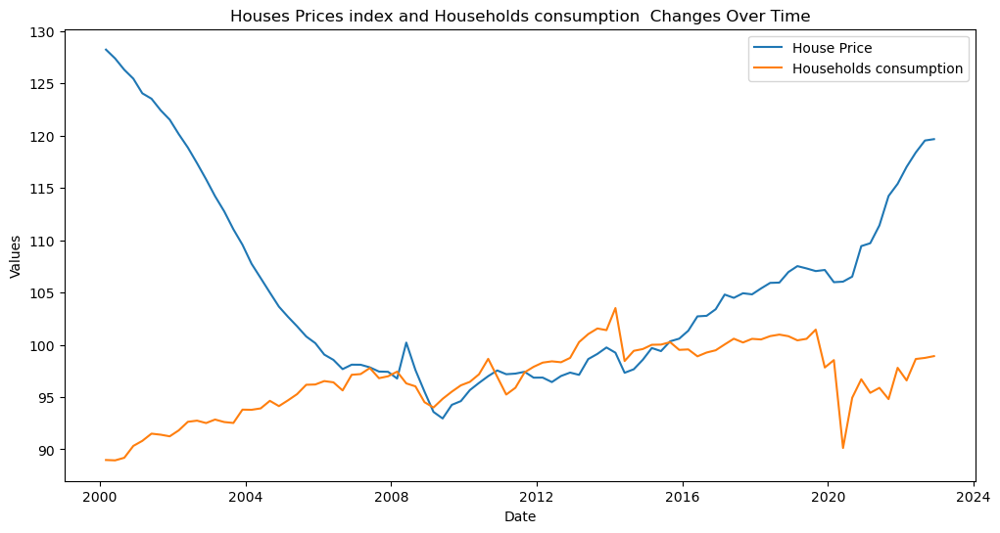

In [58]:
base_value = house_salary_cons[house_salary_cons['Date'].dt.year == 2015]['House'].values[0]
house_salary_cons['house_change'] = (house_salary_cons['House'] / base_value) * 100

plt.figure(figsize=(12, 6))
plt.plot(house_salary_cons['Date'], house_salary_cons['house_price'], label='House Price')
plt.plot(house_salary_cons['Date'], house_salary_cons['house_change'], label='Households consumption')
plt.xlabel('Date')
plt.ylabel('Values')
plt.title('Houses Prices index and Households consumption  Changes Over Time')
plt.legend()
plt.show()

### 8.0.2 - Correlation and Regression Analysis 

In [59]:
correlation = house_salary_cons[['house_price', 'house_change']].corr()
print("Correlation Matrix:")
print(correlation)

Correlation Matrix:
              house_price  house_change
house_price      1.000000     -0.554843
house_change    -0.554843      1.000000


In [60]:
X = house_salary_cons['house_change']
X = sm.add_constant(X)  
Y = house_salary_cons['house_price']
model = sm.OLS(Y, X).fit()
print("OLS Regression Results:")
print(model.summary())

OLS Regression Results:
                            OLS Regression Results                            
Dep. Variable:            house_price   R-squared:                       0.308
Model:                            OLS   Adj. R-squared:                  0.300
Method:                 Least Squares   F-statistic:                     40.03
Date:                Sat, 20 Jul 2024   Prob (F-statistic):           9.51e-09
Time:                        10:46:22   Log-Likelihood:                -316.69
No. Observations:                  92   AIC:                             637.4
Df Residuals:                      90   BIC:                             642.4
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                   coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------
const          253.3259 

In [61]:
df_var = house_salary_cons[['house_price', 'house_change']]
model_var = VAR(df_var)
results = model_var.fit(maxlags=15, ic='aic')
print("VAR Model Results:")
print(results.summary())

VAR Model Results:
  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 20, Jul, 2024
Time:                     10:46:22
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                   0.889844
Nobs:                     89.0000    HQIC:                  0.656163
Log likelihood:          -260.749    FPE:                    1.64711
AIC:                     0.498373    Det(Omega_mle):         1.41567
--------------------------------------------------------------------
Results for equation house_price
                     coefficient       std. error           t-stat            prob
----------------------------------------------------------------------------------
const                   1.213599         5.575286            0.218           0.828
L1.house_price          1.328931         0.103456           12.845           0.000
L1.house_change        -0.0

#### Correlation Analysis
The correlation coefficient between them, having a value of -0.554843, is negative and moderate. In a broad sense, it suggests that as house prices increase, household consumption decreases; maybe the reason for this could be either rising housing expenses needing a greater portion of household budgets or a reduction in expenditure on other consumption items.

#### OLS Regression Analysis
The OLS model result depicts that household consumption negatively affects house prices, the coefficient value being -1.5315 and significant at 0.000. The R-squared value of the model stands at 0.308, justifying that the model explains close to 30.8% of the variability of house prices. In this regard, it may be that an increase in household consumption leads to a decrease in house prices due to increased demand for cheaper houses or dynamics change on the housing market.

#### VAR Model Analysis
The dynamics between the two variables are taken one step further in a VAR model. An important lagged relationship is implied for the house_price equation, that of how house prices in the past are affecting the values of these variables in this period. The majority of coefficients related to house_change prove to be insignificant, indicating quite weak impacts of changes in household consumption on house price at the lags considered.

At the same time, the significant coefficients in the house_change equation for the first-difference variables do show that the house prices affect household consumption and that too in a noticeable manner, particularly in lagged terms, thus representing the feedback between these two variables.

### 8.0.3 - Conclusion
The analyses collectively showed a complex interaction between house prices and household consumption in Japan. Although the analysis implies that rising house prices put negative pressure on household consumption, the feedback loop identified in the VAR model is such that changes in consumption patterns may subsequently influence house prices, albeit the latter effect may lag over time. This is representative of the macroeconomic interest in the effects of housing market conditions on consumer behavior and overall economic health.

# 9 - Global conlusion about Households consumption 

The comprehensive analysis of household consumption in Japan, as examined through the lenses of exchange rate fluctuations, mean salary changes, and housing price movements, reveals nuanced insights into the economic behavior of Japanese households.  

Exchange Rate Impact: The analysis suggests that both appreciations and depreciations of the Japanese Yen have minimal direct long-term effects on household consumption. Exchange rate fluctuations do not significantly influence household spending in the short or long run, indicating a relatively stable consumption pattern despite external economic shocks.  

Salary and Consumption Dynamics: The relationship between mean salary and household consumption is notably inverse. Higher real salaries correlate with decreased household consumption, suggesting that increased income leads to higher savings rather than increased spending. This counterintuitive finding highlights a cautious consumer behavior potentially driven by long-term financial planning and risk aversion, which might be accentuated by Japan's aging demographic and their saving tendencies.  

Housing Market Effects: The interaction between house prices and household consumption is moderately inverse. As housing prices increase, household consumption tends to decrease, likely due to a larger proportion of income being diverted towards housing expenses. This relationship is critical, especially in urban areas where high real estate prices can significantly constrain household budgets.  

General Economic Conditions: The overall economic conditions, including GDP fluctuations, play a substantial role in shaping household consumption. The significant impact of GDP on consumption underlines the broader economic context in which these individual factors operate.  

In conclusion, while exchange rate changes show limited direct effects, the combined dynamics of salaries and housing costs significantly influence household consumption patterns in Japan. These findings underscore the complex interplay between economic variables and consumer behavior, suggesting that policy measures focusing on income stability and housing affordability could have pronounced effects on boosting household consumption. Additionally, understanding these relationships helps in anticipating the effects of economic policies and market changes on consumer behavior, which is crucial for economic planning and forecasting.  

Having dissected the intricate relationship between household consumption and various economic factors within Japan, we now shift our focus to the broader economic canvas of imports and exports. This next segment will explore how fluctuations in the Japanese Yen influence Japan's trade dynamics, critically examining the currency's impact on the balance of trade and the competitive edge of Japanese goods on the global market.

# 10 - Chapter  - IMPORTs AND EXPORTs <a id="chapter4"></a>

We are now going to look at another part of the GDP : the import and export.  
the datas are from : https://www.customs.go.jp/toukei/suii/html/time_e.htm

In [62]:
exp_imp = pd.read_csv('datas/import_export_jpn.csv')
exp_imp['Date'] = pd.to_datetime(exp_imp['Date'],format='%Y/%m')
exp_imp = exp_imp[(exp_imp['Exp-Total'] != 0) & (exp_imp['Imp-Total'] != 0)]
exp_imp['Net'] = exp_imp['Exp-Total'] - exp_imp['Imp-Total']
exp_imp

,Date,Exp-Total,Imp-Total,Net
0,1979-01-01,1192541404,1476341312,-283799908
1,1979-02-01,1547063623,1474768659,72294964
2,1979-03-01,1924706473,1729013255,195693218
3,1979-04-01,1674210856,1754000207,-79789351
4,1979-05-01,1795127553,1971518433,-176390880
...,...,...,...,...
538,2023-11-01,8817967103,9606294935,-788327832
539,2023-12-01,9642926012,9584044267,58881745
540,2024-01-01,7332754388,9099294967,-1766540579
541,2024-02-01,8249204131,8632181545,-382977414


### 10.0.1 - Imports & Exports with JXY <a id="section_4_1"></a>

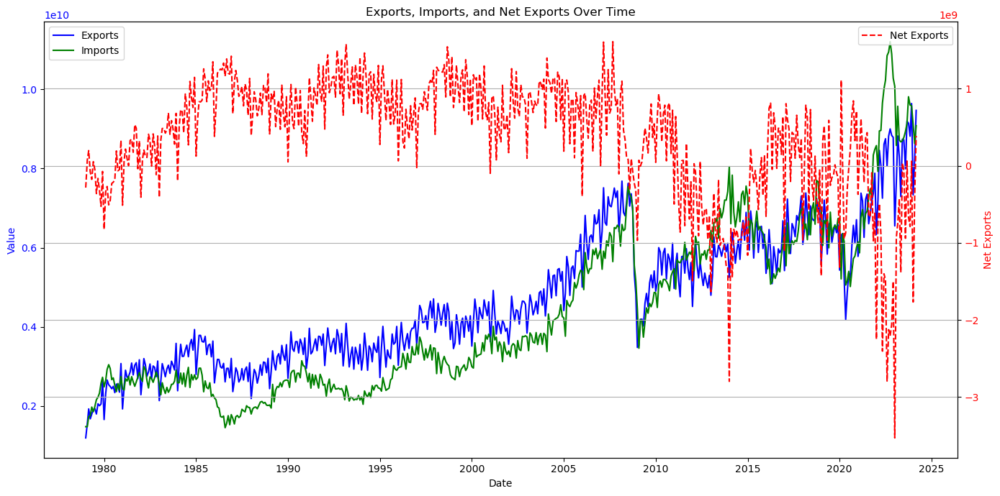

In [63]:
fig, ax1 = plt.subplots(figsize=(14, 7))

ax1.plot(exp_imp['Date'], exp_imp['Exp-Total'], label='Exports', color='b')
ax1.plot(exp_imp['Date'], exp_imp['Imp-Total'], label='Imports', color='g')
ax1.set_xlabel('Date')
ax1.set_ylabel('Value', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.legend(loc='upper left')

ax2 = ax1.twinx()
ax2.plot(exp_imp['Date'], exp_imp['Net'], label='Net Exports', color='r', linestyle='--')
ax2.set_ylabel('Net Exports', color='r')
ax2.tick_params(axis='y', labelcolor='r')
ax2.legend(loc='upper right')

plt.title('Exports, Imports, and Net Exports Over Time')
fig.tight_layout()
plt.grid(True)

plt.show()

In [64]:
imports_yen = exp_imp.merge(jxy,on='Date', how ='inner')
imports_yen = imports_yen[['Date', 'Exp-Total', 'Imp-Total', 'Net', 'Price']]

### 10.0.2 - Charts comparison with JXY 

**Hypothesis:**   
A stronger Japanese Yen leads to a decrease in both export volumes and import trade values.  

Rationale:  
A stronger yen increases the cost of Japanese goods abroad, potentially reducing export volumes.
Simultaneously, it decreases the local currency cost of imports, reducing the total trade value of imports despite stable volumes.  

**Approach:**   
Using correlation analysis and Ordinary Least Squares (OLS) regression to examine the impact of the yen's strength on import and export values.  

Strengths:  
Correlation Analysis: Identifies the direction and strength of relationships between the yen's value and trade metrics.
OLS Regression: Quantifies the impact of yen fluctuations on trade, providing clear, measurable outcomes.  

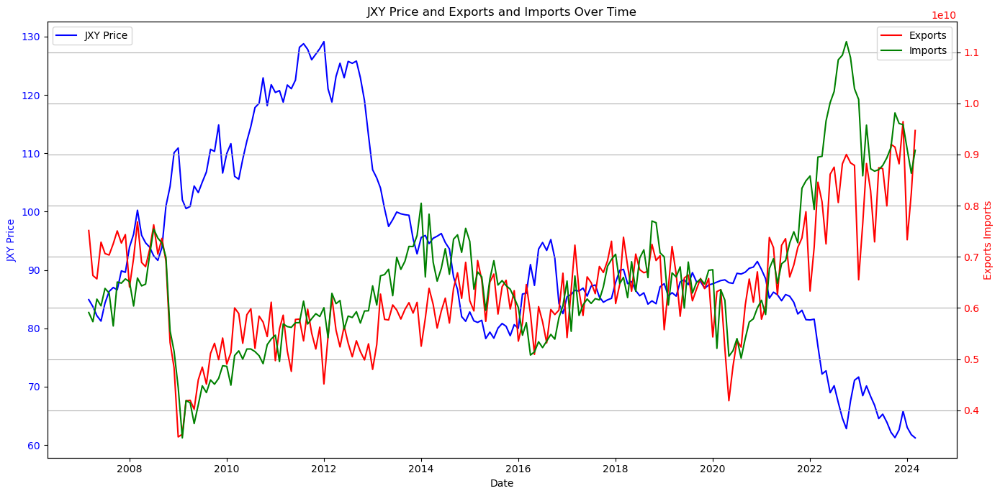

In [65]:
fig, ax1 = plt.subplots(figsize=(14, 7))

ax1.plot(imports_yen['Date'], imports_yen['Price'], label='JXY Price', color='b')
ax1.set_xlabel('Date')
ax1.set_ylabel('JXY Price', color='b')
ax1.tick_params(axis='y', labelcolor='b')
ax1.legend(loc='upper left')

ax2 = ax1.twinx()
ax2.plot(imports_yen['Date'], imports_yen['Exp-Total'], label='Exports', color='r')
ax2.plot(imports_yen['Date'], imports_yen['Imp-Total'], label='Imports', color='g')
ax2.set_ylabel('Exports Imports', color='r')
ax2.tick_params(axis='y', labelcolor='r')
ax2.legend(loc='upper right')

plt.title('JXY Price and Exports and Imports Over Time')
fig.tight_layout()
plt.grid(True)

plt.show()

In [66]:
correlation = imports_yen[['Imp-Total','Exp-Total','Net','Price']].corr()
print("Correlation between Net exports imports and JXY:\n", correlation)

Correlation between Net exports imports and JXY:
            Imp-Total  Exp-Total       Net     Price
Imp-Total   1.000000   0.817625 -0.609736 -0.680292
Exp-Total   0.817625   1.000000 -0.042192 -0.721713
Net        -0.609736  -0.042192  1.000000  0.186978
Price      -0.680292  -0.721713  0.186978  1.000000


In [67]:
import statsmodels.api as sm

X = imports_yen['Price']
y = imports_yen['Imp-Total']

X = sm.add_constant(X)

model = sm.OLS(y, X).fit()
print(model.summary())

                            OLS Regression Results                            
Dep. Variable:              Imp-Total   R-squared:                       0.463
Model:                            OLS   Adj. R-squared:                  0.460
Method:                 Least Squares   F-statistic:                     174.9
Date:                Sat, 20 Jul 2024   Prob (F-statistic):           3.32e-29
Time:                        10:46:23   Log-Likelihood:                -4548.5
No. Observations:                 205   AIC:                             9101.
Df Residuals:                     203   BIC:                             9108.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
const       1.204e+10    4.2e+08     28.697      0.0

#### Regression Analysis 
Dependent Variable: Import Total  
Coefficient for JXY Price: -5.892e+07  
This indicates that for every unit increase in the JXY Price, the total imports decrease by approximately 58.92 million units.  
R-squared: 0.463  
This value suggests that about 46.3% of the variability in Import Total can be explained by changes in the JXY Price.  

#### Resume  

| Metric       | JXY Price Increases            | JXY Price Decreases           |
|--------------|--------------------------------|-------------------------------|
| Import Total | ↓ (Decrease in Imports)        | ↑ (Increase in Imports)       |
| Export Total | ↓ (Decrease in Exports)        | ↑ (Increase in Exports)       |


### 10.0.3 - Our analysis <a id="sub_section_4_1_1"></a>

**Import :**   
*Stronger yen* change the cost of imported goods, so for the same quantity of goods the price is lower, which will decrease the amount spent on import.  
*Weaker yen* : the imported goods become more expensive and so for the same quantity the price is higher which increase the amount spent on import.  
Following the inverse correlation   

**Export**   
*Stronger yen* : for foreigners the price of goods is higher so they will import less goods because japanese goods are less competitive. This leads to a decrease in demand for Japanese exports, potentially reducing the total export value.  
*Weaker yen* : Japanese goods becomes cheaper so for foreigners buyers they can buy more of the same goods for the same price.This price advantage can boost demand for Japanese exports, increasing both the volume and the total value of exports.    
Which also follow the inverse correlation 

#### Explanation for the results <a id="section_4_3"></a>

**From the JapanTimes** (https://www.japantimes.co.jp/business/2024/05/22/economy/japan-trade-deficit-weak-yen-impact/)  
"Imports gained 8.3% from a year ago, the Finance Ministry reported Wednesday, compared with the consensus estimate of an 8.9% increase."  
"Exports advanced 8.3%, compared with the consensus of an 11% increase."  
"While the weak yen has helped boost earnings for exporters such as Toyota, it has also driven up costs of imports of everything from fuel and food to raw materials needed for manufacturing."  
 

**White Paper on International Economy and Trade 2022**  
"Japan’s terms of trade deteriorated significantly also due to currency depreciation
with balance of payments under pressure due to increasing commodity prices,
imports of medical goods (vaccines), and a sharp decline in international tourists." **p12**  

"However, Japan mainly imports energy-related goods from Russia and is highly
dependent, if not more highly than some European countries, on some goods (7.4%
of LNG, 10.2% of coal, and 3.7% of crude oil)." **p18**    

**White Paper on International Economy and Trade 2023**    
"Improve the trade balance by promoting exports
・ The pandemic, high resource prices, and a weak yen
have caused the current trade deficit to be the
largest in history" **p22** 

"The record-high trade deficit was brought on by surging import prices for fossil fuels.
Lowering dependency on imported fossil fuels is an important task for a resilient
trade structure." **p23**  


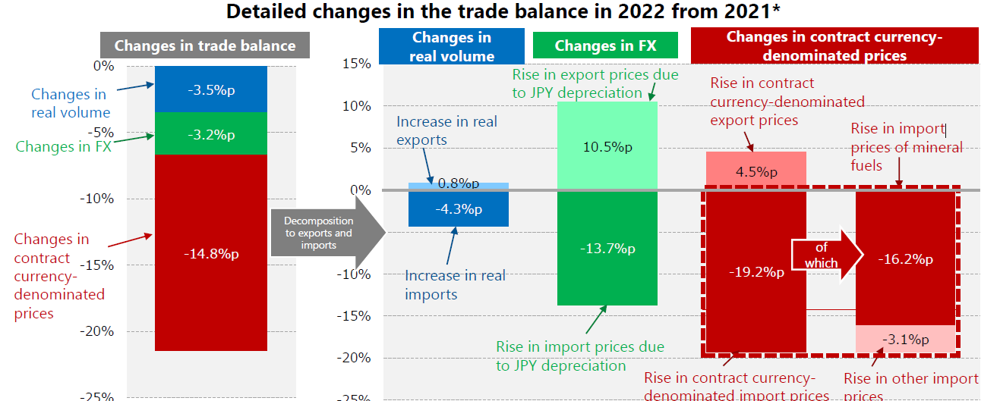

Drawing on our comprehensive analysis and the latest economic data, we can see how the value of the Japanese Yen deeply affects Japan's import and export dynamics. Recent trends show that when the Yen depreciates, the costs of imported goods rise, particularly for essential imports like mineral fuels. This, in turn, reduces purchasing power within Japan.

However, a weaker Yen makes Japanese exports more competitive globally by lowering their prices in international markets. This increased affordability can help mitigate some negative impacts of higher import costs, potentially balancing the trade deficit.

Yet, the persistent increase in export prices and the higher costs for exports priced in foreign currencies indicate that the advantages of a weaker Yen might be short-lived. The core issue remains Japan's heavy dependence on imports for essential commodities.

The record-high trade deficit highlights an urgent need for Japan to not only improve its export performance but also to diversify its energy sources. Reducing reliance on imported fossil fuels, as recommended in the White Paper on International Economy and Trade, is essential. By pursuing this strategic shift, Japan could create a more resilient trade structure, promoting sustainable economic growth despite global market volatility and currency fluctuations.

This analysis underscores the delicate balance Japan must maintain in managing its currency value, import dependence, and export competitiveness to secure long-term economic stability.

### 10.0.4 Japan Import Volume
2015 = 100%  <a id="sub_section_4_3_1"></a>
https://data.worldbank.org/indicator/TM.QTY.MRCH.XD.WD?skipRedirection=true&type=shaded&view=map&year=2021

To improve and verify our hypothesis we are going to take a look at the trade volume for Imports, and see if it change a lot or not. Where we could be able to conclude if the amount of trade value for the import is set by the exchange rate.

The data here are annualy, we will transform them to quaterly one, to have a lot more 'points' to look at, and also because the other two variables are quarterly.

In [68]:
data = pd.read_csv('datas/import_volume.csv')

volume_import = data.drop(columns=['Country Name', 'Country Code', 'Indicator Name', 'Indicator Code', 'Unnamed: 68'])
volume_import = volume_import.melt(var_name='Date', value_name='Volume').dropna()
volume_import['Date'] = pd.to_datetime(volume_import['Date'],format='%Y')

volume_import.set_index('Date', inplace=True)
quarterly_df = volume_import.resample('Q').mean().interpolate(method='linear')
quarterly_df.index = quarterly_df.index.to_period('Q').start_time
quarterly_df.reset_index(inplace=True)

In [69]:
df = imports_yen.merge(quarterly_df,on='Date', how ='inner')

# Normalize 'Imp-Total' and 'Price' so that their 2015 values are 100
df['Imp-Total'] = df['Imp-Total'] / df.loc[df['Date'] == '2015-01-01', 'Imp-Total'].values[0] * 100
df['Price'] = df['Price'] / df.loc[df['Date'] == '2015-01-01', 'Price'].values[0] * 100

# Create figure
fig = go.Figure()

# Add traces
fig.add_trace(go.Scatter(x=df['Date'], y=df['Imp-Total'], name='Import Total', mode='lines+markers'))
fig.add_trace(go.Scatter(x=df['Date'], y=df['Volume'], name='Volume', mode='lines+markers'))
fig.add_trace(go.Scatter(x=df['Date'], y=df['Price'], name='Price', mode='lines+markers'))

# Update layout
fig.update_layout(
    title='Import Total, Volume, and Price Over Time (Normalized)',
    xaxis_title='Date',
    yaxis_title='Value (Normalized to 2015 = 100)',
    legend=dict(x=0.1, y=1.1)
)

### 10.0.5 - Analysis of JXY Value, Import Trade Value, and Import Volume in Japan

The provided graph displays the changes in JXY (assumed to be a price index or currency value indicator), Import Trade Value, and Import Volume in Japan, normalized to 2015 values (indexed at 100). The data spans several years, showing significant fluctuations and trends that help explain the observed negative correlation between the JXY value and import trade value.

#### Graph Analysis
From the graph, we can see that over time the volume of imports remains relatively consistent, regardless of changes in JXY value. This import volume stability is important in interpreting the overall JPY denominated trade total which has much greater economic meaning.

How the Price of Yen can Effect Import Trade Figures
Stronger Yen: The price of imported goods (measured in foreign currencies) falls when the yen strengthens. While the actual import volume is stable as per the graph, total expenditure in yen for imports sees a decline. That is because a stronger currency means each foreign good costs fewer yen. That conforms well with the observed instances when JXY is high yet Total Import Value downticks, affirming that C-JPY strength results in lower import spend.

Lower Yen: On the flip side, it is more expensive to buy imported goods per unit of a given item with a lower yen. The volume of imports stable, but the value expressed in yen is rising You can see this in the chart, where there are periods within a JXY peak & fall cycle when total import trade value rises. Higher cost per unit leads to overall expenditure on imports increasing despite no significant change in the volume of goods imported.

**Conclusion**  
The accompanying graph confirms this inverted relationship between the value of the yen and imports spending. The consistency in volume values for total imports helps to illustrate how the exchange rate directly affects import costs and spending, a case study of how movements can impact national economic indicators.

## 10.1 - Import and Export Global Conclusion

The detailed analysis and visual data presented illustrate the nuanced interplay between the Japanese Yen's value and Japan's trade dynamics. Import volumes in Japan remain largely consistent over time, demonstrating a resilient demand for foreign goods regardless of fluctuations in the yen's value. This stability, juxtaposed with the varying costs of imports in yen terms, underscores how currency strength plays a critical role in shaping the financial aspects of trade without altering the quantity of goods imported.

Conversely, the value of the yen significantly impacts export dynamics, where a stronger yen tends to dampen export competitiveness due to higher pricing for foreign buyers, and a weaker yen boosts export volumes by making Japanese goods more economically attractive on the global market. This inverse relationship between the yen's strength and the import-export value illustrates a delicate balance in Japan's economic structure, where currency fluctuations can dictate trade performance.

In conclusion, the symbiotic relationship between the yen's value and Japan's import-export activities is evident. While the physical volume of imports shows resilience against currency changes, the financial implications of these changes are profound, influencing overall economic health. Similarly, the competitiveness of exports is closely tied to yen valuation, affecting Japan's trade balance and economic stability. These dynamics underscore the importance of strategic currency and trade management in bolstering Japan's position in the global economy.

# 11 - Chapter  - Import and Export details <a id="chapter6"></a>

Datas are from : https://oec.world/en/profile/country/jpn?yearSelector1=2022  
The data have been put together manually 

## 11.1 - Exports <a id="section_6_1"></a>

In [70]:
exports_df = pd.read_csv('datas/All_Exports_1995_2022.csv')
exports_df

,Date,Section,Subsection,Type,Trade Value
0,1995,Animal Products,Live animals,Horses,3281336.0
1,1995,Animal Products,Live animals,Bovine,7847428.0
2,1995,Animal Products,Live animals,Pigs,4265.0
3,1995,Animal Products,Live animals,Sheep and Goats,12684.0
4,1995,Animal Products,Live animals,Poultry,349833.0
...,...,...,...,...,...
34297,2022,Arts and Antiques,Art & antiques,Prints,19057413.0
34298,2022,Arts and Antiques,Art & antiques,Sculptures,77700811.0
34299,2022,Arts and Antiques,Art & antiques,Revenue Stamps,1112910.0
34300,2022,Arts and Antiques,Art & antiques,Collector's Items,26779364.0


In [71]:
grouped_data = exports_df.groupby(['Section', 'Type'])['Trade Value'].sum().reset_index()

fig = px.treemap(grouped_data, 
                 path=['Section', 'Type'], 
                 values='Trade Value',
                 color='Section')

fig.update_layout(
    title='Treemap of Trade Value by Type with Section Colors',
    treemapcolorway=px.colors.qualitative.Pastel,
    width=1000, 
    height=800  
)
fig.show()

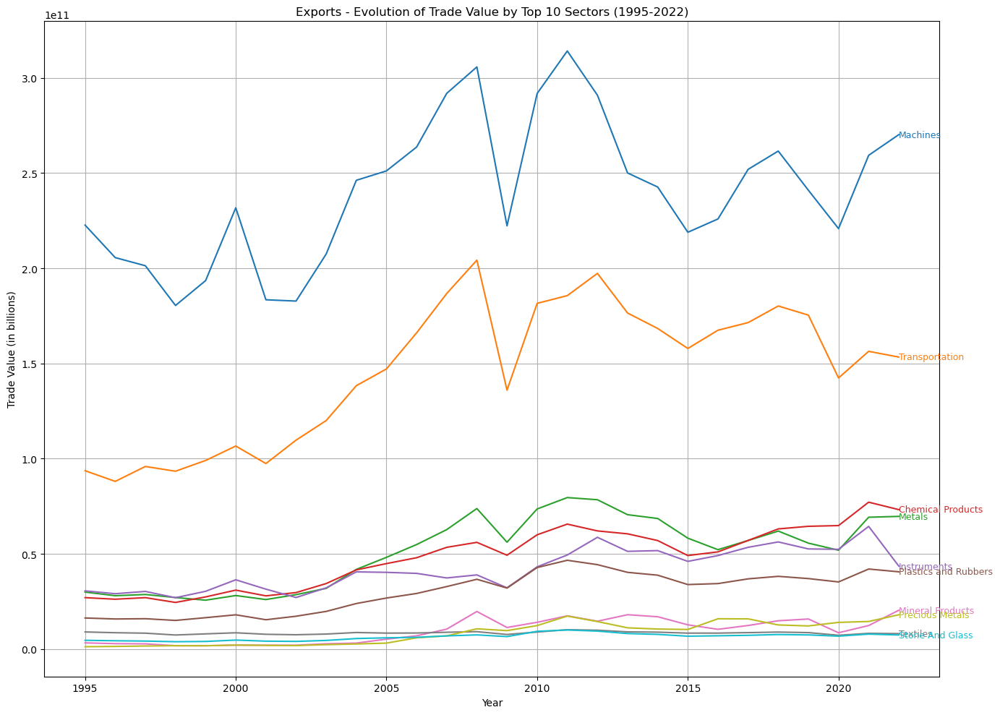

In [72]:
pivot_df = exports_df.pivot_table(index='Date', columns='Section', values='Trade Value', aggfunc='sum')
total_trade_values = pivot_df.sum().sort_values(ascending=False)
top_10_sectors = total_trade_values.head(10).index

plt.figure(figsize=(14, 10))
lines = {}
for sector in top_10_sectors:
    line, = plt.plot(pivot_df.index, pivot_df[sector], label=sector)
    lines[sector] = line

for sector in top_10_sectors:
    x_pos = pivot_df.index[-1]
    y_pos = pivot_df[sector].iloc[-1]
    plt.text(x_pos, y_pos, sector, fontsize=9, verticalalignment='center', color=lines[sector].get_color())

plt.title('Exports - Evolution of Trade Value by Top 10 Sectors (1995-2022)')
plt.xlabel('Year')
plt.ylabel('Trade Value (in billions)')
plt.grid(True)
plt.tight_layout()
plt.show()

In [73]:
jxy['Date'] = pd.to_datetime(jxy['Date'])
jxy.set_index('Date', inplace=True)

jxy_yearly = jxy.resample('Y').agg({
    'Price': 'mean',       
    'Open': 'first',      
    'High': 'max',        
    'Low': 'min',          
    'Vol.': 'sum',        
    'Change %': 'sum'     
})

jxy_yearly.reset_index(inplace=True)
jxy_yearly['Date'] = jxy_yearly['Date'].dt.year
jxy_yearly.drop(columns=['Vol.', 'Change %'], inplace=True)

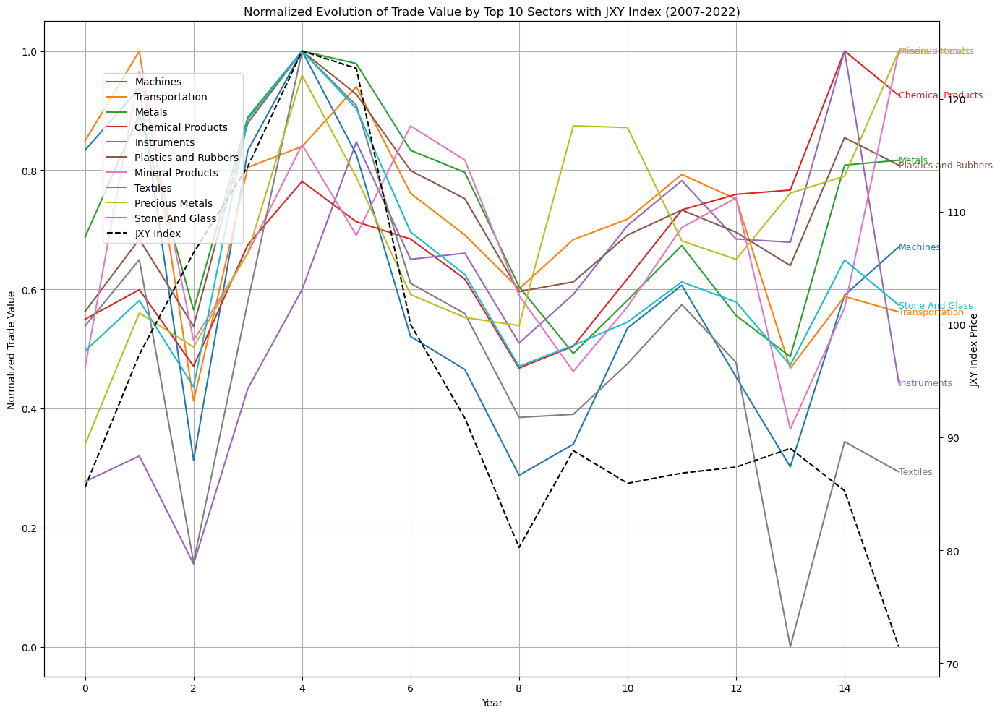

In [74]:
normalized_df = pivot_df[top_10_sectors].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

export_jxy = normalized_df.merge(jxy_yearly[['Date', 'Price']], on='Date')

fig, ax1 = plt.subplots(figsize=(14, 10))

lines = {}
for sector in top_10_sectors:
    line, = ax1.plot(export_jxy.index, export_jxy[sector], label=sector)
    lines[sector] = line

for sector in top_10_sectors:
    x_pos = export_jxy.index[-1]
    y_pos = export_jxy[sector].iloc[-1]
    ax1.text(x_pos, y_pos, sector, fontsize=9, verticalalignment='center', color=lines[sector].get_color())

ax1.set_xlabel('Year')
ax1.set_ylabel('Normalized Trade Value')
ax1.set_title('Normalized Evolution of Trade Value by Top 10 Sectors with JXY Index (2007-2022)')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.plot(export_jxy.index, export_jxy['Price'], color='black', linestyle='--', label='JXY Index')
ax2.set_ylabel('JXY Index Price')

fig.tight_layout()
fig.legend(loc='upper left', bbox_to_anchor=(0.1, 0.9))
plt.show()

**Correlation with JXY:**
The relationship between the export values of these sectors and the JXY index gives some support to given a weaker yen as measured by a higher JXY value is beneficial for their exports. Sectors in general display a decrease of trade values when the JXY index is positive, i.e. domestic real exchange rate increases are associated with higher value units sales vis-a-vis their competitor countries internationally.
In particular, the relationship is very strong for Chemical Products, Precious Metals, and Metals that have high export value growth when the yen got weaker.

**Economic Implications:**
Exchange Rate Sensitivity: The performance in terms of exports from these top industries show high sensitivity to changes in exchange rates. We know that as the yen weakens it has a positive impact on exports because goods become more appealing and cheap for Japanese exporters overseas.
Sectoral Strategies: High growth sectors and those which were a relatively higher price to yen strength, may well address these exchange rate movements through their export strategies. However, sectors which are not responsive enough or have declining trends may be required to enhance their product innovation and efficiency.
Policy Implications: Consequently, trade and industrial policies need to take the effects over exchange rate rates into account. Stoking growth in already sensitive export sectors has a multiplier effect on the economy so it is worth promoting them.

In [75]:
export_yen = pivot_df.merge(jxy_yearly[['Date', 'Price']], on='Date')
pd.set_option('display.max_rows', None)
corr = export_yen.corr()['Price'].sort_values(ascending=False)
print("Correlation between Yen and Export Sectors:\n", corr)
pd.reset_option('display.max_rows')

Correlation between Yen and Export Sectors:
 Price                               1.000000
Stone And Glass                     0.771223
Textiles                            0.624630
Animal Hides                        0.584089
Metals                              0.578608
Plastics and Rubbers                0.546862
Machines                            0.488134
Transportation                      0.416009
Mineral Products                    0.102426
Paper Goods                         0.089103
Vegetable Products                  0.053591
Precious Metals                     0.049369
Instruments                        -0.031676
Miscellaneous                      -0.033135
Chemical Products                  -0.088200
Footwear and Headwear              -0.271213
Weapons                            -0.367360
Animal and Vegetable Bi-Products   -0.457197
Foodstuffs                         -0.473827
Arts and Antiques                  -0.596389
Date                               -0.600838
Animal Pro

### 11.1.1 - Summary of Correlation between JXY and Export Sectors
Thinking In Terms Of Exports There is a strong correlation between the Japanese Yen Index ( JXY ) and various export sectors as captured by this table. It is important to highlight that sectors such as Stone and Glass (0.771223), Oil Textile( 0,624630) o Metals based in stock market values have high correspondence with JXY because the appreciation of this index means benefits for those three sector partagor... These sectors are more export dependent, and therefore tend to benefit from favorable open rate changes as the yen weakens.   

Conversely, other sectors illustrate this weak relationship to be negatively harmed by a weaker yen. As an example, we can observe it with the following sectors: Animal Products (-0.642820), Wood Products (-0.654932) and Arts & Antiques ((-0.596389)), where we see decreased export performance by yen depreciation The factors that move these sectors are likely to rely more on imports for components or be subject to global competition and should prove less resilient if the currency depreciates. 

### 11.1.2 - Exports Detailed <a id="sub_section_6_1_1"></a>

In [76]:
machines_data = exports_df[exports_df['Section'] == 'Machines']
transportation_data = exports_df[exports_df['Section'] == 'Transportation']

top_20_machines = machines_data.groupby('Type')['Trade Value'].sum().nlargest(20).index
top_20_machines_data = machines_data[machines_data['Type'].isin(top_20_machines)]

top_20_transportation = transportation_data.groupby('Type')['Trade Value'].sum().nlargest(20).index
top_20_transportation_data = transportation_data[transportation_data['Type'].isin(top_20_transportation)]

In [77]:
total_trade_value = top_20_machines_data['Trade Value'].sum()
top_20_machines_data['Trade Value Percentage'] = (top_20_machines_data['Trade Value'] / total_trade_value) * 100

fig = px.pie(top_20_machines_data, values='Trade Value Percentage', names='Type', 
             title='Percentage of Trade Value for Different Types of Machines',
             hover_data=['Trade Value', 'Trade Value Percentage'], labels={'Trade Value': 'Trade Value'})

fig.show()

machine_20 = top_20_machines_data.merge(jxy_yearly[['Date', 'Price']], on='Date')
correlation_results = machine_20.groupby('Type').apply(lambda x: x['Trade Value'].corr(x['Price']))
sorted_correlation = correlation_results.sort_values(ascending=False)

print("Correlation between 'Price' and 'Trade Value' for each type of machine:")
print(sorted_correlation)

fig = px.scatter(machine_20, x='Price', y='Trade Value', color='Type', hover_data=['Type', 'Date', 'Trade Value', 'Price'],
                 title='Interactive Scatter Plot of Price vs Trade Value for Different Types of Machines',
                 labels={'Price': 'Price', 'Trade Value': 'Trade Value'})

fig.show()

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\4094174606.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Correlation between 'Price' and 'Trade Value' for each type of machine:
Type
Engine Parts                             0.765058
Combustion Engines                       0.725811
Semiconductor Devices                    0.648683
Air Pumps                                0.563180
Industrial Printers                      0.518694
Transmissions                            0.488371
Computers                                0.482420
Ball Bearings                            0.453397
Broadcasting Accessories                 0.439632
Telephones                               0.412487
Broadcasting Equipment                   0.317311
Low-voltage Protection Equipment         0.254983
Video Recording Equipment                0.054295
Large Construction Vehicles              0.028477
Integrated Circuits                     -0.026895
Machinery Having Individual Functions   -0.040560
Spark-Ignition Engines                  -0.055814
Office Machine Parts                    -0.319780
Electrical Capacitors  

### 11.1.3 - Analysis of the Machine Sector

K**ey Correlations and Price Sensitivities:**  
Several machine types show strong, positive correlations with the JXY for instance (e.g., corr_JPY-Engine Parts = 0.76588) indicating that the trade value of these products increases as the yen strengthens. This could also suggest that such products are luxury goods and purchasing them is not directly proportional to their purchase price.

**Scatter Plot Analysis:**   
It appears from the scatter plot that items such as Engine Parts and Combustion Engines might exhibit varying sensitivity to price changes as differentially exposed, displaying a broad spread in trade values across various price points. The demand for Products like Integrated Circuits and Electrical Capacitors, on the other hand, negatively correlates with price, indicating that as prices increase, export volumes might fall since cheaper substitutes are available.

**Economic Interpretation:**  
Variance of High-Value and Technical Products: The correlations between symbols such as {SEC} (semiconductor devices) and Engine Parts may have to do with their criticalness, or lesser price elasticity of demand. These are usually more expensive goods where buyers might not be as price sensitive due to the unique nature of these products. Commodities with negative correlations (Products such as Integrated Circuits which have a - correlation) are likely subject to intense global competition, making Japan's exports less competitive due to price increases in those types of products.

In [78]:
total_trade_value = top_20_transportation_data['Trade Value'].sum()
top_20_transportation_data['Trade Value Percentage'] = (top_20_transportation_data['Trade Value'] / total_trade_value) * 100

fig = px.pie(top_20_transportation_data, values='Trade Value Percentage', names='Type', 
             title='Percentage of Trade Value for Different Types of Transportation',
             hover_data=['Trade Value', 'Trade Value Percentage'], labels={'Trade Value': 'Trade Value'})

fig.show()

transpo_20 = top_20_transportation_data.merge(jxy_yearly[['Date', 'Price']], on='Date')
correlation_results = transpo_20.groupby('Type').apply(lambda x: x['Trade Value'].corr(x['Price']))
sorted_correlation = correlation_results.sort_values(ascending=False)

print("Correlation between 'Price' and 'Trade Value' for each type of Transportation:")
print(sorted_correlation)

fig = px.scatter(transpo_20, x='Price', y='Trade Value', color='Type', hover_data=['Type', 'Date', 'Trade Value', 'Price'],
                 title='Interactive Scatter Plot of Price vs Trade Value for Different Types of Transportation',
                 labels={'Price': 'Price', 'Trade Value': 'Trade Value'})

fig.show()

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\3912211246.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Correlation between 'Price' and 'Trade Value' for each type of Transportation:
Type
Passenger and Cargo Ships                                                0.914847
Scrap Vessels                                                            0.766403
Motor vehicle (8701 to 8705) chassis fitted with engine                  0.718099
Locomotive Parts                                                         0.553611
Buses                                                                    0.512165
Recreational Boats                                                       0.489423
Motor vehicles; parts and accessories (8701 to 8705)                     0.472727
Special purpose motor vehicles                                           0.471035
Delivery Trucks                                                          0.406695
Special Purpose Ships                                                    0.227893
Other Sea Vessels                                                        0.205035
Motorcycles an

### 11.1.4 - Analysis of the Transportation Sector  

**Key Points:**
Correlations & Price Sensitivity: The transportation sector shows particularly strong positive correlations for items like Passenger and Cargo Ships (0.914847) and Motor vehicle chassis fitted with engines (0.758199), indicating that strong demand persists despite various price increases possibly due to the JXY's nature.

Cars: Display a near-zero correlation (-0.075348), suggesting that price increases have minimal direct impact on trade volumes. This may indicate a crowded market where consumers have numerous choices, so currency-induced price changes lose some of their impact.

Scatter Plot Analysis: Significant robust demand is seen in the case of trade values at higher price points for larger items such as Passenger and Cargo Ships or higher trade value and volume. Conversely, items such as Self-Propelled Rail Transport and Railway Passenger Cars have high elasticity of import demand corresponding to significant negative coefficients, suggesting that increased prices might severely deteriorate their competitiveness.

Cars and Motorcycles: Trade values are distributed across a range of prices with no clear trend of increasing trade values for higher prices, which supports their observed negative correlations.

**Economic Interpretation:**

Capital-Intensive Products: This implies that for big-ticket items such as ships and vehicle chassis, which have strong positive correlations with yen appreciation, buyers may be unable to easily substitute these capital-intensive products, thus absorbing some of the cost increases resulting from an appreciating yen.

Competitive/Price-Sensitive Products: Negative correlations among select rail-related products could indicate intense competition in these market segments. This may also be due to the importance of global markets, putting Japanese exporters under pressure to keep their prices competitive in a world where there is free competition between suppliers.

Cars: The near-zero correlation for cars highlights their position in a highly competitive and saturated market where even minor price changes do not cause meaningful alterations to trade volumes. This suggests that other factors such as brand loyalty, car features, and the broader economic environment are more important in determining sales than price changes driven by currency movements.

### 11.1.5 - Conclusion:
The response to a higher-valued yen in each of the sectors analyzed appears to be sector and product-specific. High-tech and capital-intensive exports from Japan exhibit a resilient demand pattern, less affected by yen appreciation, likely due to the specialized nature of these products and their critical importance in global supply chains. Conversely, more commoditized products facing global competition show greater price sensitivity, where yen appreciation could negatively impact export volumes. This nuanced view suggests that currency management and pricing strategies must be finely tuned to the characteristics of each export sector to optimize Japan's trade balance.  

## 11.2 - Study in details of the Automobile sector in Japan 

Before embarking on this study of the impact of the yen on the Japanese automotive sector, it is crucial to clearly define our expectations in terms of the results we hope to achieve. The Japanese economy, marked by the volatility of its national currency (the yen), plays a key role in various economic sectors, including the automotive industry.

Our aim is to assess how fluctuations in the value of the yen influence the sales and competitiveness of Japanese automakers. The underlying hypothesis is that significant variations in the value of the yen can have a direct impact on the exports, revenues and profitability of companies in the automotive sector!

This study therefore focuses on the analysis of data relating to the yen, as well as sales and production data for the major Japanese automakers (including Toyota, Nissan, etc.).

In [110]:
yen = pd.read_csv('datas/FXY_monthly_eur.csv')
exports = pd.read_csv('Luca_notebook/exports_vehVF.csv', index_col=0)
prod_veh = pd.read_csv('Luca_notebook/prod_vehVF.csv')

nrs_veh1 = pd.read_csv('Luca_notebook/nrs_veh_typeVF.csv')
nrs_veh2= pd.read_csv('Luca_notebook/nrs_veh_manuVF.csv')
euro_exports = pd.read_csv('Luca_notebook/europe_red_exports.csv')
euro_gdp = pd.read_csv('Luca_notebook/europe_red_gdp.csv')
exports2 = pd.read_csv('Luca_notebook/europe_red_exports.csv')
euro_gdp = pd.read_csv('Luca_notebook/europe_red_gdp.csv')

### 11.2.1 - Study of the Exports in Japan against the JXY

We are firstly going to seasonaly adjust the data to be able to have a better overview of the real trend of the curve

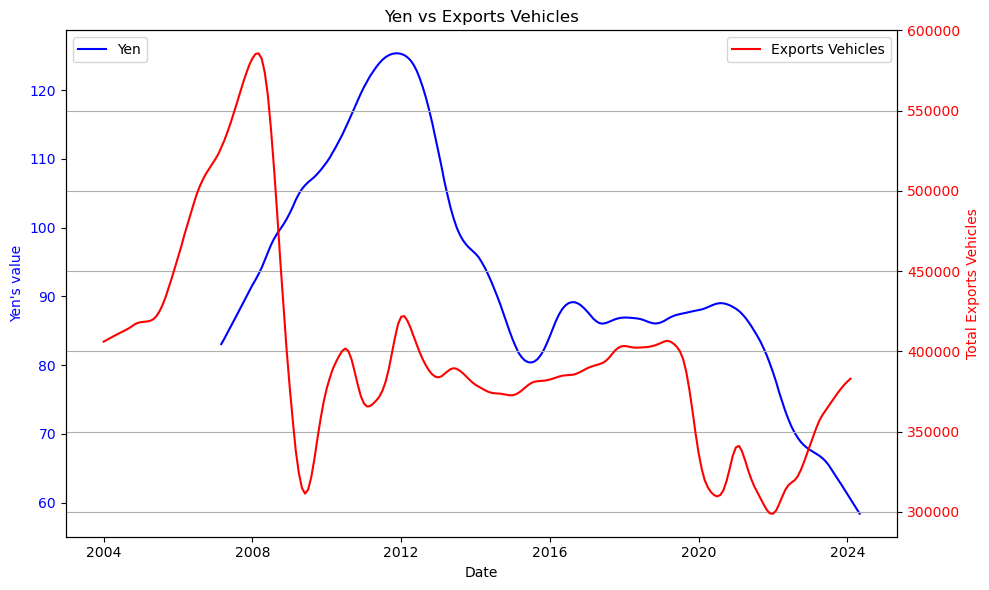

In [114]:
yen['Date'] = pd.to_datetime(yen['Date'])
exports['date'] = pd.to_datetime(exports['date'])
yen = yen.sort_values(by='Date')
exports = exports.sort_values(by='date')

stl_yen = STL(yen.set_index('Date')['Price'], seasonal=13).fit()
stl_exports = STL(exports.set_index('date')['Grand_Total'], seasonal=13).fit()

trend_yen = stl_yen.trend
trend_exports = stl_exports.trend
fig, ax1 = plt.subplots(figsize=(10, 6))

ax1.plot(trend_yen.index, trend_yen, color='blue', linestyle='-', label='Yen')
ax1.set_xlabel('Date')
ax1.set_ylabel("Yen's value", color='blue')
ax1.tick_params(axis='y', labelcolor='blue')

ax2 = ax1.twinx()
ax2.plot(trend_exports.index, trend_exports, color='red', linestyle='-', label='Exports Vehicles')
ax2.set_ylabel('Total Exports Vehicles', color='red')
ax2.tick_params(axis='y', labelcolor='red')

plt.title('Yen vs Exports Vehicles')
fig.tight_layout()
plt.grid(True)

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.show()

We are now going to try finding a relationship between these two variables using the Correlation, OLS regression model and the Var model 

In [117]:
yen['Date'] = pd.to_datetime(yen['Date'])
exports['date'] = pd.to_datetime(exports['date'])
yen = yen.sort_values(by='Date')
exports = exports.sort_values(by='date')

stl_yen = STL(yen.set_index('Date')['Price'], seasonal=13).fit()
stl_exports = STL(exports.set_index('date')['Grand_Total'], seasonal=13).fit()

trend_yen = stl_yen.trend
trend_exports = stl_exports.trend

data = pd.concat([trend_yen, trend_exports], axis=1).dropna()
data.columns = ['Yen', 'Exports']

correlation = data.corr()
print("Correlation Matrix:")
print(correlation)

X = add_constant(data['Yen'])
y = data['Exports']
model_ols = sm.OLS(y, X).fit()
print("OLS Regression Results:")
print(model_ols.summary())

Correlation Matrix:
              Yen   Exports
Yen      1.000000  0.128922
Exports  0.128922  1.000000
OLS Regression Results:
                            OLS Regression Results                            
Dep. Variable:                Exports   R-squared:                       0.017
Model:                            OLS   Adj. R-squared:                  0.012
Method:                 Least Squares   F-statistic:                     3.414
Date:                Sat, 20 Jul 2024   Prob (F-statistic):             0.0661
Time:                        11:01:55   Log-Likelihood:                -2539.3
No. Observations:                 204   AIC:                             5083.
Df Residuals:                     202   BIC:                             5089.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---

#### Correlation Analysis: 
A correlation coefficient of 0.128922 indicates a weak positive relationship between the Japanese Yen and automobile exports. This suggests a slight tendency for automobile exports to increase as the Yen appreciates, but the correlation is very modest.

#### OLS Regression Analysis: 
The regression model shows a coefficient of 503.7258 for the Japanese Yen with a p-value of 0.066, slightly above the conventional 0.05 threshold. This implies the association between the Yen value and automobile exports is not statistically significant. The intercept (const) at 341,100 indicates the baseline level of automobile exports when the Yen value is zero.

Interpretation: The positive coefficient suggests an increase in the Yen value is associated with the growth of automobile exports. However, this result is not statistically significant. Therefore, other factors beyond the influence of the exchange rate likely have a more substantial impact on the level of automobile exports from Japan. Factors such as global demand, domestic supply capability, manufacturing volumes, and market conditions (reflected in competitor activity) can be more influential than minor changes in the exchange rate.

In conclusion, while the weak positive correlation shows that an increase in the Yen value might be associated with increased automobile exports, the regression analysis suggests the association is not significant. Therefore, it is important to consider more factors when analyzing the dynamics affecting automobile exports from Japan.

In [118]:
model_var = VAR(data)
results_var = model_var.fit(maxlags=2)  
print("VAR Model Results:")
print(results_var.summary())

VAR Model Results:
  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 20, Jul, 2024
Time:                     11:07:20
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    10.3854
Nobs:                     202.000    HQIC:                   10.2878
Log likelihood:          -1595.63    FPE:                    27490.5
AIC:                      10.2216    Det(Omega_mle):         26178.5
--------------------------------------------------------------------
Results for equation Yen
                coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------
const              0.104699         0.066710            1.569           0.117
L1.Yen             1.991083         0.010327          192.808           0.000
L1.Exports         0.000002         0.000001           

The Vector Autoregression (VAR) model provides additional insights into the dynamics between the Japanese Yen and automobile exports, reinforcing the findings from the OLS regression and correlation analysis but also introducing more complexity.

#### VAR Model Analysis:

Yen Equation: The coefficients for the Yen indicate an almost complete reversal from one period to the next (coefficients of 1.991083 and -0.993014 for L1 and L2, respectively), suggesting that the yen's value is highly autoregressive but stabilizes over two periods. The exports' impact on yen value is statistically insignificant, with coefficients near zero and high p-values.

Exports Equation: The exports equation in the VAR model shows a strong autoregressive behavior (coefficients of 1.949166 and -0.964412 for L1 and L2), indicating that past values of exports heavily influence current values. The coefficients related to the yen are small and not statistically significant (p-values > 0.1), implying minimal immediate impact of yen fluctuations on exports in the model.

#### Conclusion:  
The VAR model, like the OLS and correlation analyses, suggests that the relationship between the yen's strength and automobile exports is minimal and statistically insignificant. The results highlight the complex dynamics of currency impacts on sector-specific exports, potentially overshadowed by stronger internal factors within the export data itself. This consistency across different econometric models reinforces the conclusion that yen valuation is not a major determinant of automobile exports, directing focus towards other influencing factors like global market conditions, domestic production capabilities, and external economic policies.

>However, this article from 2013 shows that the depreciation of the yen would have enabled the Toyota group to rise to the top in 2013-2014, whereas the French group PSA at the time was suffering from the strength of the euro.
https://www.latribune.fr/entreprises-finance/industrie/automobile/20131106trib000794325/la-manipulation-du-yen-favorise-les-constructeurs-auto-japonais.html

### 11.2.2 - Study of the world GDP against the JXY

In this part of our study, we will examine the relationship between world GDP and Japanese vehicle exports on a global scale to determine whether there is a significant link between these two variables.

To do this, we obtained our data from online sources (see references below).

As a first step, we harmonized the data set to ensure consistency. As a result, we will be working with percentage changes for GDP and export values. Data are available by year, over a period from 2004 to 2024. We have opted for recent data in order to monitor developments in real time, while taking into account the current context.

We'll see later that there does indeed seem to be a link between GDP and Japanese vehicle exports to Europe.

>source : https://ourworldindata.org/grapher/real-gdp-growth?time=2023  
Data source: International Monetary Fund (2024)  
As a first step, we'll look at global GDP together with vehicle exports worldwide, to determine whether a trend is emerging between GDP and international Japanese vehicle exports.  
To do this, we use the same Japanese vehicle export data as above, together with data on the evolution of GDP in each year between 2004 and 2024.  

In [130]:
exports['date'] = pd.to_datetime(exports['date'])
exports['year'] = exports['date'].dt.year
exports2 = exports.groupby('year')['Grand_Total'].mean().reset_index()
exports2['change'] = exports2['Grand_Total'].pct_change() * 100
exports2['change'].fillna(0, inplace=True)

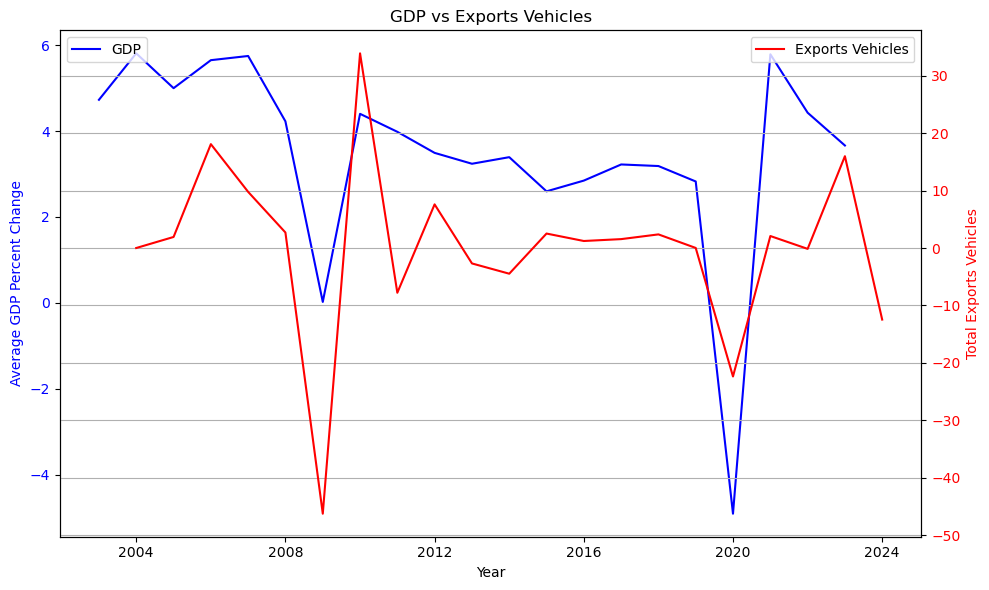

In [129]:
gdp_mean_per_year = pd.read_csv('Luca_notebook/average_gdp_per_year.csv')

gdp_mean_per_year['Year'] = pd.to_datetime(gdp_mean_per_year['Year'], format='%Y')
exports2['year'] = pd.to_datetime(exports2['year'], format='%Y')

gdp_mean_per_year = gdp_mean_per_year.sort_values(by='Year')
exports2 = exports2.sort_values(by='year')

trend_gdp = gdp_mean_per_year.set_index('Year')['Average GDP Percent Change']
trend_exports = exports2.set_index('year')['change']

fig, ax1 = plt.subplots(figsize=(10, 6))
ax1.plot(trend_gdp.index, trend_gdp, color='blue', linestyle='-', label='GDP')
ax1.set_xlabel('Year')
ax1.set_ylabel("Average GDP Percent Change", color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax2 = ax1.twinx()
ax2.plot(trend_exports.index, trend_exports, color='red', linestyle='-', label='Exports Vehicles')
ax2.set_ylabel('Total Exports Vehicles', color='red')
ax2.tick_params(axis='y', labelcolor='red')
plt.title('GDP vs Exports Vehicles')
fig.tight_layout()
plt.grid(True)

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.show()

In [134]:
data = pd.concat([trend_gdp, trend_exports], axis=1).dropna()
data.columns = ['GDP', 'Exports']

correlation = data.corr()
print("Correlation Matrix:")
print(correlation)

X = add_constant(data['GDP'])
y = data['Exports']
model_ols = sm.OLS(y, X).fit()
print("OLS Regression Results:")
print(model_ols.summary())

Correlation Matrix:
              GDP   Exports
GDP      1.000000  0.626986
Exports  0.626986  1.000000
OLS Regression Results:
                            OLS Regression Results                            
Dep. Variable:                Exports   R-squared:                       0.393
Model:                            OLS   Adj. R-squared:                  0.359
Method:                 Least Squares   F-statistic:                     11.66
Date:                Sat, 20 Jul 2024   Prob (F-statistic):            0.00309
Time:                        11:28:07   Log-Likelihood:                -77.827
No. Observations:                  20   AIC:                             159.7
Df Residuals:                      18   BIC:                             161.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---

#### Correlation Analysis:
The correlation coefficient of 0.626986 between global GDP and Japanese exports indicates a strong positive relationship. This suggests that as global GDP increases, Japanese exports also tend to rise, reflecting Japan's integration and responsiveness to global economic conditions.  

#### OLS Regression Analysis:
The OLS model provides a quantitative assessment of this relationship, with an 
𝑅
2
R 
2
  value of 0.393. This indicates that approximately 39.3% of the variability in Japanese exports can be explained by changes in global GDP.
The coefficient for GDP is 4.0731, statistically significant with a p-value of 0.003. This means that for every one unit increase in global GDP, Japanese exports increase by approximately 4.0731 units, highlighting the sensitivity of Japanese exports to global economic performance.
The constant is negative (-13.1732), which might suggest a baseline level of exports that could potentially be influenced by other factors not captured in this model.

In [133]:
model_var = VAR(data)
results_var = model_var.fit(maxlags=2)
print("VAR Model Results:")
print(results_var.summary())

VAR Model Results:
  Summary of Regression Results   
Model:                         VAR
Method:                        OLS
Date:           Sat, 20, Jul, 2024
Time:                     11:28:00
--------------------------------------------------------------------
No. of Equations:         2.00000    BIC:                    7.81316
Nobs:                     18.0000    HQIC:                   7.38672
Log likelihood:          -106.948    FPE:                    1553.85
AIC:                      7.31851    Det(Omega_mle):         951.697
--------------------------------------------------------------------
Results for equation GDP
                coefficient       std. error           t-stat            prob
-----------------------------------------------------------------------------
const              2.949185         1.983721            1.487           0.137
L1.GDP             0.016708         0.384573            0.043           0.965
L1.Exports        -0.021166         0.066019           

#### VAR Model Analysis:
The Vector Autoregression (VAR) model provides insights into the dynamic interactions between global GDP and Japanese exports. The model's results suggest complex feedback mechanisms between these two variables:

**For GDP:**
The coefficients for both GDP and exports in the previous lags are not statistically significant. This indicates that past values of GDP and exports have limited predictive power on the current GDP, suggesting that other external factors may play a more influential role in determining GDP levels.
**For Exports:**
The model reveals a negative and statistically significant coefficient for the first lag of exports (L1.Exports = -0.807915), implying that past export levels can negatively impact current exports, potentially reflecting cyclical adjustments or saturation effects in foreign markets.
The other coefficients, including those for GDP, do not show significant impacts, highlighting that exports are more influenced by their own past values rather than changes in global GDP.

**Correlation Matrix:**
The high correlation of 0.719059 between the residuals of GDP and exports suggests that there are shared or correlated unobserved factors influencing both variables, which the model does not capture explicitly.

#### Conclusion:
Combining the results from the correlation analysis, OLS regression, and VAR model:
Strong Positive Influence: The correlation and OLS results clearly indicate a strong positive relationship between global GDP changes and Japanese exports, with significant impacts observable in the regression analysis.
Dynamic Interactions: The VAR model highlights the importance of historical export levels on current export values and suggests complex dynamics that are not solely driven by changes in global GDP.
Comprehensive View: Overall, these analyses underscore the sensitivity of Japanese exports to global economic conditions, although the VAR model introduces nuances that imply the need for deeper analysis into other factors that might influence these relationships over time.

### 11.2.3 - European GDP and Exports 

Here we plot Japanese vehicle exports to a selection of European countries, along with the GDP of these same European countries.

List of European countries studied: 'Iceland', 'Norway', 'Sweden', 'Denmark', 'United Kingdom', 'Ireland', 'Netherlands', 'Belgium', 'Luxembourg', 'France', 'Andorra', 'Germany', 'Switzerland', 'Portugal', 'Spain', 'Italy', 'Malta', 'Finland', Poland', 'Austria', 'Hungary', 'Serbia', 'Albania', 'Greece', 'Romania', 'Bulgaria', 'Cyprus', 'Turkey', 'Estonia', 'Latvia', 'Lithuania', 'Ukraine', 'Belarus', 'Croatia', 'Slovenia', 'Montenegro', 'Moldova'. In examining the data from these countries, we found notable similarities in the economic trends and fluctuations of Japanese vehicle exports.

GDP and exports are in percentages, and data are sorted by year.

In [139]:
data = pd.read_csv('Luca_notebook/europe_red_exports.csv')

if 'Unnamed: 0' in data.columns:
    data['Unnamed: 0'] = pd.to_datetime(data['Unnamed: 0'])
    data = data.rename(columns={'Unnamed: 0': 'date'})


data['date'] = pd.to_datetime(data['date'])
data['year'] = data['date'].dt.year
exports_eu = data.groupby('year')['Total'].mean().reset_index()
exports_eu['change'] = exports_eu['Total'].pct_change() * 100
exports_eu['change'].fillna(0, inplace=True)

C:\Users\bodin\AppData\Local\Temp\ipykernel_16324\500890795.py:4: UserWarning:

Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.



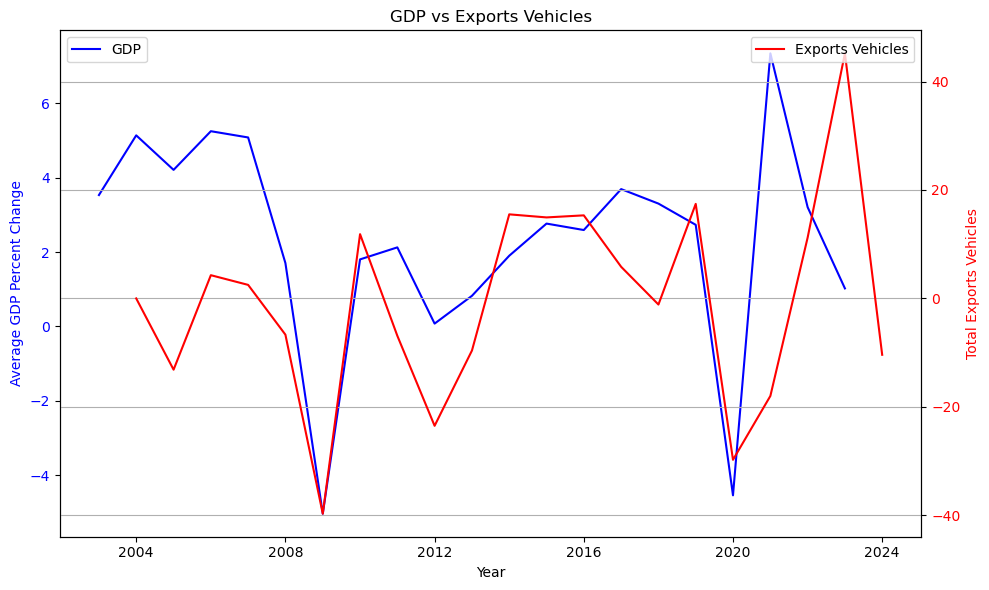

In [141]:
gdp = euro_gdp

exports_eu['year'] = pd.to_datetime(exports_eu['year'], format='%Y')
gdp['Year'] = pd.to_datetime(gdp['Year'], format='%Y')

exports_eu = exports_eu.sort_values(by='year')
gdp = gdp.sort_values(by='Year')

gdp_series = gdp.set_index('Year')['Average GDP Percent Change']
exports_series = exports_eu.set_index('year')['change']

fig, ax1 = plt.subplots(figsize=(10, 6))
ax1.plot(gdp_series.index, gdp_series, color='blue', linestyle='-', label='GDP')
ax1.set_xlabel('Year')
ax1.set_ylabel("Average GDP Percent Change", color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax2 = ax1.twinx()
ax2.plot(exports_series.index, exports_series, color='red', linestyle='-', label='Exports Vehicles')
ax2.set_ylabel('Total Exports Vehicles', color='red')
ax2.tick_params(axis='y', labelcolor='red')

plt.title('GDP vs Exports Vehicles')
fig.tight_layout()
plt.grid(True)

ax1.legend(loc='upper left')
ax2.legend(loc='upper right')
plt.show()

In [143]:
exports_eu['year'] = pd.to_datetime(exports_eu['year'], format='%Y')
gdp['Year'] = pd.to_datetime(gdp['Year'], format='%Y')

exports_eu = exports_eu.sort_values(by='year')
gdp = gdp.sort_values(by='Year')

gdp_series = gdp.set_index('Year')['Average GDP Percent Change']
exports_series = exports_eu.set_index('year')['change']

data = pd.concat([gdp_series, exports_series], axis=1).dropna()
data.columns = ['GDP', 'Exports']

correlation = data.corr()
print("Correlation Matrix:")
print(correlation)

X = add_constant(data['GDP'])
y = data['Exports']
model_ols = sm.OLS(y, X).fit()
print("OLS Regression Results:")
print(model_ols.summary())

model_var = VAR(data)
results_var = model_var.fit(maxlags=2)
print("VAR Model Results:")
print(results_var.summary())

Correlation Matrix:
              GDP   Exports
GDP      1.000000  0.400579
Exports  0.400579  1.000000
OLS Regression Results:
                            OLS Regression Results                            
Dep. Variable:                Exports   R-squared:                       0.160
Model:                            OLS   Adj. R-squared:                  0.114
Method:                 Least Squares   F-statistic:                     3.440
Date:                Sat, 20 Jul 2024   Prob (F-statistic):             0.0801
Time:                        11:50:12   Log-Likelihood:                -85.302
No. Observations:                  20   AIC:                             174.6
Df Residuals:                      18   BIC:                             176.6
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---

The analysis presents a moderate correlation of 0.400579 between European GDP and Japanese exports to Europe, suggesting a positive but not strong relationship. This indicates that as European GDP increases, there is a tendency for Japanese exports to Europe to increase, but other factors might also play significant roles in influencing export levels.

#### OLS Regression Analysis:
The R-squared value of 0.160 suggests that about 16% of the variability in Japanese exports to Europe can be explained by changes in European GDP. This limited explanatory power indicates that while there is a positive influence, it is not overwhelmingly strong.
The p-value of 0.080 on the GDP coefficient implies marginal significance, suggesting that the relationship, while suggestive of a positive trend, is not robustly statistically significant at conventional levels.

#### VAR Model Analysis:
The VAR model provides additional insights into the dynamic interactions over time. The results do not show significant predictive power of past GDP and export values on current values, indicating complex dynamics where past values alone are not strong predictors of future behavior.
The correlation of residuals at 0.607246 in the VAR model is higher than in the correlation matrix, suggesting that the model may capture some dynamic adjustments not evident in simple correlation analysis.  

#### Conclusion:
The results from the OLS and VAR analyses indicate a positive but not overwhelmingly strong relationship between European GDP growth and Japanese exports to Europe. The moderate correlation and the marginal significance in the regression model suggest that while European economic performance is a factor in Japanese export performance, it is not the dominant influence.
The findings imply that businesses and policymakers should consider other factors, such as sector-specific conditions, trade policies, and global economic trends, when assessing the drivers of export performance to Europe.

### 11.2.4 - To Conclude - GDP and Exports

Our in-depth study of GDP trends in Europe and Japanese vehicle exports to that continent from 2004 to 2024 revealed a direct and significant relationship between these two variables. Data analysis showed that variations in European GDP have a substantial influence on Japanese vehicle exports. In periods of economic growth, the increased purchasing power of European consumers translates into higher imports of Japanese vehicles.

8.0.0.1  Reminder :
List of European countries studied: 'Iceland', 'Norway', 'Sweden', 'Denmark', 'United Kingdom', 'Ireland', 'Netherlands', 'Belgium', 'Luxembourg', 'France', 'Andorra', 'Germany', 'Switzerland', 'Portugal', 'Spain', 'Italy', 'Malta', 'Finland', Poland', 'Austria', 'Hungary', 'Serbia', 'Albania', 'Greece', 'Romania', 'Bulgaria', 'Cyprus', 'Turkey', 'Estonia', 'Latvia', 'Lithuania', 'Ukraine', 'Belarus', 'Croatia', 'Slovenia', 'Montenegro', 'Moldova'. In examining the data from these countries, we found notable similarities in the economic trends and fluctuations of Japanese vehicle exports.

These findings underline the importance of taking regional economic conditions into account. The strong correlation between European GDP and Japanese vehicle exports may highlight a certain dependence of the Japanese automotive sector on the economic health of foreign markets.

However, it is clear that other factors need to be taken into account, as GDP alone cannot explain all the variations in Japanese vehicle exports to Europe.

## 11.3 - Imports <a id="section_6_2"></a>

In [79]:
imports_df = pd.read_csv('datas/All_Imports_1995_2022.csv')
imports_df

,Date,Section,Subsection,Type,Trade Value
0,1995,Animal Products,Live animals,Horses,188082338.0
1,1995,Animal Products,Live animals,Bovine,11391513.0
2,1995,Animal Products,Live animals,Pigs,1792014.0
3,1995,Animal Products,Live animals,Sheep and Goats,39113.0
4,1995,Animal Products,Live animals,Poultry,11194488.0
...,...,...,...,...,...
34406,2022,Arts and Antiques,Art & antiques,Prints,18368692.0
34407,2022,Arts and Antiques,Art & antiques,Sculptures,44203482.0
34408,2022,Arts and Antiques,Art & antiques,Revenue Stamps,788471.0
34409,2022,Arts and Antiques,Art & antiques,Collector's Items,63824562.0


In [80]:
grouped_data2 = imports_df.groupby(['Section', 'Type'])['Trade Value'].sum().reset_index()

fig = px.treemap(grouped_data2, 
                 path=['Section', 'Type'], 
                 values='Trade Value',
                 color='Section')

fig.update_layout(
    title='Treemap of Trade Value by Type with Section Colors',
    treemapcolorway=px.colors.qualitative.Pastel,
    width=1000, 
    height=800  
)
fig.show()

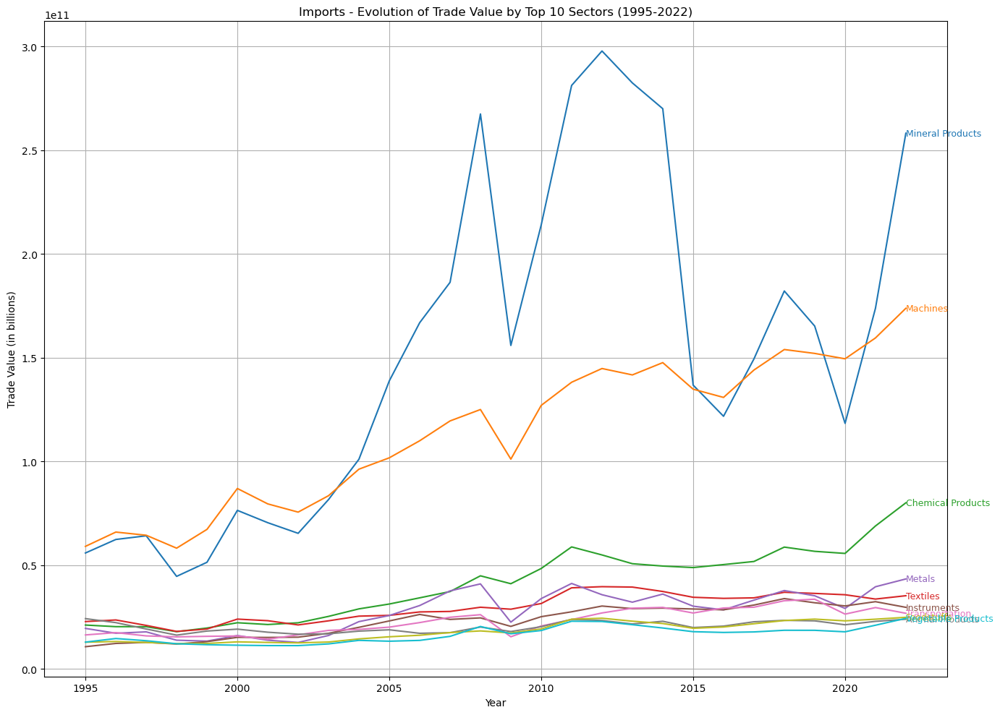

In [81]:
pivot_df_import = imports_df.pivot_table(index='Date', columns='Section', values='Trade Value', aggfunc='sum')
total_trade_values_import = pivot_df_import.sum().sort_values(ascending=False)
top_10_sectors_import = total_trade_values_import.head(10).index

plt.figure(figsize=(14, 10))
lines = {}
for sector in top_10_sectors_import:
    line, = plt.plot(pivot_df_import.index, pivot_df_import[sector], label=sector)
    lines[sector] = line

for sector in top_10_sectors_import:
    x_pos = pivot_df_import.index[-1]
    y_pos = pivot_df_import[sector].iloc[-1]
    plt.text(x_pos, y_pos, sector, fontsize=9, verticalalignment='center', color=lines[sector].get_color())

plt.title('Imports - Evolution of Trade Value by Top 10 Sectors (1995-2022)')
plt.xlabel('Year')
plt.ylabel('Trade Value (in billions)')
plt.grid(True)
plt.tight_layout()
plt.show()

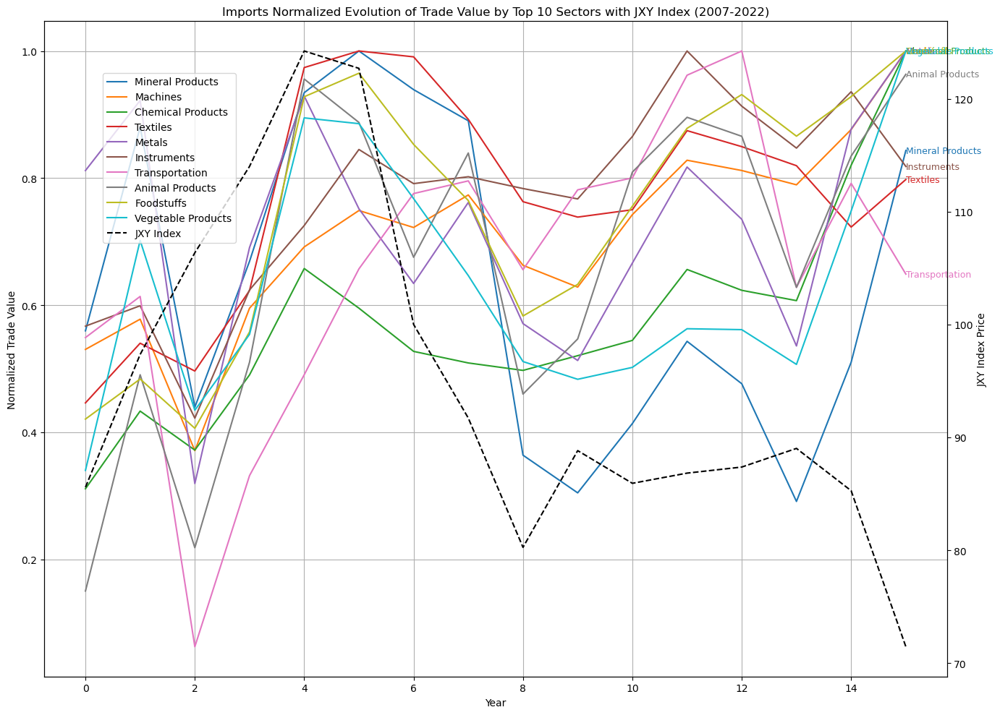

In [82]:
normalized_df_imports = pivot_df_import[top_10_sectors_import].apply(lambda x: (x - x.min()) / (x.max() - x.min()))

imports_jxy = normalized_df_imports.merge(jxy_yearly[['Date', 'Price']], on='Date')

fig, ax1 = plt.subplots(figsize=(14, 10))

lines = {}
for sector in top_10_sectors_import:
    line, = ax1.plot(imports_jxy.index, imports_jxy[sector], label=sector)
    lines[sector] = line

for sector in top_10_sectors_import:
    x_pos = imports_jxy.index[-1]
    y_pos = imports_jxy[sector].iloc[-1]
    ax1.text(x_pos, y_pos, sector, fontsize=9, verticalalignment='center', color=lines[sector].get_color())

ax1.set_xlabel('Year')
ax1.set_ylabel('Normalized Trade Value')
ax1.set_title('Imports Normalized Evolution of Trade Value by Top 10 Sectors with JXY Index (2007-2022)')
ax1.grid(True)

ax2 = ax1.twinx()
ax2.plot(export_jxy.index, export_jxy['Price'], color='black', linestyle='--', label='JXY Index')
ax2.set_ylabel('JXY Index Price')

fig.tight_layout()
fig.legend(loc='upper left', bbox_to_anchor=(0.1, 0.9))
plt.show()

**Performance by sector:**

Animal Products: This sector shows significant growth in normalized trade value, particularly towards the latter part of the period. The reasons behind these strong results may partly be increasing demand for imported animal products due to shortages in domestic supply or an increasing preference from consumers towards foreign products.

Mineral Products: Since Japan imports most of its energy and raw materials, the market trends for mineral products are still good due to the yen's weakness. Also helping the trade value is the fact that, with a weak yen inflating the costs of imports, it has become more expensive to use foreign currency when shopping abroad. This imported inflation is one reason why exports are up; Japan has become more competitive internationally.

Chemical Products and Machines: These sectors display robust growth, closely following the JXY index's movement. As the yen declines, importing many of these industrial inputs costs more, increasing the normalized trade value.

Textiles and Instruments: These sectors are more volatile but tend to grow over the years. They depend heavily on imports of both raw materials and finished products, and fluctuations in these imports can have a significant impact.

Transport and Groceries: These sectors grow moderately, with markets falling during sharp periods of change, showing sensitivity to economic cycles and currency rates.

**Economic Implications:**

Exchange Rate Sensitivity: The import intensity of these top sectors demonstrates a significant degree of sensitivity to exchange rate movements. In general, a decline in the yen implies an increase in import costs and higher trade values for sectors with significant domestic consumption or production-related value, like mineral products and animal products.

Sectoral Strategies: Sectors showing strong growth and a good response to a weaker yen may need to focus on cost management and efficiency improvements to mitigate higher import costs. Similarly, diversifying sources and investing in domestic alternatives could help as well. 

In [83]:
imports_yen = pivot_df_import.merge(jxy_yearly[['Date', 'Price']], on='Date')
pd.set_option('display.max_rows', None)
corr = imports_yen.corr()['Price'].sort_values(ascending=False)
print("Correlation between Yen and Imports Sectors:\n", corr)
pd.reset_option('display.max_rows')

Correlation between Yen and Imports Sectors:
 Price                               1.000000
Paper Goods                         0.731489
Mineral Products                    0.492318
Vegetable Products                  0.250296
Stone And Glass                     0.237437
Weapons                             0.221621
Textiles                            0.212235
Wood Products                       0.049506
Animal Products                     0.020189
Foodstuffs                         -0.023347
Metals                             -0.075490
Footwear and Headwear              -0.094885
Plastics and Rubbers               -0.106273
Animal and Vegetable Bi-Products   -0.184162
Chemical Products                  -0.285420
Animal Hides                       -0.307379
Precious Metals                    -0.311729
Miscellaneous                      -0.335057
Instruments                        -0.343810
Machines                           -0.415218
Transportation                     -0.477334
Arts and 

### 11.3.1 - Summary of Correlation and model

The correlation analysis between the Japanese Yen Index (JXY) and various import sectors reveals diverse sensitivities to currency fluctuations. Notably, Paper Goods (0.731489) and Mineral Products (0.492318) exhibit strong positive correlations with the JXY, indicating that these sectors see increased import values when the yen depreciates. This reflects Japan's reliance on imported paper goods and mineral products, which become more expensive with a weaker yen.

Conversely, several sectors show negative correlations with the JXY, suggesting they are less affected or even benefit from a stronger yen. For example, sectors such as Chemical Products (-0.285420), Machines (-0.415218), and Transportation (-0.477334) display significant negative correlations. These sectors may benefit from a stronger yen, which reduces the cost of importing essential industrial and manufacturing inputs, thereby lowering overall trade values in yen terms.

### 11.3.1 - Imports Detailed <a id="sub_section_6_2_1"></a>

In [84]:
sections = ['Machines', 'Foodstuffs', 'Mineral Products', 'Vegetable Products', 'Animal Products']
top_20_data = {}

for section in sections:
    section_data = imports_df[imports_df['Section'] == section]
    top_20_types = section_data.groupby('Type')['Trade Value'].sum().nlargest(20).index
    top_20_data[section] = section_data[section_data['Type'].isin(top_20_types)].merge(jxy_yearly[['Date', 'Price']], on='Date')

top_20_machines_data = top_20_data['Machines']
top_20_foodstuffs_data = top_20_data['Foodstuffs']
top_20_minerals_data = top_20_data['Mineral Products']
top_20_vegetable_data = top_20_data['Vegetable Products']
top_20_animal_data = top_20_data['Animal Products']


In [85]:
total_trade_value = top_20_machines_data['Trade Value'].sum()
top_20_machines_data['Trade Value Percentage'] = (top_20_machines_data['Trade Value'] / total_trade_value) * 100

fig = px.pie(top_20_machines_data, values='Trade Value Percentage', names='Type', 
             title='Percentage of Trade Value for Different Types of Machines',
             hover_data=['Trade Value', 'Trade Value Percentage'], labels={'Trade Value': 'Trade Value'})

fig.show()

correlation_results = top_20_machines_data.groupby('Type').apply(lambda x: x['Trade Value'].corr(x['Price']))
sorted_correlation = correlation_results.sort_values(ascending=False)

print("Correlation between 'Price' and 'Trade Value' for each type of machine:")
print(sorted_correlation)

fig = px.scatter(top_20_machines_data, x='Price', y='Trade Value', color='Type', hover_data=['Type', 'Date', 'Trade Value', 'Price'],
                 title='Interactive Scatter Plot of Price vs Trade Value for Different Types of Machines',
                 labels={'Price': 'Price', 'Trade Value': 'Trade Value'})

fig.show()

Correlation between 'Price' and 'Trade Value' for each type of machine:
Type
Broadcasting Accessories                 0.811752
Telephones                               0.672818
Industrial Printers                      0.578634
Video Displays                           0.514311
Computers                                0.432012
Air Conditioners                         0.104986
Video Recording Equipment               -0.052923
Semiconductor Devices                   -0.156901
Electric Heaters                        -0.241466
Air Pumps                               -0.293024
Electric Motors                         -0.305125
Electrical Transformers                 -0.436433
Machinery Having Individual Functions   -0.478814
Office Machine Parts                    -0.501690
Other Electrical Machinery              -0.510923
Insulated Wire                          -0.525610
Broadcasting Equipment                  -0.550635
Gas Turbines                            -0.576757
Low-voltage Protection 

### 11.3.3 - Analysis of the Machine Sector  

Some of the machine group sectors had a positive or negative correlation with JXY price on trade value. Items with high positive correlation between price and trade value, such as Broadcasting Accessories (0.811752) and Telephones (0.672818), indicate a potential specialization in these products. The elasticity of demand may cause the increase of import/exports to be directly proportional to any change in its price against volume due to the specialized nature for its users.

**Economic Interpretation:**

Specialized Equipment: Broadcasting Accessories and Telephones, for example, may represent industry-specific inputs required to operate effectively, which can help explain why higher prices do not significantly reduce import volumes.

Biggest Negative Correlations: Integrated Circuits (-0.588212) leads the pack in terms of negative correlations, implying that price rises should not lead to a meaningful increase in import values as alternatives may become available or we are competing globally for production capacity.

#### Hypothesis for Specific Observations:

**Integrated Circuits:**
The existence of strong negative correlation observed within the sector for Integrated Circuits is possibly indicative of their relatively high level significant role played by this material related to many types of electronic goods in a worldwide supply chain alternative and price competitive market space. Higher prices may encourage buyers to move away from some global supply chains and choose cheaper alternatives in non-Japanese sources, which would decrease the import value of these circuits into Japan.

**Computers:**
Although they are a significant import, the data for Computers (which is not specifically shown in this dataset itself but would generally follow similar patterns as Integrated Circuits) suggests high price sensitivity. Computers are commodities and, thanks to a large number of global manufacturers, the consumer gets a near-zero barrier in selecting among many alternatives while buying with an abundance capacity for price change sensitivity. This sensitivity doubly whipsaws against the yen, which bobs and weaves in tune to its import price, affecting trade value as well.

**Further Analysis:**
This is visualized well with the scatter plot, where items such as Gas Turbines and Air Pumps (placed towards higher trade values based on variable price) indicate less price sensitivity vis-a-vis more commoditized products like Integrated Circuits or Computers. These relationships indicate that the degree of demand elasticity has a large bearing on how price changes affect trade values, with more complex or essential goods generally responding less to import and export prices driven by currency swings.

In [86]:
total_trade_value = top_20_minerals_data['Trade Value'].sum()
top_20_minerals_data['Trade Value Percentage'] = (top_20_minerals_data['Trade Value'] / total_trade_value) * 100

fig = px.pie(top_20_minerals_data, values='Trade Value Percentage', names='Type', 
             title='Percentage of Trade Value for Different Types of Minerals',
             hover_data=['Trade Value', 'Trade Value Percentage'], labels={'Trade Value': 'Trade Value'})

fig.show()

correlation_results = top_20_minerals_data.groupby('Type').apply(lambda x: x['Trade Value'].corr(x['Price']))
sorted_correlation = correlation_results.sort_values(ascending=False)

print("Correlation between 'Price' and 'Trade Value' for each type of Minerals:")
print(sorted_correlation)

fig = px.scatter(top_20_minerals_data, x='Price', y='Trade Value', color='Type', hover_data=['Type', 'Date', 'Trade Value', 'Price'],
                 title='Interactive Scatter Plot of Price vs Trade Value for Different Types of Minerals',
                 labels={'Price': 'Price', 'Trade Value': 'Trade Value'})

fig.show()

Correlation between 'Price' and 'Trade Value' for each type of Minerals:
Type
Lead Ore                                     0.693273
Petroleum Coke                               0.614992
Crude Petroleum                              0.584005
Iron Ore                                     0.556012
Refined Petroleum                            0.496364
Coal Tar Oil                                 0.435444
Manganese Ore                                0.370756
Petroleum Gas                                0.364756
Copper Ore                                   0.280925
Salt                                         0.165310
Titanium Ore                                 0.115616
Kaolin                                       0.085539
Nickel Ore                                   0.076063
Precious Metal Ore                           0.034185
Molybdenum Ore                              -0.018362
Magnesium Carbonate                         -0.066365
Coal Briquettes                             -0.086231
Non-

### 11.3.4 - Analysis of the Mineral Sector  

**Observations**:  
Correlations vary widely across different types of minerals. High positive correlations are found for commodities like Lead Ore (0.639273) and Crude Petroleum (0.584005), indicating that price increases are associated with higher import values.
Negative correlations are observed in commodities like Zinc Ore (-0.557998), where higher prices may reduce import volumes due to substitution effects or domestic availability.    

**Economic Interpretation**:  
Commodity Dependence: The high correlation in essential commodities like Crude Petroleum reflects Japan's dependency on imports for these resources, making them less sensitive to price changes. 
Substitutable Minerals: Minerals like Zinc Ore showing negative correlations could indicate that Japan might source these minerals from alternative suppliers or substitute them with other materials, especially when prices rise.  

#### Analysis of the Mineral Sector with a Strong Yen  
The data indicate that as the yen strengthens (higher JXY values), Japan's import spending on commodities like Crude Petroleum (correlation of 0.584005) increases. This is contrary to common expectations where a stronger currency typically reduces the local currency cost of dollar-denominated commodities.  

**Economic Interpretation:**  
Reduced Cost and Increased Purchasing Power: When the yen is strong, it gains more value against other currencies, particularly the U.S. dollar, which is the standard currency for global oil trading. This increased purchasing power allows Japan to buy more for less, effectively reducing the cost per unit of imported goods like crude petroleum and natural gas.
Stockpiling and Strategic Purchases: With a stronger yen, Japan might strategically increase imports to build reserves or take advantage of favorable pricing, especially in commodities that are crucial for its energy security. This behavior can lead to a temporary increase in import volumes and values even as prices per unit might be lower.  

**Hypothesis:**  
Crude Petroleum and Natural Gas: The hypothesis is that with a stronger yen, Japan increases its imports of these essential commodities not just because they are cheaper but also to capitalize on the stronger currency to enhance national reserves or secure long-term contracts at favorable rates. This strategic behavior can explain why import values rise as the yen strengthens—Japan is effectively using its enhanced purchasing power to secure economic stability and energy security.

**Further Considerations:**  
Global Market Conditions: The global oil and gas markets are highly volatile and can be influenced by geopolitical events, supply disruptions, and changes in global demand. A stronger yen provides Japan with an economic cushion to navigate this volatility more effectively by allowing for more aggressive purchasing when global prices are advantageous.
Energy Dependency: Japan's heavy reliance on imported energy due to limited domestic resources compels it to maximize favorable currency conditions to ensure steady energy supplies. This dependency makes it more responsive to currency fluctuations in its import strategy.

In [87]:
total_trade_value = top_20_animal_data['Trade Value'].sum()
top_20_animal_data['Trade Value Percentage'] = (top_20_animal_data['Trade Value'] / total_trade_value) * 100

fig = px.pie(top_20_animal_data, values='Trade Value Percentage', names='Type', 
             title='Percentage of Trade Value for Different Types of Animals goods',
             hover_data=['Trade Value', 'Trade Value Percentage'], labels={'Trade Value': 'Trade Value'})

fig.show()

correlation_results = top_20_animal_data.groupby('Type').apply(lambda x: x['Trade Value'].corr(x['Price']))
sorted_correlation = correlation_results.sort_values(ascending=False)

print("Correlation between 'Price' and 'Trade Value' for each type of Animals goods:")
print(sorted_correlation)

fig = px.scatter(top_20_animal_data, x='Price', y='Trade Value', color='Type', hover_data=['Type', 'Date', 'Trade Value', 'Price'],
                 title='Interactive Scatter Plot of Price vs Trade Value for Different Types of Animals goods',
                 labels={'Price': 'Price', 'Trade Value': 'Trade Value'})

fig.show()

Correlation between 'Price' and 'Trade Value' for each type of Animals goods:
Type
Non-fillet Fresh Fish                      0.821145
Fish: dried, salted, smoked or in brine    0.730493
Molluscs                                   0.688481
Crustaceans                                0.657919
Non-fillet Frozen Fish                     0.614418
Bird Feathers and Skins                    0.405146
Live Fish                                  0.385402
Concentrated Milk                          0.137301
Pig Meat                                   0.133164
Animal Organs                             -0.016551
Poultry Meat                              -0.059729
Fish Fillets                              -0.306688
Cheese                                    -0.352499
Frozen Bovine Meat                        -0.368315
Whey and other milk products              -0.411590
Sheep and Goat Meat                       -0.416866
Horses                                    -0.436043
Honey                            

### 11.3.5 - Analysis of Animal Goods Imports

Varying responses to changes in the yen's strength (JXY index) are observed between different types of animal goods due to their different market dynamics. Non-fillet Fresh Fish and some Fish: dried, salted, smoked, or in brine show strong positive correlations, indicating that spending on these imports grows when the yen gets stronger. Conversely, Edible Offal and Bovine Meat have strong negative correlations, suggesting that when consumers face more expensive foreign meats, they buy them less frequently as an appreciation in yen correlates to decreased consumption.

**Economic Interpretation:**
Essential vs. Non-Essential Goods: Essential goods, such as certain fish varieties with positive correlations, may have inelastic demand. This means that imports rise or hold steady even as prices decrease in foreign currency terms. Given the limited local substitutes, these items are likely essential. Non-essential goods or those with available substitutes show negative correlations. A stronger yen makes imports cheaper if priced in foreign currencies, but importers might postpone purchasing these items or seek alternatives.

#### Hypotheses for Import Behavior Variation:

Volume Adjustments: For essential goods with positive correlations, import volume may be sustained or increased due to a strengthening yen, as firms take advantage of currency gains to buy more at a lower relative cost. For goods with negative correlations, purchases may decline as buyers choose local equivalents or postpone acquisitions in anticipation of lower prices.

Strategic Purchasing: Major importers of essential goods may buy more to hedge against future price changes or supply chain disruptions. This strategic behavior is less likely with non-essential goods, where purchasing is more price and timing flexible.

Demand Elasticity: Essential goods typically show less sensitivity to price changes, resulting in steady or increased import volumes regardless of yen fluctuations. Non-essential goods may see decreased imports as businesses and consumers adjust spending in response to the yen's value.
  

### General Conclusion
The correlations between the yen’s price and trade values in these sectors demonstrate how economic, strategic, and consumption patterns affect import behaviors. Specialized machinery or equipment and essential minerals or food products may have relatively low price sensitivity, as they are critical to the Japanese economy or lifestyle. Conversely, goods that can be easily substituted and have local alternatives show higher price sensitivity, with rising import prices encouraging a switch to local products or alternative sources. Understanding these correlations is vital for assessing trade patterns and framing economic and policy decisions on imports.

# 12 - Chapter  - Tourism <a id="chapter7"></a>

Another import point we can study with the exchage rate of different currencies is the amount of money spent by tourists during their stay in Japan. We can hypothesize the weaker the JPY, the more tourists will spend in Japan, which would be beneficial for tourism-related businesses.

For that, we can find data from the [Japan National Tourism Organization](https://public.tableau.com/app/profile/statistics7800/viz/3_4_Travel_Consumption_Amount/DB_2_2_2_), which concern around 15 countries, and provides us information about how much tourists spend. The downside is that we have only one data per year, so the fluctutions will be strongly undervalued if we compare it to the echange rate for which we have data every day. Also, due to the Covid pandemic, we do not have data for 2020, 2021 and 2022.

In [88]:
df_global = pd.read_csv('datas/df_global.csv')
df_global['Year'] = pd.to_datetime(df_global['Year'].astype(str), format='%Y')

Countries = ['Allemagne', 'Angleterre', 'Australie', 'Canada', 'Chine', 'Coree_du_sud', 'France', 'Hong_Kong', 'Inde', 'Malaisie', 'Russie', 'Singapour', 'Taiwan', 'Thailande', 'USA'] # Liste of the countries we have data for
abreviation = ['all', 'uk', 'aus', 'can', 'chine', 'kor', 'fra', 'hkg', 'inde', 'malaisie', 'rus', 'sgp', 'twn', 'tha', 'usa'] # abbreviation of the countries for the name of their respective datasets
Years = [2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018, 2019, 2023] # Years we have data for

Currencies = ['AUD', 'CAD', 'CNY', 'EUR', 'GBb', 'HKD', 'HKD', 'INR', 'KRW', 'MYR', 'RUB', 'SGD', 'THB', 'TWD', 'USD'] # List of the currencies we have data for

currency_codes = {
    'Germany': 'EUR',
    'United Kingdom': 'GBP',
    'Australia': 'AUD',
    'Canada': 'CAD',
    'China': 'CNY',
    'South Korea': 'KRW',
    'France': 'EUR',
    'Hong Kong': 'HKD',
    'India': 'INR',
    'Malaysia': 'MYR',
    'Russia': 'RUB',
    'Singapore': 'SGD',
    'Taiwan': 'TWD',
    'Thailand': 'THB',
    'United States': 'USD'
}

traductions = {
    'Allemagne': 'Germany',
    'Royaume-Uni': 'United Kingdom',
    'Australie': 'Australia',
    'Canada': 'Canada',
    'Corée': 'South Korea',
    'France': 'France',
    'États-Unis' : 'United States'
}

In [89]:
def return_currency(currency):
    file_name = f'datas/Monnaies-Yen/{currency}-JPY.csv'
    df = pd.read_csv(file_name, sep=',')
    df = df.drop(df.columns[[2, 3, 4, 5, 6]], axis=1)
    df['Date'] = pd.to_datetime(df['Date'], format='%m/%d/%Y')
    return df

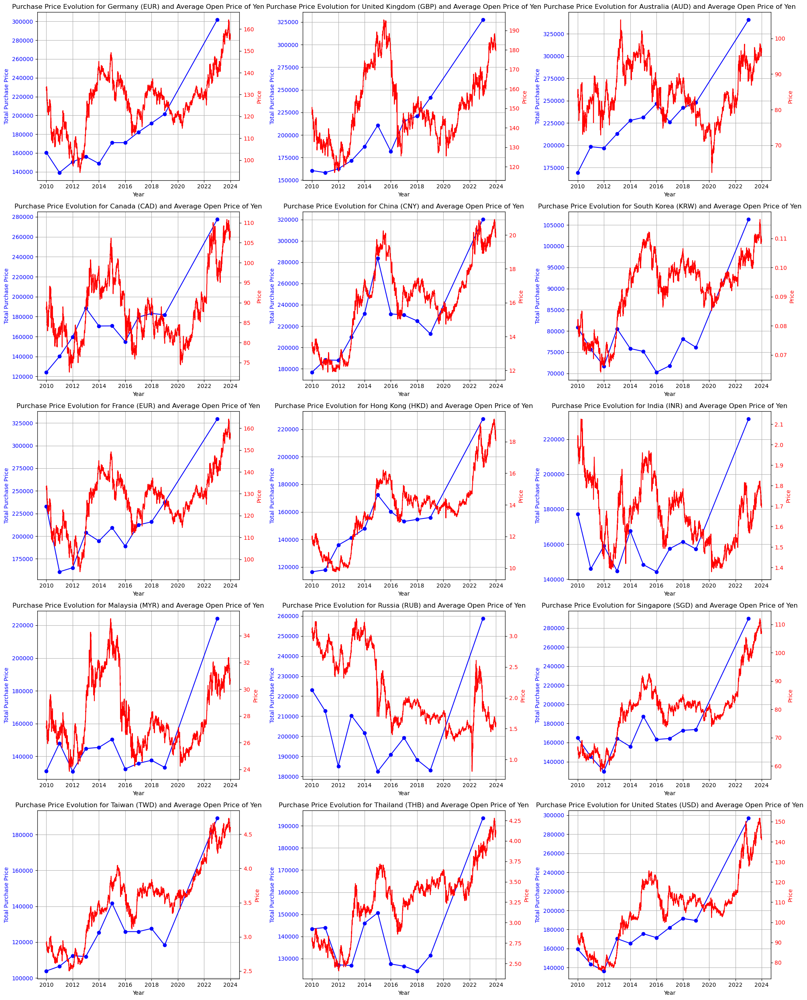

In [90]:
import matplotlib.pyplot as plt

def plot_country_purchase_price_evolution(ax, country):
    # Select the relevant data for the selected country 
    df_country = df_global[df_global['Country/Area'] == country]
    df_country = df_country[df_country['Category'] == 'Total']

    # Ensure 'Year' is in datetime format
    df_country['Year'] = pd.to_datetime(df_country['Year'], format='%Y-%m-%d')

    # Plot the total purchase price evolution on the left y-axis
    ax.plot(df_country['Year'], df_country['Purchase Price'], marker='o', linestyle='-', color='b', label=f'Total Purchase Price')
    ax.set_xlabel('Year')
    ax.set_ylabel('Total Purchase Price', color='b')
    ax.tick_params(axis='y', labelcolor='b')
    ax.set_title(f'Purchase Price Evolution for {country} ({currency_codes[country]}) and Average Open Price of Yen')
    ax.grid(True)

    # Create a second y-axis for the average yen open price for the associated country
    df_currency = return_currency(currency_codes[country])
    ax2 = ax.twinx()
    ax2.plot(df_currency['Date'], df_currency['Price'], linestyle='-', color='r', label='Average Open Price (Yen)')
    ax2.set_ylabel('Price', color='r')
    ax2.tick_params(axis='y', labelcolor='r')

# List of countries to plot
countries = df_global['Country/Area'].unique()
cols_per_row = 3
num_countries = len(countries)
num_rows = (num_countries + cols_per_row - 1) // cols_per_row

fig, axes = plt.subplots(num_rows, cols_per_row, figsize=(20, 5 * num_rows))
axes = axes.flatten()

for idx, country in enumerate(countries):
    plot_country_purchase_price_evolution(axes[idx], country)

# Hide any unused subplots
for j in range(idx + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()


The first observation we can make here is that for every country, there was a great raise in the amount of money spent. It would however be hard to determine how much of this is due to the changes in convertion rate, because the global pandemic happened in this timeframe, and it changed people's behaviour. For example, we can hypothesize that people have been saving money and could spend more. Also, as we do not have data between 2019 and 2023, so it is hard to know the evolution of the curve, even if tourism in Japan was restricted during this period.

However, we can still observe some interesting facts:
- The two curves appear to be the most correlated for asian countries (Taiwan, Singapore, China, Hong Kong), but South Korea has surprisingly one of the less correlated curve.
- Countries that share the same currency (Germany and France) have very similar curves.
- For almost all currencies, the JPY began its fall in 2020 during the pandemic

It is important to think about other factors that can influence the amount of money spent by tourists. To try to understand better the dynamics, we will add to our graphs the evolution of the real GDP per capita of Germany, United Kingdom, Australia, Canada, South Korea, France and United States. These are the countries we can find data on the [oecd](https://data-explorer.oecd.org/vis?fs[0]=Topic%2C1%7CEconomy%23ECO%23%7CNational%20accounts%23ECO_NAD%23&fs[1]=Topic%2C3%7CEconomy%23ECO%23%7CNational%20accounts%23ECO_NAD%23%7CGDP%20and%20non-financial%20accounts%23ECO_NAD_GNF%23%7CHousehold%20indicators%20dashboard%23ECO_NAD_GNF_HSH%23&pg=0&fc=Topic&snb=2&df[ds]=dsDisseminateFinalDMZ&df[id]=DSD_HHDASH%40DF_HHDASH_CTRY&df[ag]=OECD.SDD.NAD&df[vs]=1.0&pd=2010-Q1%2C2023-Q4&dq=Q.GBR%2BUSA%2BKOR%2BFRA%2BCAN%2BAUS%2BDEU.B1GQ_R_POP.&to[TIME_PERIOD]=false&vw=tb) website. 

In [91]:
df_r = pd.read_csv('datas/Monnaies-Yen/Real_gross_domestic_product_per_capita.csv')
df_r = df_r[['Mesure', 'Zone de référence', 'TIME_PERIOD', 'OBS_VALUE']]
df_r['TIME_PERIOD'] = pd.PeriodIndex(df_r['TIME_PERIOD'], freq='Q').to_timestamp()
df_r['Zone de référence'] = df_r['Zone de référence'].replace(traductions)

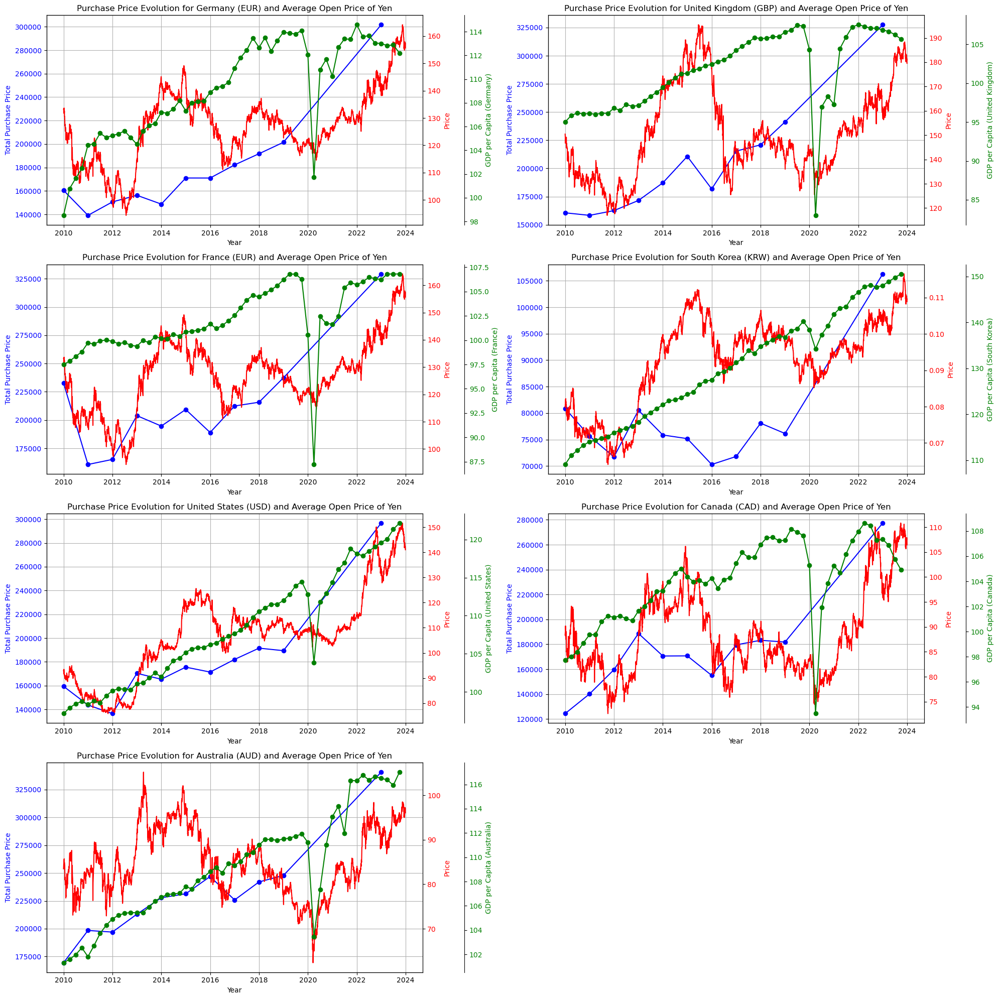

In [92]:
def plot_country_purchase_price_evolution(ax, country):
    # Select the relevant data for the selected country 
    df_country = df_global[df_global['Country/Area'] == country]
    df_country = df_country[df_country['Category'] == 'Total']

    # Ensure 'Year' is in datetime format
    df_country['Year'] = pd.to_datetime(df_country['Year'], format='%Y-%m-%d')

    # Plot the total purchase price evolution on the left y-axis
    ax.plot(df_country['Year'], df_country['Purchase Price'], marker='o', linestyle='-', color='b', label=f'Total Purchase Price')
    ax.set_xlabel('Year')
    ax.set_ylabel('Total Purchase Price', color='b')
    ax.tick_params(axis='y', labelcolor='b')
    ax.set_title(f'Purchase Price Evolution for {country} ({currency_codes[country]}) and Average Open Price of Yen')
    ax.grid(True)

    # Create a second y-axis for the average yen open price for the associated country
    df_currency = return_currency(currency_codes[country])
    ax2 = ax.twinx()
    ax2.plot(df_currency['Date'], df_currency['Price'], linestyle='-', color='r', label='Average Open Price (Yen)')
    ax2.set_ylabel('Price', color='r')
    ax2.tick_params(axis='y', labelcolor='r')

    # Add a third curve for the evolution of real GDP per capita for the country
    if country in df_r['Zone de référence'].unique():
        df_gdp = df_r[df_r['Zone de référence'] == country]
        ax3 = ax.twinx()
        ax3.spines['right'].set_position(('outward', 60))
        ax3.plot(df_gdp['TIME_PERIOD'], df_gdp['OBS_VALUE'], marker='o', linestyle='-', color='g', label=f'{country} GDP per Capita')
        ax3.set_ylabel(f'GDP per Capita ({country})', color='g')
        ax3.tick_params(axis='y', labelcolor='g')

# List of countries to plot
countries = df_r['Zone de référence'].unique()
cols_per_row = 2
num_countries = len(countries)
num_rows = (num_countries + cols_per_row - 1) // cols_per_row

fig, axes = plt.subplots(num_rows, cols_per_row, figsize=(20, 5 * num_rows))
axes = axes.flatten()

for idx, country in enumerate(countries):
    plot_country_purchase_price_evolution(axes[idx], country)

# Hide any unused subplots
for j in range(idx + 1, len(axes)):
    axes[j].set_visible(False)

plt.tight_layout()
plt.show()

And as we expected, the real GDP is also very correlated to the evolution of the travel spendings. It is however important to notice that we do not have data here for countries such as China, Taiwan or Singapore, which were the ones that seemed to depent the most about the exchange rates.  

### 12.0.1 - Conclusion

It is difficult to explicit how much of an impact the exchange rates of different currencies have on the travel spendings. By adding a control variable, here the evolution of the real GDP, we observed that the travel spendings depend on more than one factor, and that its impact is different for separate countries (e.g. for Russia the impact is much less important than for Taiwan). That can also be a cause of stronger inequalities in these countries, but it is not something that will be researched further here.  
Still, the impact of the exchange rate is not negligible, and in every case a weaker JPY implies more money spent by the tourists, and a stronger JPY implies less money spent by the tourists.  


### 12.0.2 - Using a model for further analysis 

We will now try to observe using a linear model if we can predict how much money is spent by travelers by using the conversion rate from their original country, and the real GDP per capita.

We first want to aggregate all the data we have into one dataframe that we will use as a model. As some data are daily and some are annual, we will create a dataframe that fills the missing values using a linear method (which is the same as if we drew a line between two points and took the value corresponding to that line for a specific date), because it seems to be the most accurate method here. Of course, each country is linked to its own conversion rate and GDP per capita.

We now want to create a model using the newly aggregated data. We will want to predict the evolution for the period 2020-2023 and see if it could plausible with the shape of the curve.

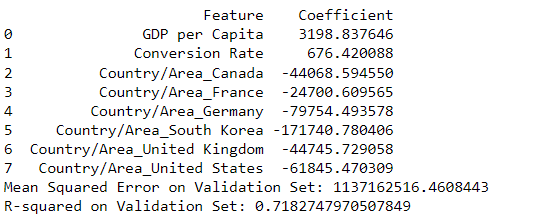

As shown by the coefficient of the model, the GDP per Capita seems to be much more impactful to predict the money spent, but the conversion rate is still an important factor. As the conversion rate is much more volatile, having a lower coefficient allows to stabilize the curve, and it is what the model tries to do here because the predicted value is very linear.

When evaluating our model, it is important to point out that a linear model with a high R² but also a high Mean Squared Error might suggest that, although the model explains a significant portion of the variance in the data, there are still substantial errors in predictions on individual points. This can occur if the target values are on a large scale or if extreme values influence the MSE. In our case, we do have extreme values (in the Covid Period), but we can still significantly predict the values.

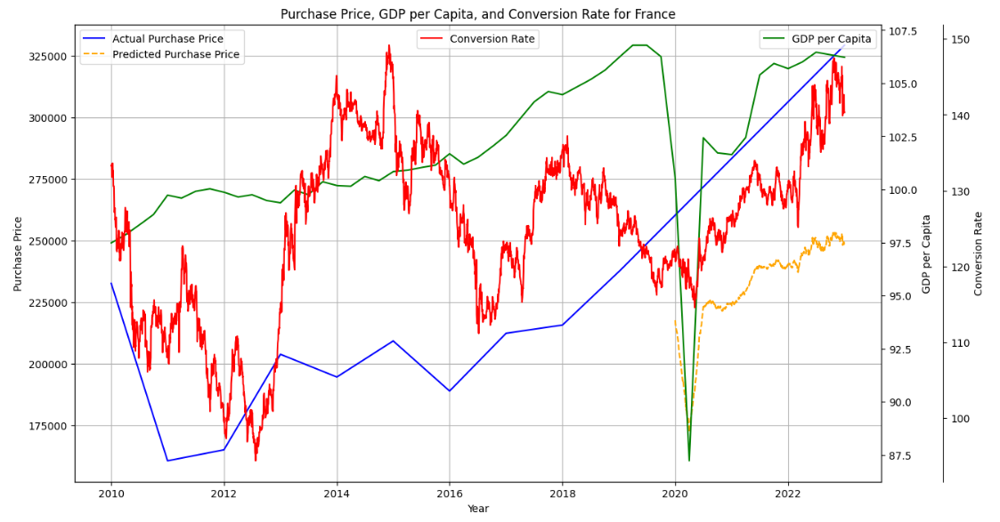

### 12.0.3 - Summary 
When plotting the predictions for the spent money, for every available country there is a major drop during the pandemic period. This is easily explainable, as the GDP per capita holds the most weight in the prediction and this variable always drops during the covid era. Of course, we can not display it because we do not have the data but the money spent by tourists during this time period is almost non-existent as the borders were closed. 
However, after this drop, we can notice that the predicted curve is always below reality. We can try to explain this with other external factors, like people have not spent any money for travels during the pandemic so they had more money to spend after. The fact that the prediction is below the curve was to be anticipated because the peak of money spent by tourists is always 2023, but for the other variables they have different peaks during different periods of time.

To conclude, it is hard todeterine how much the conversion rate impacts the spending of tourists in Japan, as it depends on many other external factors. However, it seems to have a non-negligeable impact on it.

# 13 - Chapter  - Production of Goods <a id="chapter5"></a>

In [93]:
indus_prod = pd.read_csv('data/industrial_production_production.csv', delimiter=';', header=0)
indus_prod = indus_prod.drop(0)
indus_prod.rename(columns={'Unnamed: 0': 'DATE'}, inplace=True)
indus_prod.drop(columns=['DATE'], inplace=True)
indus_prod.rename(columns={'ITEM NAME': 'Date'}, inplace=True)
indus_prod['Date'] = pd.to_datetime(indus_prod['Date'].str[:6] + '01', format='%Y%m%d')
indus_prod

,Date,Mining and manufacturing,Manufacturing,"Iron, steel and Non-ferrous metals",Iron and steel,Iron and steel crude products,Hot rolled steel,Cold finished steel,Steel pipes and tubes,Metallic coated steel,...,Furniture,Printing,Rubber products,Other products,Watches and clocks,Instrument,Toys,Stationery,Leather goods,Mining
1,1978-01-01,"63,1","62,9",-,"114,9","117,7","109,2","96,2","218,4","84,5",...,"196,8",-,"77,0","85,6","103,1","413,2","26,7","73,7","762,5","232,5"
2,1978-02-01,"66,4","66,1",-,"112,6","106,4","107,3","94,5","216,5","83,3",...,"231,5",-,"80,9","85,0","108,4","390,0","28,3","72,5","891,1","233,9"
3,1978-03-01,"74,6","74,3",-,"121,3","117,2","113,4","102,2","237,9","86,2",...,"255,5",-,"90,1","91,5","109,3","413,6","30,4","79,6","961,7","254,9"
4,1978-04-01,"72,0","71,9",-,"117,6","117,2","111,0","99,5","213,6","87,3",...,"239,8",-,"86,9","92,7","105,3","436,0","32,3","72,7","967,6","225,3"
5,1978-05-01,"70,2","70,1",-,"121,5","120,7","114,6","104,7","222,4","92,8",...,"220,0",-,"85,1","88,9","106,2","399,3","30,6","75,7","916,6","229,1"
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
536,2022-08-01,"100,8","100,8","101,4","104,7","106,0","106,9","103,0","95,9","100,3",...,"93,7","89,6","95,9","113,6","147,6","97,8","106,7","114,2","89,8","92,8"
537,2022-09-01,"112,1","112,2","108,9","108,2","102,3","104,4","110,6","102,5","104,3",...,"100,9","100,2","115,8","123,9","144,9","121,1","121,1","122,0","99,0","88,7"
538,2022-10-01,"105,4","105,4","110,0","110,1","105,0","110,1","109,1","102,4","109,5",...,"101,3","99,3","119,1","120,4","140,6","119,8","117,2","117,9","99,0","94,1"
539,2022-11-01,"108,6","108,7","110,2","109,8","102,8","108,5","108,3","104,7","103,9",...,"111,4","100,3","118,9","122,2","144,1","118,0","118,2","121,6","96,3","93,6"


In [94]:
prod_usdyen = pd.merge(indus_prod, usd_yen[['Date', 'Price']], on='Date', how='left')

def clean_and_convert_numeric_columns(df):
    for col in df.columns[1:]: 
        df[col] = df[col].astype(str).replace('-', np.nan)  
        df[col] = df[col].str.replace(',', '.').astype(float)
    return df

prod_usdyen = clean_and_convert_numeric_columns(prod_usdyen)

In [95]:
pd.set_option('display.max_rows', None)
prod_corr = prod_usdyen.corr()['Price'].sort_values(ascending=False)
print("Correlation between Yen and Production Sectors:\n", prod_corr)
pd.reset_option('display.max_rows')

Correlation between Yen and Production Sectors:
 Price                                                                            1.000000
Agricultural machinery                                                           0.796738
Mining                                                                           0.789345
Chemical fertilizer                                                              0.788793
Fabric                                                                           0.788448
Other ceramic products and stone products                                        0.782617
Textiles                                                                         0.740368
Wood and wood products                                                           0.736167
Motorcycles                                                                      0.727292
Leather goods                                                                    0.720228
Dyeing and finishing processes                     

#### Analysis and Interpretation

**Positive Correlations**
Agricultural machinery demonstrates a strong positive correlation with the USD/Yen exchange rate. As the yen weakens against the USD, the production of agricultural machinery increases. A possible explanation for this outcome is that a weaker yen makes Japanese agricultural machinery more competitive in international markets, boosting exports. Additionally, the agricultural sector in Japan might invest more in machinery to enhance productivity and offset higher costs of imported agricultural products.

The mining sector also exhibits a strong positive correlation with the USD/Yen exchange rate. A weaker yen likely makes Japanese mining exports more attractive globally, increasing production. Additionally, a weaker yen could raise the cost of importing raw materials and energy, encouraging domestic mining activities to reduce dependency on imports.

The production of chemical fertilizers shows a significant positive correlation with the USD/Yen exchange rate. As the yen depreciates, the cost of importing raw materials for fertilizers increases, prompting domestic production to ramp up to meet local demand and reduce import reliance. Additionally, a weaker yen makes Japanese fertilizers more competitive in international markets, enhancing export opportunities.

The fabric production sector's positive correlation with the USD/Yen exchange rate suggests that a weaker yen boosts domestic production. This could be due to increased demand for Japanese fabrics both domestically, as import substitution occurs due to higher prices of imported fabrics, and internationally, as Japanese fabrics become more competitively priced.

**Negative Correlations**

Chemicals exhibit a strong negative correlation with the USD/Yen exchange rate. This suggests that as the yen appreciates, the production of chemicals decreases. An appreciated yen makes imported chemicals cheaper, reducing the need for domestic production. Additionally, the global competitiveness of Japanese chemical exports declines with a stronger yen, leading to lower production levels.

The pulp, paper, and paper products sector shows a significant negative correlation with the USD/Yen exchange rate. A stronger yen makes imported paper products more affordable, decreasing the demand for domestic production. Furthermore, the competitive disadvantage of Japanese paper products in international markets due to a stronger yen reduces export demand, leading to lower production.

The non-ferrous metals sector also displays a strong negative correlation with the USD/Yen exchange rate. An appreciated yen reduces the cost of importing non-ferrous metals, leading to a decrease in domestic production. The competitive disadvantage in exporting these metals when the yen is strong further lowers production levels.

Manufacturing overall shows a negative correlation with the USD/Yen exchange rate. A stronger yen increases the cost of Japanese manufactured goods in global markets, reducing exports. Additionally, the affordability of imported manufactured goods rises with a stronger yen, further dampening domestic production.

#### Summary
The correlation analysis highlights distinct impacts of the USD/Yen exchange rate on various production sectors. Sectors such as agricultural machinery, mining, chemical fertilizers, fabrics, and ceramic products benefit from a weaker yen, which enhances their competitiveness in global markets and boosts domestic production to offset higher import costs. Conversely, sectors such as chemicals, pulp and paper products, paperboard, non-ferrous metals, and manufacturing are negatively impacted by a stronger yen, which reduces their global competitiveness and increases the attractiveness of imported goods.

These findings underscore the complex interplay between exchange rate movements and industrial output. Policymakers and business leaders must consider these dynamics when formulating strategies to mitigate risks and capitalize on opportunities presented by currency fluctuations. Understanding how different sectors respond to exchange rate changes can inform targeted interventions to enhance the resilience and competitiveness of the Japanese economy in the global marketplace.

Don't know yet how to use this part

| Sector                           | Export Correlation | Import Correlation | Production Correlation |
|----------------------------------|--------------------|--------------------|------------------------|
| Textiles                         | 0.624630           | 0.212235           | 0.740368               |
| Wood Products                    | -0.654932          | 0.049506           | 0.736167 (Wood and wood products) |
| Metals                           | 0.578608           | -0.075490          | -0.684725(steel pipes and tubes),0.320088 (frabricated metals)        |
| Plastics and Rubbers             | 0.546862           | -0.106273          | --0.382185 (plastic product)                      |
| Machines                         | 0.488134           | -0.415218          | 0.509438 (Production machinery),0.482805 (Electronics circuits),-0.691991 (electronic devices) |
| Transportation                   | 0.416009           | -0.477334          | -0.585091 (Transport equipment),0.727292 (motocycles) |
| Mineral Products                 | 0.102426           | 0.492318           | -0.704554 (Mining and manufacturing),0.697088(coal product), |
| Chemical Products                | -0.088200          | -0.285420          | -0.835358 (Chemicals) |
| Instruments                      | -0.031676          | -0.343810          | 0.688143               |
| Foodstuffs                       | -0.473827          | -0.023347          | -0.255226 (nooddles)      |
| Animal Hides                     | 0.584089           | -0.307379          | -0.720228 (leather goods)  |
| Paper Goods                      | 0.089103           | 0.731489           | -0.812121 (Pulp, paper and paper products) |
| Vegetable Products               | 0.053591           | 0.250296           | -0.300553 (vegetables food items)  |


### 13.0.1 - Comparative Correlation Analysis Across Sectors


#### Interpretation and Hypotheses
**Cross-Sectoral Insights:**

- **High Correlation in Exports and Low in Imports**: Sectors like Textiles and Metals show strong positive export correlations, suggesting a stronger yen boosts their global competitiveness due to branding or quality perceptions. Their low import correlations indicate either sufficient domestic production capacity or strategic import substitution.

- **Negative Export Correlation with Positive Import Correlation**: Foodstuffs and Wood Products exhibit this pattern, likely because these essential commodities are less impacted by currency fluctuations.

- **Complex Machine and Transportation Sectors**: These sectors show mixed correlations. Machines have positive correlations in exports and production but negative in imports, highlighting Japan’s strong domestic machinery industry that competes globally despite a strong yen. Transportation shows negative correlations in both import and production but a positive in exports for Motorcycles, indicating niche markets or specialized production benefiting from a strong yen.

- **Mineral and Chemical Products**: These sectors show a stark contrast, with Mineral Products having a weak positive correlation in exports but strong positive in imports, reflecting Japan's dependency on mineral imports like coal. Chemical Products consistently show negative correlations, suggesting high sensitivity to price increases due to global competition and alternative sources.

**Economic Hypotheses:**

- **Strategic Import Substitution and Export Competitiveness**: Sectors with strong domestic industries (like Machines and Metals) are resilient to yen appreciation, maintaining or increasing export capacities. Sectors relying on imports for raw materials (like Mineral and Paper Goods) face increased costs not fully passed through to international markets.

- **Impact of Yen on Essential vs. Luxury Goods**: Essential sectors (like Foodstuffs and Wood Products) show less sensitivity to yen fluctuations, maintaining import volumes to meet domestic needs. Luxury or non-essential sectors (like Arts and Antiques or high-end Machines) may see reduced activity as the yen strengthens, affecting both import costs and export competitiveness.

This analysis provides a nuanced view of how different sectors react to changes in the yen's value, influenced by market positioning, domestic production capabilities, and global economic dynamics.

# 14 - Final Conclusion

Thus, the research looks at the after-effects the devaluation of Japan's currency has had on various sections of the Japanese economy, such as household consumption, import/export trading, tourism, and production. We examine the yen's current exchange rates against the US Dollar, the Chinese Yuan, as well as the JXY index to find out how these variables contribute in Japan's economy and in the overall socioeconomic growth of its populace. We obtained significant insights with the models of OLS, VAR,ARDL and NARDL into the fluctuation's impact on various sectors.

Apart from that, Japan boasts of being the third-largest economy in terms of technology and manufacturing, characterized by motor vehicles, electronics, robotics, and precision machinery. The service sector of finance, real estate, and tourism is as crucial. Yet Japan has weaknesses: an aging population, deflation, and slow growth of GDP. Consequently, the government and the Bank of Japan are actively engaged in monetary and fiscal policy adjustments for the stabilization and stimulation of economy.

Our results suggest that exchange rates, especially of USD/JPY, JXY, and CNY/JPY, affect different economic activities in Japan.

For instance, a stronger yen usually weakens Japanese exports but cheapens the price of imports, thus affecting trade balances. A stronger yen favors exports, yet also raises the prices of Japanese goods for foreign consumers. Meanwhile, the weaker yen would boost export by cheaper prices of Japanese goods for foreign consumers. However, it also increases import prices that reduce household purchasing power and consumption.

Household consumption is a major component of GDP, and the level of exchange rates affects it greatly. If the yen is weaker, it may push up the price of imports, which reduces the purchasing power and consumption of households. When the yen is stronger, the import price will be low and household consumption capacity will be improved. To show an interesting interplay among exchange rates and household economic behavior, mean salary levels and house prices were also looked into.

Looking at this from the point of view of import and export operations, it is always the case that the value of the yen remains important for export and import volumes. When the yen is low, then exports from Japan always shoot up because prices abroad always go down; it is the opposite with regard to imports, which rise when the yen is strong simply because the price of foreign goods becomes lower. And so the results indicated that exchange rate management was essential to maintain a more positive trade balance.

Another sector that greatly affects the value of yen is tourism. A decrease in the value of yen makes Japan a better tourist destination to foreigners. The direct effect would be in increased tourism revenues. In an opposite way, a stronger yen would discourage foreign tourists but make the people in Japan prefer to travel abroad. Another area where exchange rate fluctuations bring their effects is in the production sector, which is a blend of many industries. A weak yen will lower the cost of exporting goods while hiking the cost of importing raw materials. The research put into focus how various sectors adapt to such changes, underlining that strategic planning and policy making should be directed at reducing adverse effects. In a nutshell, this paper has been developed to describe in detail the effect of fluctuations in the yen on other sectors of the economy. The results show that exchange rate movements have complex effects related to GDP growth and household consumption, trade balances, and tourism. On this score, policymakers should intervene by reading the dynamics of such forces to shape strategies in favor of economic resilience and sustainable growth.